# Introduction

In this markdown, I will attempt to do an analysis of credit card data to classify fraudulent transactions from genuine ones based on several parameters. The data is obtained from kaggle and generated using the python library : faker to imitate real data. 

This data is obtained from the following link : https://www.kaggle.com/kartik2112/fraud-detection

The data will be analyzed in the following sequence: 

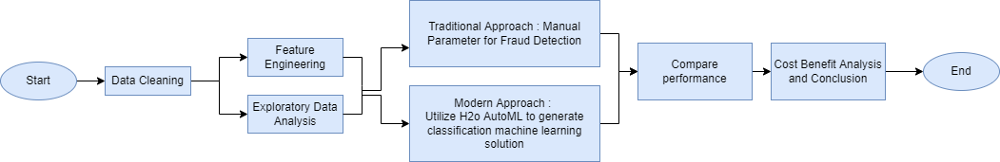

General assumption : 
* All transaction amount(s) are is USD
* The threshold for blocking transaction(s) are >50% 

# Importing Libraries

To assist in the data analysis process, I will use the following libraries : 

In [558]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from datetime import datetime
import reverse_geocoder as rg
import haversine as hs
import datetime
import calendar
import pycountry
from IPython.display import display
from sklearn.metrics import classification_report

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Importing Data and Variable Explanation

The data consists of two sets, which are the training and testing set. During the data analysis process, the training data will be used to create parameters and machine learning model to classify data. The performance of the model will then be tested on "unseen data" which is the testing set.

The variable explanation is as follows : 

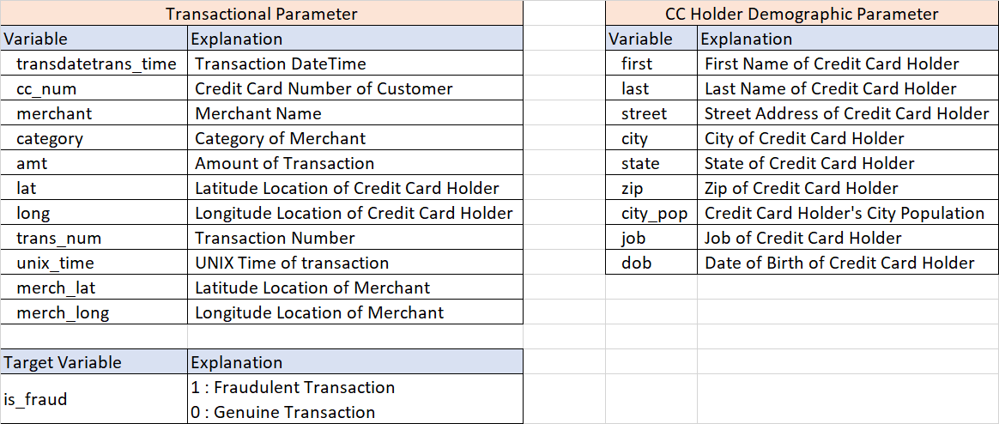

Now, I will import the data from the respective csv files.

In [3]:
df_train=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\Data alternatif\fraudTrain.csv")

In [4]:
df_test=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\Data alternatif\fraudTest.csv")

In [5]:
print("train data dimension:",df_train.shape[0],'rows',df_train.shape[1],'columns')
print("test data dimension:",df_test.shape[0],'rows',df_test.shape[1],'columns')

train data dimension: 1296675 rows 23 columns
test data dimension: 555719 rows 23 columns


# Assumptions and Threshold 

Performance metrics thresholds : 

* Industry standard : >= 90% detection rate
* Maximum threshold of 10:1 genuine to fraud transaction alert ratio

Assumption for analysis :

* Revenue margin is 5% of total transaction amount
* All transaction alerts are directly blocked



# Data Cleaning

In this section, I will inspect the data for any discrepancies in formats or any missing values.

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 23 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             555719 non-null  int64  
 1   trans_date_trans_time  555719 non-null  object 
 2   cc_num                 555719 non-null  int64  
 3   merchant               555719 non-null  object 
 4   category               555719 non-null  object 
 5   amt                    555719 non-null  float64
 6   first                  555719 non-null  object 
 7   last                   555719 non-null  object 
 8   gender                 555719 non-null  object 
 9   street                 555719 non-null  object 
 10  city                   555719 non-null  object 
 11  state                  555719 non-null  object 
 12  zip                    555719 non-null  int64  
 13  lat                    555719 non-null  float64
 14  long                   555719 non-nu

As can be seen, there is a column called Unamed : 0. It's unclear what this column is, so I will inspect the data using .head()

In [8]:
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [9]:
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,...,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,...,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,...,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,...,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,...,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [10]:
df_train['Unnamed: 0'].nunique()

1296675

In [11]:
df_test['Unnamed: 0'].nunique()

555719

The number of unique values is the same as the number of rows, there is no meaningful information whatsoever upon final inspection, so I will delete the column.

In [12]:
df_train.drop(['Unnamed: 0'],axis=1,inplace=True)
df_test.drop(['Unnamed: 0'],axis=1,inplace=True)

Aside from that, It can also be seen from the merchant column that all merchant names has a prefix of fraud_. So I will inspect how many of the columns has the prefix fraud_

In [13]:
len(df_train['merchant'].str.contains('fraud_'))

1296675

In [14]:
len(df_test['merchant'].str.contains('fraud_'))

555719

Turns out, the all the merchant columns has a prefix fraud_. So, I will remove the prefix from all rows of the merchant column.

In [15]:
df_train['merchant']=df_train['merchant'].str.replace("fraud_","")
df_test['merchant']=df_test['merchant'].str.replace("fraud_","")

Next, I will inspect if the data has any missing rows

In [16]:
df_train.isna().sum()

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [17]:
df_test.isna().sum()

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

Turns out, there is no missing values and next I wil inspect if the data type is already appropriate.

In [18]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 22 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   trans_date_trans_time  1296675 non-null  object 
 1   cc_num                 1296675 non-null  int64  
 2   merchant               1296675 non-null  object 
 3   category               1296675 non-null  object 
 4   amt                    1296675 non-null  float64
 5   first                  1296675 non-null  object 
 6   last                   1296675 non-null  object 
 7   gender                 1296675 non-null  object 
 8   street                 1296675 non-null  object 
 9   city                   1296675 non-null  object 
 10  state                  1296675 non-null  object 
 11  zip                    1296675 non-null  int64  
 12  lat                    1296675 non-null  float64
 13  long                   1296675 non-null  float64
 14  city_pop          

In [19]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   trans_date_trans_time  555719 non-null  object 
 1   cc_num                 555719 non-null  int64  
 2   merchant               555719 non-null  object 
 3   category               555719 non-null  object 
 4   amt                    555719 non-null  float64
 5   first                  555719 non-null  object 
 6   last                   555719 non-null  object 
 7   gender                 555719 non-null  object 
 8   street                 555719 non-null  object 
 9   city                   555719 non-null  object 
 10  state                  555719 non-null  object 
 11  zip                    555719 non-null  int64  
 12  lat                    555719 non-null  float64
 13  long                   555719 non-null  float64
 14  city_pop               555719 non-nu

In [20]:
df_train['trans_date_trans_time']=df_train['trans_date_trans_time'].astype('datetime64[ns]')
df_test['trans_date_trans_time']=df_test['trans_date_trans_time'].astype('datetime64[ns]')
df_train['dob']=df_train['dob'].astype('datetime64[ns]')
df_test['dob']=df_test['dob'].astype('datetime64[ns]')

In [21]:
df_train[['cc_num', 'merchant', 'category','first', 'last', 'gender', 'street', 'city', 'state','job','is_fraud']]=df_train[['cc_num', 'merchant', 'category','first', 'last', 'gender', 'street', 'city', 'state','job','is_fraud']].astype('category')
df_test[['cc_num', 'merchant', 'category','first', 'last', 'gender', 'street', 'city', 'state','job','is_fraud']]=df_test[['cc_num', 'merchant', 'category','first', 'last', 'gender', 'street', 'city', 'state','job','is_fraud']].astype('category')

By inspecting the columns, I can see that some of the data types are still incorrect, such as : 

* trans_date_trans_time, 'dob' : Should be in datetime format
* cc_num, merchant, category, first, last, gender, street, city, state,job,is_fraud : Data type should be categorical


In [22]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 22 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   trans_date_trans_time  1296675 non-null  datetime64[ns]
 1   cc_num                 1296675 non-null  category      
 2   merchant               1296675 non-null  category      
 3   category               1296675 non-null  category      
 4   amt                    1296675 non-null  float64       
 5   first                  1296675 non-null  category      
 6   last                   1296675 non-null  category      
 7   gender                 1296675 non-null  category      
 8   street                 1296675 non-null  category      
 9   city                   1296675 non-null  category      
 10  state                  1296675 non-null  category      
 11  zip                    1296675 non-null  int64         
 12  lat                    12966

In [23]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   trans_date_trans_time  555719 non-null  datetime64[ns]
 1   cc_num                 555719 non-null  category      
 2   merchant               555719 non-null  category      
 3   category               555719 non-null  category      
 4   amt                    555719 non-null  float64       
 5   first                  555719 non-null  category      
 6   last                   555719 non-null  category      
 7   gender                 555719 non-null  category      
 8   street                 555719 non-null  category      
 9   city                   555719 non-null  category      
 10  state                  555719 non-null  category      
 11  zip                    555719 non-null  int64         
 12  lat                    555719 non-null  floa

In [24]:
for columns in df_train.columns:
    print(columns,":",df_train[columns].nunique())

trans_date_trans_time : 1274791
cc_num : 983
merchant : 693
category : 14
amt : 52928
first : 352
last : 481
gender : 2
street : 983
city : 894
state : 51
zip : 970
lat : 968
long : 969
city_pop : 879
job : 494
dob : 968
trans_num : 1296675
unix_time : 1274823
merch_lat : 1247805
merch_long : 1275745
is_fraud : 2


In [25]:
for columns in df_test.columns:
    print(columns,":",df_test[columns].nunique())

trans_date_trans_time : 544760
cc_num : 924
merchant : 693
category : 14
amt : 37256
first : 341
last : 471
gender : 2
street : 924
city : 849
state : 50
zip : 912
lat : 910
long : 910
city_pop : 835
job : 478
dob : 910
trans_num : 555719
unix_time : 544760
merch_lat : 546490
merch_long : 551770
is_fraud : 2


From the code output, it can be seen that trans_num and unix_time column is pretty much redundant since trans_num is unique for every rows and unix_time column is already represented by trans_date_trans_time so I will drop those columns from the dataframe.

In [26]:
df_train.drop(['trans_num','unix_time'],axis=1,inplace=True)
df_test.drop(['trans_num','unix_time'],axis=1,inplace=True)

# Function

In this section, I will put all of the functions that will be used on the data analysis in the following sections.

In [27]:
def fraud_metrics(real_data,predicted_data):
    conf_mat=pd.crosstab(real_data,predicted_data)
    A=pd.DataFrame({'Detection Rate':'{:1.2f} %'.format(round((conf_mat.iloc[1][1]/conf_mat.iloc[1].sum())*100,3)),
                        'Genuine to Fraudulent Transaction Alert Ratio':[round((conf_mat.iloc[0][1]/conf_mat.iloc[1][1]),2)]})
    return A

In [28]:
def distance(data):
    coords = (data['lat'], data['long'])
    coords2 = (data['merch_lat'], data['merch_long'])
    return hs.haversine(coords,coords2)


In [29]:
list_alpha_2 = [i.alpha_2 for i in list(pycountry.countries)]
list_alpha_3 = [i.alpha_3 for i in list(pycountry.countries)]    

def country_flag(data):
    if (len(data)==2 and data in list_alpha_2):
        return pycountry.countries.get(alpha_2=data).name
    elif (len(data)==3 and data in list_alpha_3):
        return pycountry.countries.get(alpha_3=data).name
    else:
        return 'Invalid Code'


In [30]:
def colors_from_values(values, palette_name):
    # normalize the values to range [0, 1]
    normalized = (values - min(values)) / (max(values) - min(values))
    # convert to indices
    indices = np.round(normalized * (len(values) - 1)).astype(np.int32)
    # use the indices to get the colors
    palette = sns.color_palette(palette_name, len(values))
    return np.array(palette).take(indices, axis=0)

In [31]:
def time_category(data):
    if 0<=data<=6:
        return "Early Morning"
    if 6<data<=12:
        return "Late Morning"
    if 12<data<=18:
        return "Afternoon"
    if 18<data<=23:
        return "Evening"

In [32]:
def distance(data):
    coords = (data['lat'], data['long'])
    coords2 = (data['merch_lat'], data['merch_long'])
    return hs.haversine(coords,coords2)

In [34]:
def week_number_of_month(date_value):
    week_number = (date_value.isocalendar()[1] - date_value.replace(day=1).isocalendar()[1] + 1)
    if week_number == -46:
        week_number = 6
    return week_number

In [213]:
def fraud_category(data,columns,listed,status):
#     this is a function  that will return % of transaction number over total transaction number, when status is specified to "Yes",
#     it will generate a list of grouping parameter that results in the transaction comprised of >50%
    
    df_ag=pd.DataFrame(data.groupby(columns).size()).reset_index().rename(columns={0:"Counts"})
    m=df_ag.groupby(columns[1:])['Counts'].transform('sum')
    y=df_ag.groupby(columns)['Counts'].transform('sum')
    df_ag['Percentage over total # of Transactions'] = df_ag['Counts'] / m 
    df_ag['Detection Rate'] =(df_ag['Counts'] / data[data['is_fraud']==1].shape[0])
    df_ag['Genuine to Fraud Alert Ratio']=((m-y)/(y))
    if listed =="Plot":
        return df_ag[df_ag['is_fraud']==status].sort_values(by='Percentage over total # of Transactions',ascending=False)
    if listed =="Yes":
        return list(df_ag[df_ag['is_fraud']==status][df_ag[df_ag['is_fraud']==status]['Percentage over total # of Transactions']>=0.5].iloc[:,1])
    if listed == "No":
        df_ag=df_ag[df_ag['is_fraud']==status].sort_values(by='Percentage over total # of Transactions',ascending=False)
        return df_ag.style.format({'Detection Rate': "{:.2%}",'Percentage over total # of Transactions': "{:.2%}"})
        
   

In [37]:
def sort_func2(data,columns,listed,status):
#     this is a function  that will return % of transaction number over total transaction number, when status is specified to "Yes",
#     it will generate a list of grouping parameter that results in the transaction comprised of >50%
    
    df_ag=pd.DataFrame(df_train.groupby(columns)['amt'].sum()).reset_index().rename(columns={'amt':"Total"})
    m=df_ag.groupby(columns[1:])['Total'].transform('sum')
    df_ag['Percentage over total amount of Transactions'] = df_ag['Total'] / m * 100
    if listed == "No":
        return df_ag[df_ag['is_fraud']==status].sort_values(by='Percentage over total amount of Transactions',ascending=False)
    if listed =="Yes":
        return list(df_ag[df_ag['is_fraud']==status][df_ag[df_ag['is_fraud']==status]['Percentage over total amount of Transactions']>=50].iloc[:,1])

In [38]:
def threshold(data,sign,start,end,inc,column):

    ## This function will be used to test out numerical parameters which gives the best performance in separating non fraudulent and fraudulent transactions
    a=[]
    b=[]
    c=[]
    d=[]
    e=[]
    f=[]
    if sign=="<":
        for i in range(start,end,inc):
            b.append(i)
            a.append(((data[data[column]<i]['is_fraud'].value_counts()[1])/(data[data['is_fraud']==1].shape[0])))
            c.append((data[data[column]<i]['is_fraud'].value_counts()[1]))
            d.append((data[data[column]<i]['is_fraud'].value_counts()[0]))
            e.append(data[data[column]<i]['is_fraud'].value_counts()[0]/data[data[column]<i]['is_fraud'].value_counts()[1])
            f.append(data[data[column]<i]['is_fraud'].value_counts()[1]/data[data[column]<i]['is_fraud'].value_counts().sum())
            z=pd.DataFrame({'Threshold':b,'Fraud Detection Rate':a,'Number of Fraud':c,'Number of Genuine Transaction':d,
                           'Genuine to Fraud Transaction Ratio':e,
                           'Fraud Transaction/Total Transaction':f})
            
        return z
    if sign==">":
        for i in range(start,end,inc):
            b.append(i)
            a.append(((data[data[column]>i]['is_fraud'].value_counts()[1])/(data[data['is_fraud']==1].shape[0])))
            c.append((data[data[column]>i]['is_fraud'].value_counts()[1]))
            d.append((data[data[column]>i]['is_fraud'].value_counts()[0]))
            e.append(data[data[column]>i]['is_fraud'].value_counts()[0]/data[data[column]>i]['is_fraud'].value_counts()[1])
            f.append(data[data[column]>i]['is_fraud'].value_counts()[1]/data[data[column]>i]['is_fraud'].value_counts().sum())
            z=pd.DataFrame({'Threshold':b,'Fraud Detection Rate':a,'Number of Fraud':c,'Number of Genuine Transaction':d,
                            'Genuine to Fraud Transaction Ratio':e,'Fraud Transaction/Total Transaction':f})
            
        return z


# Feature Engineering

In this section, I will generate a few features in order to make the data analysis easier. 

* Distance column : to calculate distance between merchant and cc holder using latitude and longtitude using haversine distance, which is measured in km.
* Country, Admin-1 region, Admin-2 region : Added for both merhcant and cc holder to analyze location of merchant and cc holder 
* Time category colums : to analyze time frame of fraud occurence
* Day and Hour for transaction date
* Age using dob column

In [39]:
coords = tuple(zip(df_train['merch_lat'], df_train['merch_long']))

results_rg = rg.search(coords)
results_cc = [x.get('cc') for x in results_rg]
results_count=[country_flag(a) for a in results_cc]
df_train['merchant_country'] = results_count
coords2 = tuple(zip(df_train['lat'], df_train['long']))

results_rg2 = rg.search(coords2)
results_cc2 = [x.get('cc') for x in results_rg2]
results_count2=[country_flag(a) for a in results_cc2]
df_train['cc_holder_country'] = results_count2

results_admin1 = [x.get('admin1') for x in results_rg]
df_train['merchant_admin1'] = results_admin1
results_admin2 = [x.get('admin1') for x in results_rg2]
df_train['cc_holder_admin1'] = results_admin2

results_admin3 = [x.get('admin2') for x in results_rg]
df_train['merchant_admin2'] = results_admin3
results_admin4 = [x.get('admin2') for x in results_rg2]
df_train['cc_holder_admin2'] = results_admin4


Loading formatted geocoded file...


In [40]:
coords = tuple(zip(df_test['merch_lat'], df_test['merch_long']))

results_rg = rg.search(coords)
results_cc = [x.get('cc') for x in results_rg]
results_count=[country_flag(a) for a in results_cc]
df_test['merchant_country'] = results_count
coords2 = tuple(zip(df_test['lat'], df_test['long']))

results_rg2 = rg.search(coords2)
results_cc2 = [x.get('cc') for x in results_rg2]
results_count2=[country_flag(a) for a in results_cc2]
df_test['cc_holder_country'] = results_count2

results_admin1 = [x.get('admin1') for x in results_rg]
df_test['merchant_admin1'] = results_admin1
results_admin2 = [x.get('admin1') for x in results_rg2]
df_test['cc_holder_admin1'] = results_admin2

results_admin3 = [x.get('admin2') for x in results_rg]
df_test['merchant_admin2'] = results_admin3
results_admin4 = [x.get('admin2') for x in results_rg2]
df_test['cc_holder_admin2'] = results_admin4


In [41]:
df_train['distance']=df_train.apply(distance,axis=1)


<div>
<img src="attachment:image.png" width="500"/>
</div>

In [42]:
df_train['day']=df_train['trans_date_trans_time'].dt.strftime('%A')
df_train['hour']=df_train['trans_date_trans_time'].dt.hour
df_train['time category']=df_train['hour'].apply(time_category)

# Exploratory Data Analysis

The exploratory data analysis would be mostly conducted in the following sequence :

* Analyze General Transaction Trend
* Analyze Fraudulent transaction Trends
* Analyze Fraud transaction in regards to whole population

# Transaction Parameter

## Target Variable 

### # of Fraud Transaction

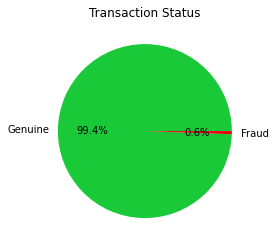

In [43]:
round(df_train['is_fraud'].value_counts(normalize=True),2)
colors = sns.color_palette('bright')[2:4]
label=["Genuine","Fraud"]
#create pie chart
plt.pie(round(df_train['is_fraud'].value_counts(normalize=True),4),labels=label,colors = colors, autopct='%1.1f%%')
plt.title('Transaction Status')
plt.show()


As we can see, there is an imbalance in target variable, where the fraudulent transaction only makes up for 0.6% of total transaction. In creating a fraud transaction classifier, this will be a huge obstacle  as fraud analysts are expected to create a classifier that captures the most fraudulent transaction with minimal false positives as false positives hinders company from earning future revenues.

### Fraud Loss

Under the assumption that 5% of the transaction amount is the revenue margin for successfull transaction(s) :

In [44]:
df_train.groupby('is_fraud')['amt'].sum()

is_fraud
0    87234340.29
1     3988088.61
Name: amt, dtype: float64

In [45]:
87234340.29*0.05

4361717.0145000005

Calculating the net margin which is 5% of genuine transaction amount, we get 4361717 USD as the net revenue

Now, we calculate the fraud loss, under the assumption that for all fraudulent transaction(s), the bank is held liable

In [46]:
df_train.groupby('is_fraud')['amt'].sum()[1]

3988088.61

In [47]:
df_loss=pd.DataFrame({'Net Revenue':[4361717.0145000005],
              'Fraud Loss':[3988088.61]}).melt()
df_loss.set_index=('variable')

In [48]:
round(((3988088.61)/4361717.0145000005)*100,2)

91.43

In [49]:
round(1-(4361717.0145000005-3988088.61)/4361717.0145000005,4)*100

91.43

In [50]:
round(df_train['is_fraud'].value_counts(normalize=True),4)

0    0.9942
1    0.0058
Name: is_fraud, dtype: float64

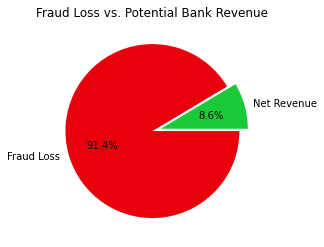

In [51]:
colors = sns.color_palette('bright')[2:4]
label=["Net Revenue","Fraud Loss"]
#create pie chart
plt.pie([8.57,91.43],labels=label,colors = colors, autopct='%1.1f%%',explode=(0.1,0))
plt.title('Fraud Loss vs. Potential Bank Revenue')
plt.show()

As can be seen from the plot above, without any mitigation to minimize fraud loss, the bank will lose 91.4% of its net revenue to fraud loss. Which means that the bank is only able to retain 8.6% of the net revenue.

## trans_date_trans_time column

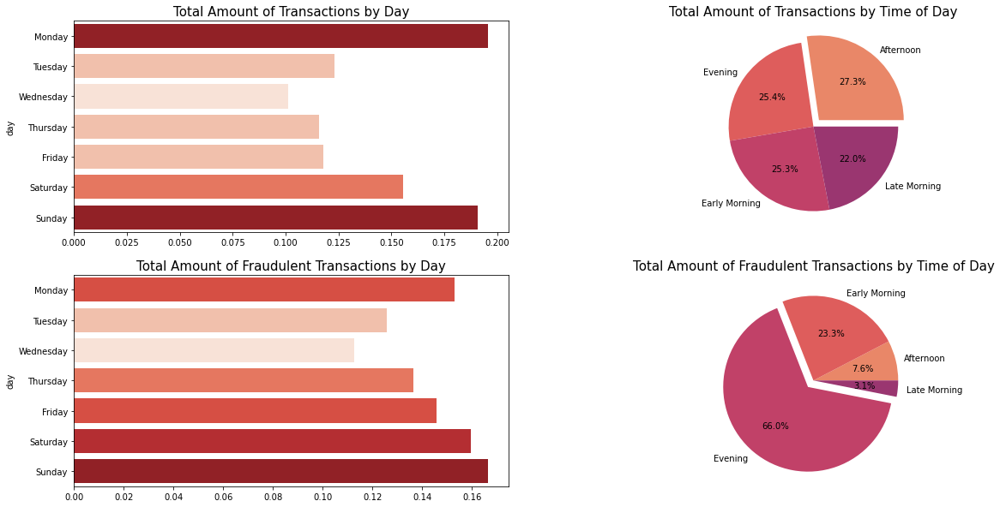

In [52]:
fig, ax = plt.subplots(2,2,figsize=(20, 10))
order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
sns.barplot(x=(df_train.groupby('day')['amt'].sum()/df_train['amt'].sum()).values,
                    y=(df_train.groupby('day')['amt'].sum()/df_train['amt'].sum()).index,
            order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
                    ax=ax[0,0],palette=colors_from_values(df_train['day'].value_counts(normalize=True)[order].values,"Reds"))
ax[0,0].set_title('Total Amount of Transactions by Day',fontsize=15)
ax[0,1].pie(df_train.groupby('time category')['amt'].sum(),labels=df_train['time category'].value_counts().index, autopct='%1.1f%%',explode=(0.1,0,0,0),colors=sns.color_palette("flare",5))
ax[0,1].set_title('Total Amount of Transactions by Time of Day',fontsize=15)
sns.barplot(x=(df_train[df_train['is_fraud']==1].groupby('day')['amt'].sum()/df_train[df_train['is_fraud']==1]['amt'].sum()).values,
            y=(df_train[df_train['is_fraud']==1].groupby('day')['amt'].sum()/df_train[df_train['is_fraud']==1]['amt'].sum()).index,
            
            order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
            ax=ax[1,0],
            palette=colors_from_values((df_train[df_train['is_fraud']==1].groupby('day')['amt'].sum()/df_train[df_train['is_fraud']==1]['amt'].sum())[order].values,"Reds"))
ax[1,0].set_title('Total Amount of Fraudulent Transactions by Day',fontsize=15)
ax[1,1].pie(df_train[df_train['is_fraud']==1].groupby('time category')['amt'].sum().values,labels=df_train[df_train['is_fraud']==1].groupby('time category')['amt'].sum().index
            ,autopct='%1.1f%%',explode=(0,0,0.1,0),colors=sns.color_palette("flare",5))
ax[1,1].set_title('Total Amount of Fraudulent Transactions by Time of Day',fontsize=15)
plt.show()

By amount of transacition we can see that by amount of transaction, high amount of fraudulent transaction(s) occur on saturday, sunday and monday. With the highest total amount of fraudulent transaction(s) occurring in the evening.

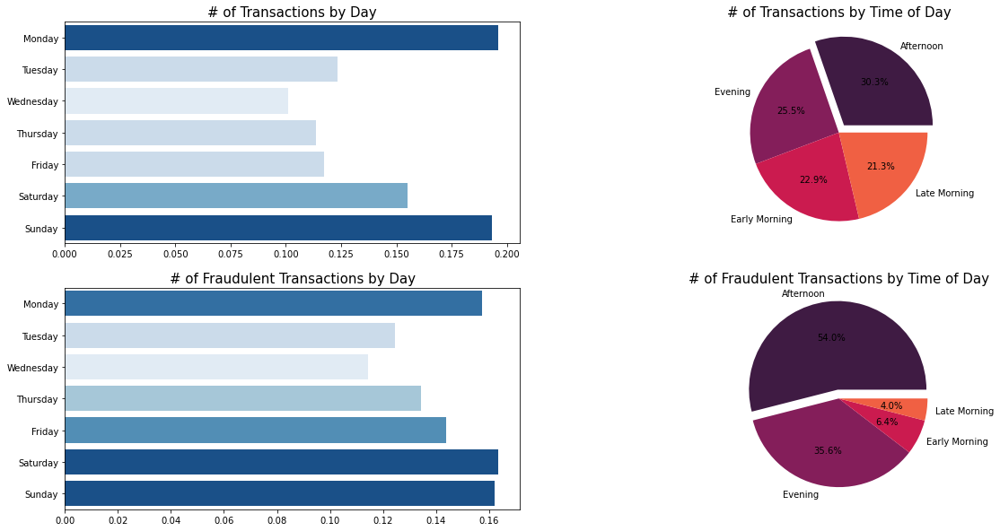

In [53]:
fig, ax = plt.subplots(2,2,figsize=(20, 10))
order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
sns.barplot(x=df_train['day'].value_counts(normalize=True).values,
                    y=df_train['day'].value_counts(normalize=True).index,
            order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
                    ax=ax[0,0],palette=colors_from_values(df_train['day'].value_counts(normalize=True)[order].values,"Blues"))
ax[0,0].set_title('# of Transactions by Day',fontsize=15)
ax[0,1].pie(df_train['time category'].value_counts(),labels=df_train['time category'].value_counts().index, autopct='%1.1f%%',explode=(0.1,0,0,0)
           ,colors=sns.color_palette("rocket",5))
ax[0,1].set_title('# of Transactions by Time of Day',fontsize=15)
sns.barplot(y=df_train[df_train['is_fraud']==1]['day'].value_counts(normalize=True).index,
            x=df_train[df_train['is_fraud']==1]['day'].value_counts(normalize=True).values,
            order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
            ax=ax[1,0],
            palette=colors_from_values(df_train[df_train['is_fraud']==1]['day'].value_counts(normalize=True)[order].values,"Blues"))
ax[1,0].set_title('# of Fraudulent Transactions by Day',fontsize=15)
ax[1,1].pie(df_train[df_train['is_fraud']==1]['time category'].value_counts(),labels=df_train['time category'].value_counts().index
            , autopct='%1.1f%%',explode=(0.1,0,0,0),colors=sns.color_palette("rocket",5))
ax[1,1].set_title('# of Fraudulent Transactions by Time of Day',fontsize=15)
plt.show()

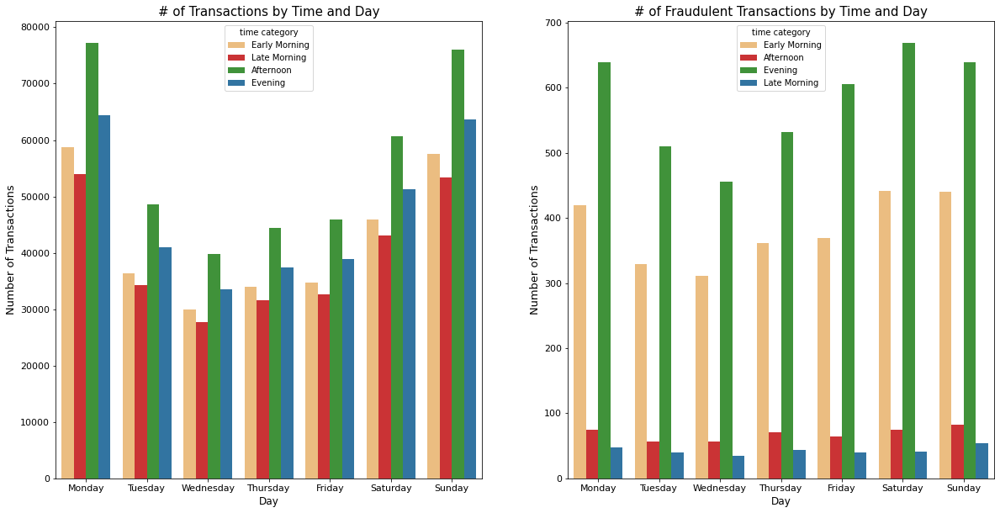

In [54]:
fig,ax=plt.subplots(1,2,figsize=(20,10))
sns.countplot(data=df_train,x="day",hue="time category",order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
                 palette=sns.color_palette('Paired_r')[2:7],ax=ax[0])
ax[0].set_title('# of Transactions by Time and Day',fontsize=15)
sns.countplot(data=df_train[df_train["is_fraud"]==1],x="day",hue="time category",order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],ax=ax[1],palette=sns.color_palette('Paired_r')[2:7])     
ax[1].set_title('# of Fraudulent Transactions by Time and Day',fontsize=15)
for i in range(2):
    ax[i].tick_params(axis='both', labelsize=11)
    ax[i].set_ylabel('Number of Transactions', fontsize = 13)
    ax[i].set_xlabel('Day', fontsize = 12)

plt.show()

* When observed from number of transaction, most fraudulent transaction occur on a Saturday evening with a rising trend of fraudulent transaction towards the end of the week.

But, a tendency in transaction pattern does not neccessarily mean than it can be considered as a fraud trend. A fraud trend needs to be something that sets apart a fraud transaction from a genuine transaction. In order to do so, I have created a function called sort_func, which returns how much of the transaction under a certain status (fraud/not fraud) falls under a certain set of category in regards to the whole population which falls under the same category.

In [55]:
fraud_category(df_train,['is_fraud','day','time category'],"No",1)

,is_fraud,day,time category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
30,1,Friday,Evening,606,1.56%,8.07%,63.145215
46,1,Thursday,Evening,532,1.42%,7.09%,69.347744
54,1,Wednesday,Evening,456,1.36%,6.08%,72.688596
38,1,Saturday,Evening,669,1.30%,8.91%,75.695067
50,1,Tuesday,Evening,510,1.25%,6.79%,79.278431
45,1,Thursday,Early Morning,361,1.06%,4.81%,92.947368
29,1,Friday,Early Morning,369,1.06%,4.92%,93.265583
53,1,Wednesday,Early Morning,311,1.04%,4.14%,95.183280
42,1,Sunday,Evening,639,1.00%,8.51%,98.560250
34,1,Monday,Evening,640,0.99%,8.53%,99.712500


As can be seen from the table above, when grouped by time category and day, there is no specific time period that the fraudulent transaction exceed genuine ones, the fraud detection is generally low as well.

In [56]:
fraud_category(df_train,['is_fraud','day','time category','hour'],"No",1)

,is_fraud,day,time category,hour,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
743,1,Friday,Evening,23,289,3.57%,3.85%,27.034602
1126,1,Thursday,Evening,22,270,3.55%,3.60%,27.162963
742,1,Friday,Evening,22,271,3.41%,3.61%,28.295203
934,1,Saturday,Evening,22,330,3.22%,4.40%,30.057576
1127,1,Thursday,Evening,23,237,3.17%,3.16%,30.590717
1319,1,Wednesday,Evening,23,216,3.15%,2.88%,30.717593
1318,1,Wednesday,Evening,22,215,3.12%,2.86%,31.018605
935,1,Saturday,Evening,23,313,2.99%,4.17%,32.495208
1223,1,Tuesday,Evening,23,239,2.85%,3.18%,34.100418
1222,1,Tuesday,Evening,22,237,2.84%,3.16%,34.206751


When augmented by adding an hour column, there is also no specific time frame in an hourly basis where the fraudulent transaction exceeds the genuine ones.

Thus, at this point I cannot assign a parameter that is specific to the time of the transaction.

## CC_num Column

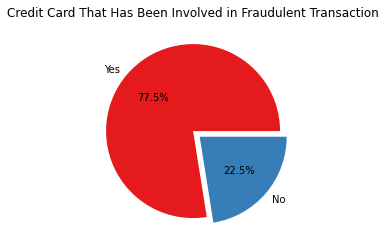

In [57]:
import matplotlib.pyplot as plt
import numpy as np
df_cc=pd.crosstab(df_train['cc_num'],df_train['is_fraud'])

y = np.array([len(df_cc[df_cc[1]!=0]),len(df_cc[df_cc[1]==0])])
mylabels = ["Yes","No"]
myexplode = [0, 0.1]
plt.title("Credit Card That Has Been Involved in Fraudulent Transaction")
plt.pie(y, labels = mylabels, explode = myexplode, autopct='%1.1f%%',colors=sns.color_palette("Set1",2))
plt.show() 

From the pie chart above, we can infer that out of the whole population of credit card numbers, 77.5% has been a subject of fraud transaction. It is apparent that the lack of control from the bank to mitigate fraud transactions results in this high percentage. In real life situations, this could lead to several lawsuits from customers, persecution by regulators by prohibition of business activities or other legally taxing persecution. Thus, banks need to implement a fraud transaction system not only to protect customers but the bank itself from compliance and reputational risk.

### Transaction(s) Pattern before first Fraud

In this section, I will inspect whether transaction amount for the first fraudulent transaction is significantly larger than the mean of previous transactions in general.

In [58]:
cc_df=df_train[df_train['is_fraud']==1].sort_values(['cc_num','trans_date_trans_time']).drop_duplicates('cc_num')

In [59]:
cc_df=cc_df.reset_index(drop=True)

In [60]:
cc=[]
data=[]

In [61]:
for i in range(len(cc_df)):
    data.append(df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]][df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]]['trans_date_trans_time']<cc_df['trans_date_trans_time'].iloc[i]]['amt'].mean())
    cc.append(cc_df['cc_num'].iloc[i])

In [62]:
df_mean_cc=pd.DataFrame(zip(cc,data),columns=['cc_num','Mean Transaction amt Before First Fraud'])


In [63]:
df_compare=pd.merge(df_mean_cc,cc_df[['cc_num','amt']])

In [64]:
df_compare[df_compare['amt']>df_compare['Mean Transaction amt Before First Fraud']]

,cc_num,Mean Transaction amt Before First Fraud,amt
2,60423098130,56.591000,317.39
3,60427851591,90.677889,289.11
4,60490596305,69.853659,907.21
5,501802953619,57.424945,317.84
7,501828204849,54.759784,320.00
...,...,...,...
755,4897067971111209737,55.733580,308.55
756,4906628655840914250,55.136358,293.05
759,4973530368125489546,66.848052,301.54
760,4980323467523543940,62.931266,690.55


In [65]:
print(round(len(df_compare[df_compare['amt']>df_compare['Mean Transaction amt Before First Fraud']])/len(df_compare)*100,3),"%",'of first fraudulent transaction is higher than average of previous transactions')

68.11 % of first fraudulent transaction is higher than average of previous transactions


In [66]:
df_compare['Amt / Average']=df_compare['Mean Transaction amt Before First Fraud']/df_compare['amt']

In [67]:
print("On Average, First Fraudulent Transaction is ",round(df_compare['Amt / Average'].mean(),2),"x", "Higher than Previous Transactions")

On Average, First Fraudulent Transaction is  1.58 x Higher than Previous Transactions


In [68]:
data2=[]
data3=[]

In [69]:
df_train['month']=df_train['trans_date_trans_time'].dt.strftime('%B')

In [70]:
for i in range(len(cc_df)):
    data2.append(df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]][df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]]['trans_date_trans_time']<cc_df['trans_date_trans_time'].iloc[i]].groupby('month').size().mean())

In [71]:
for i in range(len(cc_df)):
    data3.append(df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]][df_train[df_train['cc_num']==cc_df['cc_num'].iloc[i]]['trans_date_trans_time']>cc_df['trans_date_trans_time'].iloc[i]].groupby('month').size().mean())

In [72]:
df_compare=df_compare.join(pd.DataFrame(zip(cc_df['cc_num'],data2,data3),columns=['cc_number','avg trans/mo before fraud','avg trans/mo after fraud']))

In [73]:
print("on average, the average of monthly transaction increases",round((df_compare['avg trans/mo after fraud']/df_compare['avg trans/mo before fraud']).mean(),2),'times','after first fraud')

on average, the average of monthly transaction increases 1.63 times after first fraud


Since fraudulent transactions occur repetitively, we cannot rely on first fraud alone, and thus, the fact needs to be clarified on a larger scope.

I need to see if these facts also applies for fraudulent transaction in general, where there is a significant difference in fradulent vs genuine transaction in terms of amount and frequency on a customer basis (based on each customer's transaction pattern).

### Amount of Transaction

In this section I will create another column which will find transaction amount mean prior to the specific transaction. Whereby for example, the transaction occurs in time = t, for that transaction I will find the mean of transaction amount up till t-1. And if the transaction is bigger than the mean, It will be classified as fraud.  

To do so, I will run the portion of the code below in kaggle since the data has 1.3 million columns. Even by running it in kaggle, the code below takes around 7 hours to run.

In [74]:
# for i in range(len(df_train)):
#     data.append(df_train[df_train['cc_num']==df_train['cc_num'].iloc[i]][df_train[df_train['cc_num']==df_train['cc_num'].iloc[i]]['trans_date_trans_time']<df_train['trans_date_trans_time'].iloc[i]]['amt'].mean())

In [75]:
df_average=pd.read_csv(r'C:\Users\MADELEINE\Desktop\FP frm\Transaction Average\df_final_train.csv',usecols=['0'])

In [76]:
df_average=df_average.rename({'0':'average_trf'},axis=1)

In [77]:
df_average['average_trf']=df_average['average_trf'].fillna(0)

In [78]:
df_train['average_trf']=df_average['average_trf']

In [79]:
df_train['greater than average_trf']=df_train['amt']>df_train['average_trf']

In [80]:
df_train['amt per average']=df_train['amt']/df_train['average_trf']

In [81]:
pd.crosstab(df_train['is_fraud'],df_train['greater than average_trf'])

greater than average_trf,False,True
is_fraud,,
0,870233,418936
1,1793,5713


In [82]:
418936/5713

73.3302993173464

While there is a tendency that fraudulent transaction is generally greater than average, there is also a great chunk of genuine transaction that observes similiar pattern in terms of transaction amount. While the fraudulent transction that falls under the category is 76% of the total fraud transaction, the ratio of genuine to fraudulent transaction is 73:1. This is not acceptable as the maximum tolerance for genuine to fraudulent transaction ratio is 10:1. However, this fact may be useful in the future as other columns are yet to be explored.

### Frequency of transaction

In the previous section, I have observed the transaction pattern in a monthly basis, in industry practice, it is not applicable as fraudulent transaction has the tendency to be vigorous, with multiple occassions under a short period of time. Thus, I will observe the pattern on a daily and hourly basis to see whether there are any patterns that differ fraudulent vs. genuine transaction(s).

#### Daily Basis

Prior to anything, the data must be reshaped such that for each credit card, a tally of transaction frequency will be created on a daily basis.

In [83]:
df_train['date']=df_train['trans_date_trans_time'].dt.date

In [84]:
df_traincc_day=pd.DataFrame(df_train.groupby(['cc_num','date','is_fraud']).size()).reset_index().rename({0:'Number of Transaction'},axis=1)

In [85]:
df_traincc_day

,cc_num,date,is_fraud,Number of Transaction
0,60416207185,2019-01-01,0,1
1,60416207185,2019-01-01,1,0
2,60416207185,2019-01-02,0,4
3,60416207185,2019-01-02,1,0
4,60416207185,2019-01-03,0,2
...,...,...,...,...
1055737,4992346398065154184,2020-06-19,1,0
1055738,4992346398065154184,2020-06-20,0,4
1055739,4992346398065154184,2020-06-20,1,0
1055740,4992346398065154184,2020-06-21,0,4


In [86]:
df_traincc_day=df_traincc_day[df_traincc_day['Number of Transaction']>0].reset_index(drop=True)

In [87]:
df_traincc_day[df_traincc_day['is_fraud']==0]['Number of Transaction'].mean()

3.2112736049978703

In [88]:
df_traincc_day[df_traincc_day['is_fraud']==1]['Number of Transaction'].mean()

5.007338225483656

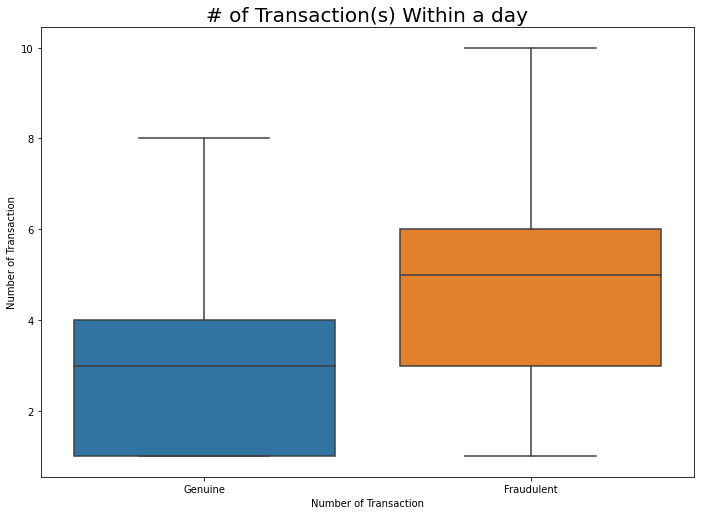

In [89]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='Number of Transaction',x='is_fraud',data=df_traincc_day,showfliers=False)
ax.set_xlabel('Number of Transaction')
ax.set_xticklabels(['Genuine','Fraudulent'])
plt.title('# of Transaction(s) Within a day',fontsize=20)
plt.show()

By initial inspection, there appears to be a tendency where fraud transaction(s)'s frequency are higher on an hourly basis. As the mean is significantly higher and the boxplot also shows that the distribution of the fraudulent transasction tend to be higher than the genuine transaction. As can be seen that the "body" of the boxplot aka Quartile 1 - Quartile 3 are located significantly higher.

In [90]:
df_traincc_day['Number of Transaction'].max()

34

In [91]:
threshold(df_traincc_day,">",1,34,1,'Number of Transaction')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,1,0.959973,1439,294973,204.984712,0.004855
1,2,0.868579,1302,204264,156.884793,0.006334
2,3,0.735824,1103,136949,124.160471,0.007990
3,4,0.559039,838,89960,107.350835,0.009229
4,5,0.378252,567,58090,102.451499,0.009666
5,6,0.233489,350,37312,106.605714,0.009293
6,7,0.140761,211,23685,112.251185,0.008830
7,8,0.070714,106,15049,141.971698,0.006994
8,9,0.029353,44,9639,219.068182,0.004544
9,10,0.014676,22,6187,281.227273,0.003543


However, using the threshold function, we can see that there is no threshold which gives a Genuine to Fraud Transaction Ratio	that is 10 or lower. Thus, I will not be using patterns on a daily basis to create a transaction rule parameter.

#### Hourly Basis

Since there is no significant finding on a daily basis, I will attempt to do the same thing as the section above but with an hourly basis of the transaction(s).

In [92]:
df_traincc_hour=pd.DataFrame(df_train.groupby(['cc_num','date','hour','is_fraud']).size()).reset_index().rename({0:'Number of Transaction'},axis=1)

In [93]:
df_traincc_hour

,cc_num,date,hour,is_fraud,Number of Transaction
0,60416207185,2019-01-01,0,0,0
1,60416207185,2019-01-01,0,1,0
2,60416207185,2019-01-01,1,0,0
3,60416207185,2019-01-01,1,1,0
4,60416207185,2019-01-01,2,0,0
...,...,...,...,...,...
25337803,4992346398065154184,2020-06-21,21,1,0
25337804,4992346398065154184,2020-06-21,22,0,0
25337805,4992346398065154184,2020-06-21,22,1,0
25337806,4992346398065154184,2020-06-21,23,0,0


In [94]:
df_traincc_hour[(df_traincc_hour['Number of Transaction']>0)&(df_traincc_hour['is_fraud']==0)]['Number of Transaction'].mean()

1.0934520224938296

In [95]:
df_traincc_hour[(df_traincc_hour['Number of Transaction']>0)&(df_traincc_hour['is_fraud']==1)]['Number of Transaction'].mean()

1.4143583945732052

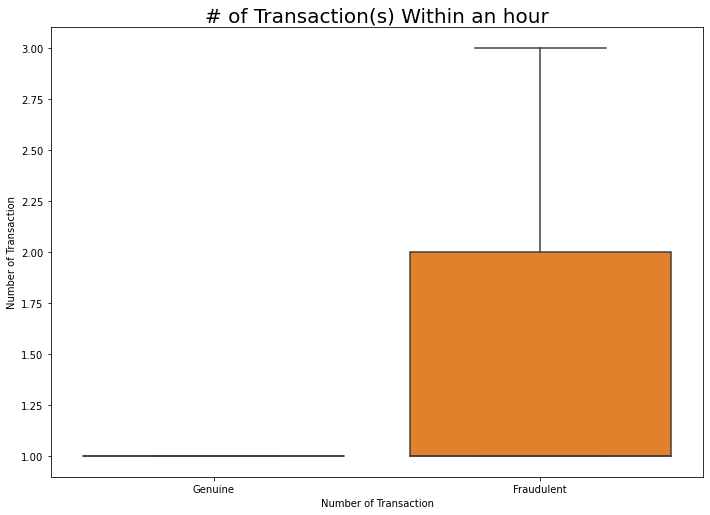

In [96]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='Number of Transaction',x='is_fraud',data=df_traincc_hour[(df_traincc_hour['Number of Transaction']>0)],showfliers=False)
ax.set_xlabel('Number of Transaction')
ax.set_xticklabels(['Genuine','Fraudulent'])
plt.title('# of Transaction(s) Within an hour',fontsize=20)
plt.show()

As we can see from the plot above, at initial inspection there is a very significant difference between the hourly frequency of frudulent transaction compared to genuine ones. However, boxplots can easily skew perception as there is a significant imbalance between genuine to fraudulent transaction(s). As the outliers are not displayed, the outliers in genuine transactions can outnumber the fraudulent transactions.

In [97]:
threshold(df_traincc_hour,">",1,20,1,'Number of Transaction')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,1,1.198209e-04,1518,100163,65.983531,0.014929
1,2,3.922991e-05,497,9019,18.146881,0.052228
2,3,1.144535e-05,145,889,6.131034,0.140232
3,4,2.762670e-06,35,100,2.857143,0.259259
4,5,3.157337e-07,4,8,2.000000,0.333333
5,6,0.000000e+00,0,0,NaN,NaN
6,7,0.000000e+00,0,0,NaN,NaN
7,8,0.000000e+00,0,0,NaN,NaN
8,9,0.000000e+00,0,0,NaN,NaN
9,10,0.000000e+00,0,0,NaN,NaN


When assessed on an hourly basis, there is also no pattern that separates fraudulent transaction from the genuine ones. While Genuine to Fraud Transaction Ratio is below 10 for some thresholds, the fraud detection rate is very small.
Overall, this pattern is not very significant as it doesn't provide enough separation between fraudulent vs genuine transaction.

### Fraudulent Credit Card Numbers

Next,I will check if there are credit cards that are associated with more fraud transaction than genuine ones.

In [98]:
fraud_category(df_train,['is_fraud','cc_num'],"No",1)

,is_fraud,cc_num,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
1665,1,4318414072191879,9,100.00%,0.12%,0.000000
1124,1,4844243189971,10,100.00%,0.13%,0.000000
1065,1,4076173495454,12,100.00%,0.16%,0.000000
1515,1,3545578418030657,7,100.00%,0.09%,0.000000
1898,1,4257110907449569602,10,100.00%,0.13%,0.000000
1432,1,2716017661090253,8,100.00%,0.11%,0.000000
1512,1,3543885983111461,11,100.00%,0.15%,0.000000
1059,1,676327197445,8,100.00%,0.11%,0.000000
1214,1,38534201672254,9,100.00%,0.12%,0.000000
1440,1,3501285649323933,9,100.00%,0.12%,0.000000


<AxesSubplot:ylabel='Frequency'>

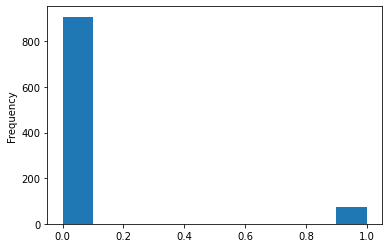

In [207]:
fraud_category(df_train,['is_fraud','cc_num'],"Plot",1)['Percentage over total # of Transactions'].plot(kind='hist')

By analyzing the distribution of the data above, there appears to be two extremes where there is a small subset of the credit card that has been mostly involved in fraudulent transaction(s). I will subset that group of credit card and do an analysis of the subset.

In [211]:
fraud_cc=fraud_category(df_train,['is_fraud','cc_num'],"Yes",1)

In [214]:
df_fraudcc=df_train[df_train['cc_num'].isin(fraud_cc)].reset_index(drop=True)

In [216]:
df_fraudcc['is_fraud'].value_counts()

1    741
0      0
Name: is_fraud, dtype: int64

It appears that there are 75 credit cards that has been involved in 100% fraudulent transactions, with 741 transactions.

Next, I will subset the credit cards that has been involved in more than one fraud transaction.

In [217]:
df_fraudcc['cc_num'].value_counts()[df_fraudcc['cc_num'].value_counts()>1].sort_values()

340187018810220      7
6577777028615915     7
4734310647841293     7
4225628813173670     7
501894933032         7
                    ..
3562793934111141    13
501851115094        15
4168696938629925    15
3521260686633367    15
4593569795412       19
Name: cc_num, Length: 75, dtype: int64

Since the length is 75, it appears that all credit cards has been involved in atleast seven (7) fraudulent transactions.

In [218]:
df_fraudcc['trans_date_trans_time'].apply(lambda s: datetime.date(s.year, s.month, 1)).value_counts().sort_index()

2019-01-01     36
2019-02-01    105
2019-03-01     88
2019-04-01     44
2019-05-01     16
2019-07-01     15
2019-08-01     34
2019-09-01     51
2019-10-01     40
2019-11-01     27
2019-12-01     72
2020-01-01     29
2020-02-01     10
2020-03-01     37
2020-04-01     48
2020-05-01     67
2020-06-01     22
Name: trans_date_trans_time, dtype: int64

The latest transaction is conducted in 1 june 2020, with a minimum of 7 fraudulent transaction per cc. Considering that there is a 20 day period between 1 June 2020 and the last day of the training data period, it is justifiable to block the credit cards temporarily to prevent future fraud loss on these credit cards. In the meantime, it is important for Anti-fraud unit to do enhanced KYC on these credit cards owners to investigate whether these are actual fraudsters or by chance the owners are a victim of numerous fraud resulting in multiple fraud transactions.

Now, I will analyze if there are any reoccuring patterns in transactions of these cc numbers. 

In [219]:
df_fraudcc['merchant_admin1'].value_counts().head(10)

New York          62
Texas             61
California        47
Illinois          32
North Carolina    32
Virginia          32
Pennsylvania      32
South Carolina    27
Washington        27
Wisconsin         26
Name: merchant_admin1, dtype: int64

In [220]:
df_fraudcc['cc_holder_admin1'].value_counts().head(10)

New York          96
Texas             61
California        46
Pennsylvania      43
Tennessee         40
North Carolina    36
Wisconsin         29
Virginia          28
Indiana           27
Washington        25
Name: cc_holder_admin1, dtype: int64

In [221]:
df_fraudcc['time category'].value_counts()

Evening          437
Early Morning    229
Afternoon         55
Late Morning      20
Name: time category, dtype: int64

In [222]:
df_fraudcc['category'].value_counts()

shopping_net      209
grocery_pos       188
misc_net          113
shopping_pos       80
gas_transport      67
misc_pos           17
entertainment      12
personal_care      12
travel             12
grocery_net        10
food_dining         9
kids_pets           7
home                3
health_fitness      2
Name: category, dtype: int64

In [223]:
df_fraudcc['merchant'].value_counts()>0

Cormier LLC                  True
Kuhic LLC                    True
Terry-Huel                   True
Heidenreich PLC              True
Kiehn-Emmerich               True
                            ...  
Howe PLC                    False
Howe Ltd                    False
Hoppe-Parisian              False
Hoppe, Harris and Bednar    False
Zulauf LLC                  False
Name: merchant, Length: 693, dtype: bool

It appears that a majority of the merchants and cc holders are located in new york, with the highest merchant category being shopping_net. Assuming that shopping_net perpetuates to an online merchant, there is a suspicion that some of these includes fraud in the form of account takeover, under a CNP (Card not present) environment.

## Merchant and Location Column

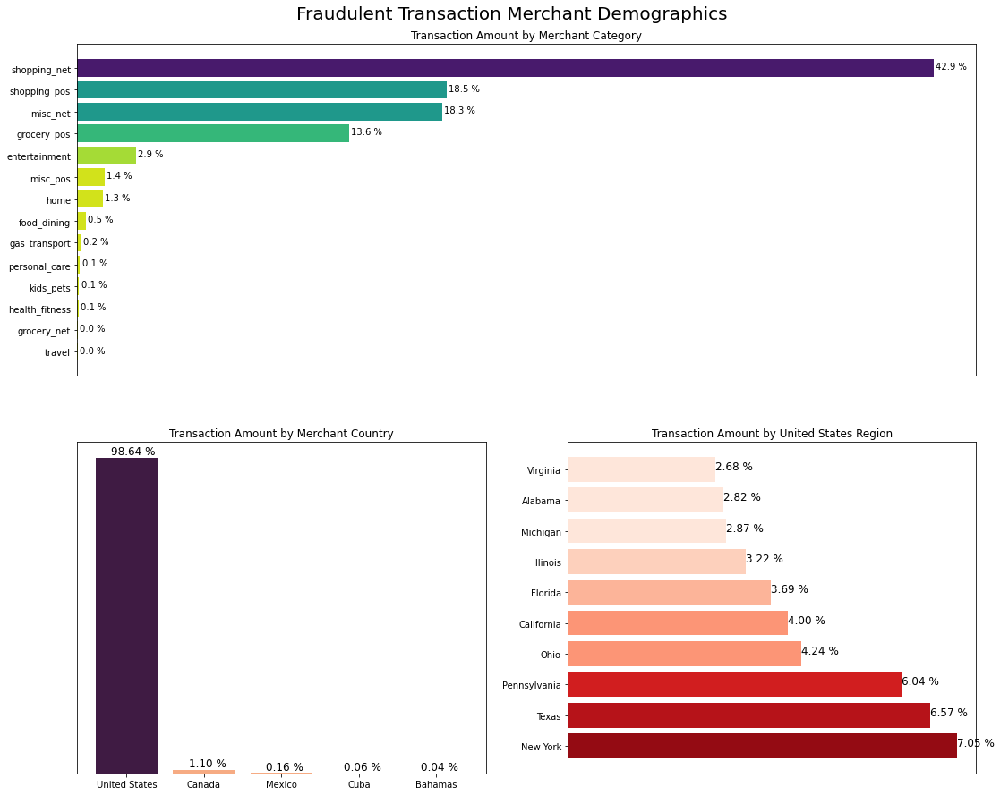

In [224]:
import matplotlib.gridspec as gridspec
df_merch=pd.DataFrame(df_train[df_train['is_fraud']==1].groupby(['merchant','category'])['amt'].sum()[df_train[df_train['is_fraud']==1].groupby(['merchant','category'])['amt'].sum()>0]).reset_index().merge(df_train[df_train['is_fraud']==1].groupby(['merchant','category']).size().reset_index(name='counts')[df_train[df_train['is_fraud']==1].groupby(['merchant','category']).size().reset_index(name='counts')['counts']>0])
fig = plt.figure(figsize =([18, 15]))
 
gs = gridspec.GridSpec(2, 2)
ax1 = plt.subplot(gs[0, :2])
ax1.barh((df_merch.groupby('category')['amt'].sum()/df_merch['amt'].sum()).sort_values(ascending=True).index,
        (df_merch.groupby('category')['amt'].sum()/df_merch['amt'].sum()).sort_values(ascending=True).values,
        color=colors_from_values((df_merch.groupby('category')['amt'].sum()/df_merch['amt'].sum()).sort_values(ascending=True).values,"viridis_r"))
for i, v in enumerate((df_merch.groupby('category')['amt'].sum()/df_merch['amt'].sum()).sort_values(ascending=True).values):
    ax1.text(v + 0.001, i-0.05, '{:1.1f} %'.format(round(v*100,2)), 
            color = 'black')
ax1.set_title('Transaction Amount by Merchant Category')   
ax1.set_xticks([])   
ax2 = plt.subplot(gs[1, 1])


ax3 = plt.subplot(gs[1,0])
ax3.bar((df_train[df_train['is_fraud']==1].groupby('merchant_country')['amt'].sum().sort_values(ascending=False)/
         df_train[df_train['is_fraud']==1]['amt'].sum()).index,
      (df_train[df_train['is_fraud']==1].groupby('merchant_country')['amt'].sum().sort_values(ascending=False)/
         df_train[df_train['is_fraud']==1]['amt'].sum()).values,
       color=colors_from_values((df_train[df_train['is_fraud']==1].groupby('merchant_country')['amt'].sum().sort_values(ascending=False)/
         df_train[df_train['is_fraud']==1]['amt'].sum()).values,"rocket_r"))
ax3.set_yticks([])
for i2, v2 in enumerate((df_train[df_train['is_fraud']==1].groupby('merchant_country')['amt'].sum().sort_values(ascending=False)/
         df_train[df_train['is_fraud']==1]['amt'].sum()).values):
    ax3.text(i2-0.2 , v2+0.01, '{:1.2f} %'.format(round(v2*100,4)), 
            color = 'black',fontsize=12)
ax3.set_title('Transaction Amount by Merchant Country')
fig.suptitle("Fraudulent Transaction Merchant Demographics",fontsize=20,y=0.92)

ax2.barh((df_train[(df_train['is_fraud']==1)&(df_train['merchant_country']=="United States")].groupby('cc_holder_admin1')['amt'].sum()/df_train[(df_train['is_fraud']==1)]['amt'].sum()).nlargest(10).index,
       (df_train[(df_train['is_fraud']==1)&(df_train['merchant_country']=="United States")].groupby('cc_holder_admin1')['amt'].sum()/df_train[(df_train['is_fraud']==1)]['amt'].sum()).nlargest(10).values,
        color=colors_from_values((df_train[(df_train['is_fraud']==1)&(df_train['merchant_country']=="United States")].groupby('cc_holder_admin1')['amt'].sum()/df_train[(df_train['is_fraud']==1)]['amt'].sum()).nlargest(10).values,"Reds"))
for i3, v3 in enumerate((df_train[(df_train['is_fraud']==1)&(df_train['merchant_country']=="United States")].groupby('cc_holder_admin1')['amt'].sum()/df_train[(df_train['is_fraud']==1)]['amt'].sum()).nlargest(10).values):
    ax2.text(v3 , i3, '{:1.2f} %'.format(round(v3*100,3)), 
            color = 'black',fontsize=12)
ax2.set_title('Transaction Amount by United States Region')
ax2.set_xticks([])

plt.show()

As we can see from the plot above, fraudulent transactions mainly originates from the shopping category with online shopping in the top category, which means that for most of the transaction, the transaction is conducted in a card not present environment. Aside from that, the transaction is mostly conducted in USA mainly in the state of new york.

Next, I will inspect the merchant column to see if I can pinpoint a transaction to a certain merchant.

### Merchant Name and Category

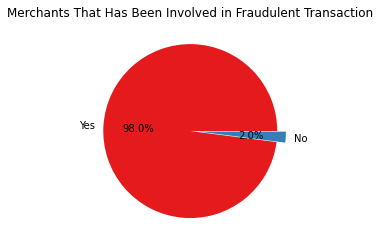

In [225]:
df_merc=pd.crosstab(df_train['merchant'],df_train['is_fraud'])

y = np.array([len(df_merc[df_merc[1]!=0]),len(df_merc[df_merc[1]==0])])
mylabels = ["Yes","No"]
myexplode = [0, 0.1]
plt.title("Merchants That Has Been Involved in Fraudulent Transaction")
plt.pie(y, labels = mylabels, explode = myexplode, autopct='%1.1f%%',colors=sns.color_palette("Set1",2))
plt.show() 

As we can see from the plot above, all merchants has been involved in fraudulent transaction(s).

In [226]:
fraud_category(df_train,['is_fraud','merchant'],"No",1)

,is_fraud,merchant,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
1030,1,Kozey-Boehm,48,2.57%,0.64%,37.875000
938,1,"Herman, Treutel and Dickens",33,2.54%,0.44%,38.393939
997,1,Kerluke-Abshire,41,2.23%,0.55%,43.829268
772,1,Brown PLC,26,2.21%,0.35%,44.230769
893,1,Goyette Inc,42,2.16%,0.56%,45.261905
1309,1,Terry-Huel,43,2.15%,0.57%,45.418605
975,1,Jast Ltd,42,2.15%,0.56%,45.500000
1248,1,"Schmeler, Bashirian and Price",41,2.08%,0.55%,47.000000
765,1,Boyer-Reichert,38,1.99%,0.51%,49.210526
1065,1,"Langworth, Boehm and Gulgowski",39,1.98%,0.52%,49.487179


In [227]:
sort_func2(df_train,['is_fraud','merchant'],"No",1)

,is_fraud,merchant,Total,Percentage over total amount of Transactions
1030,1,Kozey-Boehm,48189.98,26.288461
931,1,"Heathcote, Yost and Kertzmann",34263.17,24.162327
975,1,Jast Ltd,42560.34,24.110040
938,1,"Herman, Treutel and Dickens",26069.11,23.033231
724,1,"Baumbach, Feeney and Morar",37293.87,22.999966
...,...,...,...,...
1220,1,Romaguera and Sons,0.00,0.000000
1209,1,"Ritchie, Bradtke and Stiedemann",0.00,0.000000
1158,1,Osinski Inc,0.00,0.000000
1198,1,Reichert-Weissnat,0.00,0.000000


By using the fraud_category and sort_func2 function, it was found that no merchant is the subject to fraudulent transactions more than genuine transaction. As can be seen in the first table above, the smallest genuine to fraudulent transaction alert ratio is 37.875000, which means that for that merchant alone for every 37 genuine transactions there is only one transaction that is indeed fraudulent.

In [228]:
fraud_category(df_train,['is_fraud','category'],"No",1)

,is_fraud,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
25,1,shopping_net,1713,1.76%,22.82%,55.942790
22,1,misc_net,915,1.45%,12.19%,68.166120
18,1,grocery_pos,1743,1.41%,23.22%,69.934022
26,1,shopping_pos,843,0.72%,11.23%,137.400949
16,1,gas_transport,618,0.47%,8.23%,212.040453
23,1,misc_pos,250,0.31%,3.33%,317.620000
17,1,grocery_net,134,0.29%,1.79%,338.194030
27,1,travel,116,0.29%,1.55%,348.198276
14,1,entertainment,233,0.25%,3.10%,402.493562
24,1,personal_care,220,0.24%,2.93%,411.536364


In [229]:
sort_func2(df_train,['is_fraud','category'],"No",1)

,is_fraud,category,Total,Percentage over total amount of Transactions
25,1,shopping_net,1711723.71,19.845728
22,1,misc_net,729266.76,14.249867
26,1,shopping_pos,739245.09,7.942046
18,1,grocery_pos,543797.90,3.760491
14,1,entertainment,117323.79,1.943516
23,1,misc_pos,54571.02,1.089333
20,1,home,50971.66,0.710513
15,1,food_dining,18131.62,0.388053
24,1,personal_care,5757.52,0.132252
16,1,gas_transport,7594.11,0.090929


By merchant category column, we can observe a similar pattern whereby grocery_pos as the merchant category with the most fraudulent transaction has a genuine to fraudulent transaction alert ratio of 69 whereby for every 69 genuine transactions there is only 1 fraudulent transaction.

Therefore, on a merchant category level, we cannot derive a fraud parameter rule as it doesn't meet the maximum threshold of 10:1 genuine to fraud transaction ratio.

### Latitude, Longtitude and Location Data

In a card not present environment, the cardholder and merchant is usually separated by significant distance, so I will check transactions which are conducted in a different admin-1/admin-2 region.

But first, I need to filter where the transaction is conducted in a physical store by assuming that for merchants caategory with the suffix _net is an online merchant.

In [230]:
df_train['category'].value_counts()

gas_transport     131659
grocery_pos       123638
home              123115
shopping_pos      116672
kids_pets         113035
shopping_net       97543
entertainment      94014
food_dining        91461
personal_care      90758
health_fitness     85879
misc_pos           79655
misc_net           63287
grocery_net        45452
travel             40507
Name: category, dtype: int64

In [231]:
df_train_phy=df_train[~df_train['category'].str.contains('_net')]

In [232]:
df_train_phy['category'].value_counts()

gas_transport     131659
grocery_pos       123638
home              123115
shopping_pos      116672
kids_pets         113035
entertainment      94014
food_dining        91461
personal_care      90758
health_fitness     85879
misc_pos           79655
travel             40507
grocery_net            0
misc_net               0
shopping_net           0
Name: category, dtype: int64

As we can see, for physical stores, most come from gas_transport merchant category.

### Transactions in Physical Merchant Stores where merchants and cc holder are in different location.

#### Country level

In [233]:
df_train_phy[df_train_phy['merchant_country']!=df_train_phy['cc_holder_country']]['is_fraud'].value_counts()

0    18765
1       83
Name: is_fraud, dtype: int64

In [234]:
print("Genuine to Fraud Alert Ratio :",18765/83)

Genuine to Fraud Alert Ratio : 226.0843373493976


In [235]:
print('Detection Rate: ',round((83/7506)*100,2),"%")

Detection Rate:  1.11 %


As we can see, for the majority, transactions where merchants and cc holders are in different countries. When set as parameter, it would only yield a detection rate of 1.11% with a genuine to fraud alert ratio of 226. Thus, it cannot be set as a rule for fraud classification.

In [236]:
fraud_category(df_train_phy[df_train_phy['merchant_country']!=df_train_phy['cc_holder_country']],['is_fraud','category'],"No",1)

,is_fraud,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
18,1,grocery_pos,28,1.33%,33.73%,74.464286
16,1,gas_transport,15,0.67%,18.07%,149.133333
27,1,travel,4,0.58%,4.82%,170.500000
26,1,shopping_pos,10,0.50%,12.05%,199.500000
20,1,home,7,0.34%,8.43%,292.142857
15,1,food_dining,4,0.25%,4.82%,399.500000
24,1,personal_care,4,0.25%,4.82%,402.750000
23,1,misc_pos,3,0.21%,3.61%,483.666667
21,1,kids_pets,4,0.20%,4.82%,499.500000
14,1,entertainment,3,0.19%,3.61%,529.333333


When categorized from merchant category, there is also no significancy. In real-life practice, this can usually be set as a parameter since physical store merchants require credit card holder to be physically present in the point of purchase. However, it is apparent that for 18765 of the genuine transactions this fact is true. Thus, it can be inferred that perhaps a lot of credit cards are used by a family member/friend with consent from the original owner.

#### Administration 1 Region

On a smaller scope, I will use the same approach as the previous section but using the administration 1 region instead of country.

In [237]:
df_train_phy[(df_train_phy['merchant_country']==df_train_phy['cc_holder_country'])&
             (df_train_phy['merchant_admin1']!=df_train_phy['cc_holder_admin1'])]['is_fraud'].value_counts()

0    253184
1      1167
Name: is_fraud, dtype: int64

In [238]:
round(253184/df_train[df_train['is_fraud']==0].shape[0],4)*100

19.64

In [239]:
print("Genuine to Fraud Alert Ratio :",253184/1167)

Genuine to Fraud Alert Ratio : 216.9528706083976


In [240]:
print('Detection Rate: ',round((1167/7506)*100,2),"%")

Detection Rate:  15.55 %


Performing much better on than the country scope, using the different administration 1 region as a classifier yields a detection rate of 15.55% and a genuine to fraud alert ratio of around 217:1. Since the ratio does not pass the maximum threhold of 10:1, and by using this as a parameter will result in the blocking of 19.64% of genuine transaction, resulting in a loss of 19.64% of prospective revenue. Aside from that, it would only detect 15.55% of fraudulent transaction. 

Therefore, I will not be using this as a fraud classifier parameter.

In [241]:
fraud_category(df_train_phy[(df_train_phy['merchant_country']==df_train_phy['cc_holder_country'])&
             (df_train_phy['merchant_admin1']!=df_train_phy['cc_holder_admin1'])],['is_fraud','category'],"No",1)

,is_fraud,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
18,1,grocery_pos,400,1.39%,34.28%,71.155000
26,1,shopping_pos,221,0.82%,18.94%,120.493213
16,1,gas_transport,170,0.54%,14.57%,182.535294
23,1,misc_pos,60,0.32%,5.14%,311.533333
27,1,travel,25,0.26%,2.14%,378.640000
14,1,entertainment,56,0.26%,4.80%,387.392857
21,1,kids_pets,62,0.24%,5.31%,421.419355
24,1,personal_care,47,0.22%,4.03%,451.063830
20,1,home,55,0.19%,4.71%,519.454545
15,1,food_dining,40,0.19%,3.43%,529.475000


Same as the previous section, there is not merchant category that falls in this category that can be used as a fraud classifier parameter.

#### Administration 2 region

In [242]:
df_train_phy[(df_train_phy['merchant_country']==df_train_phy['cc_holder_country'])&
             (df_train_phy['merchant_admin1']==df_train_phy['cc_holder_admin1'])&
             (df_train_phy['merchant_admin2']!=df_train_phy['cc_holder_admin2'])]['is_fraud'].value_counts()

0    703947
1      3045
Name: is_fraud, dtype: int64

In [243]:
round(703947/df_train[df_train['is_fraud']==0].shape[0],4)*100

54.6

In [244]:
print("Genuine to Fraud Alert Ratio :",703947/3045)

Genuine to Fraud Alert Ratio : 231.18128078817733


In [245]:
print('Detection Rate: ',round((3045/7506)*100,2),"%")

Detection Rate:  40.57 %


On a smaller scope, while using different administration 2 region gives a higher detection rate than the previous, (15.55% to 40.57%), using this as a parameter to block transactions would lead to 54.6 % of genuine transactions being blocked. Which hinders the majority of potential revenue. Aside from that the genuine to fraud alert ratio is 231:1 which does not meet the maximum threshold of 10 :1. Therefore, I will not be using this as a fraud classifier parameter.

In [246]:
fraud_category(df_train_phy[(df_train_phy['merchant_country']==df_train_phy['cc_holder_country'])&
             (df_train_phy['merchant_admin1']==df_train_phy['cc_holder_admin1'])&
             (df_train_phy['merchant_admin2']!=df_train_phy['cc_holder_admin2'])],['is_fraud','category'],"No",1)

,is_fraud,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
18,1,grocery_pos,1144,1.43%,37.57%,69.046329
26,1,shopping_pos,534,0.70%,17.54%,141.342697
16,1,gas_transport,369,0.43%,12.12%,229.200542
27,1,travel,83,0.32%,2.73%,315.831325
23,1,misc_pos,154,0.30%,5.06%,332.928571
14,1,entertainment,158,0.26%,5.19%,385.303797
24,1,personal_care,152,0.26%,4.99%,386.118421
21,1,kids_pets,151,0.21%,4.96%,485.609272
19,1,health_fitness,89,0.16%,2.92%,623.269663
20,1,home,123,0.15%,4.04%,648.691057


Same as the previous section, there is not merchant category that falls in this category that can be used as a fraud classifier parameter.

#### Latitude-Longitude

For location based parameter, being in the same area does not neccessarily mean that there is any relation between two fraudulent transactions. To block transaction based on geographic location, one needs to be particular and specific in the scope of area that it blocks. 
Location columns that are particularly specific are :  latitude, longtiude

<AxesSubplot:ylabel='Frequency'>

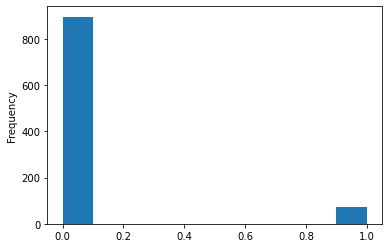

In [247]:
fraud_category(df_train,['is_fraud','lat','long'],"Plot",1)['Percentage over total # of Transactions'].plot(kind='hist')

As can be seen, its apparent that there is a small group of latitude and longtitude coordinate that is involved 100% in fraudulent transaction exclusively. To check, I will subset the small cluster and analyze it further.

In [248]:
fraud_coord=fraud_category(df_train,['is_fraud','lat','long'],"Yes",1)

In [249]:
df_train['lat-long']=df_train['lat'].astype(str) + df_train['long'].astype(str) 

In [250]:
df_test['lat-long']=df_test['lat'].astype(str) + df_test['long'].astype(str) 

In [251]:
df_test[df_test['cc_num'].isin(fraud_cc)].shape

(0, 27)

In [252]:
fraud_cood_lis=list(fraud_coord['lat'].astype(str) + fraud_coord['long'].astype(str))

In [253]:
df_train[df_train['lat-long'].isin(fraud_cood_lis)]['cc_num'].isin(fraud_cc).value_counts()

True    721
Name: cc_num, dtype: int64

Turns out, it appears that the transaction that falls under the criteria has already been catered in the list of blocked credit card numbers. As discussed in the cc number section, the next step would be to escalate the issue into an investigation and temporarily freeze the account in order to prevent further loss. Thus, I will not add an additional parameter based on the latitude and longtitude.

Aside from that, I have sampled a two coordinates which shows that it perpetuates to public places. Blocking based on coordinate alone especially in public places is risky in the business aspect since it could hinder future revenue all the while it could not be concluded that the coordinates perpetuate to fraud operandi basecamp.

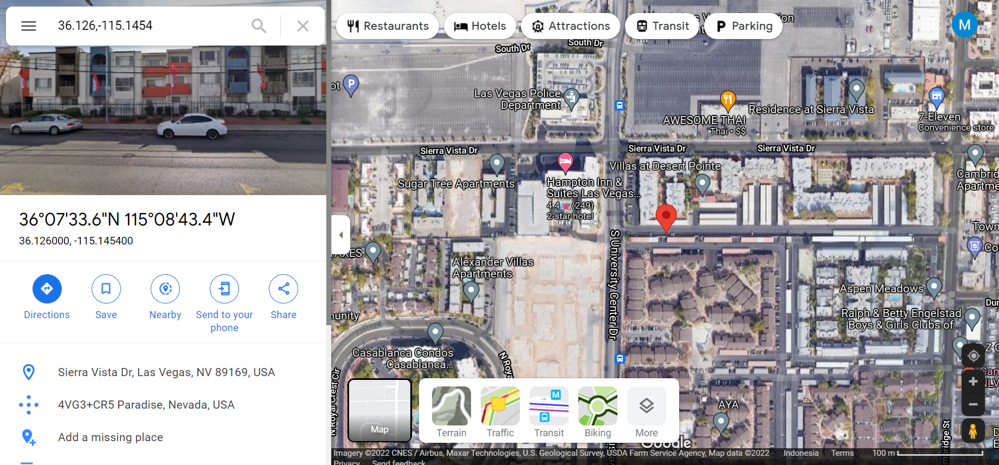
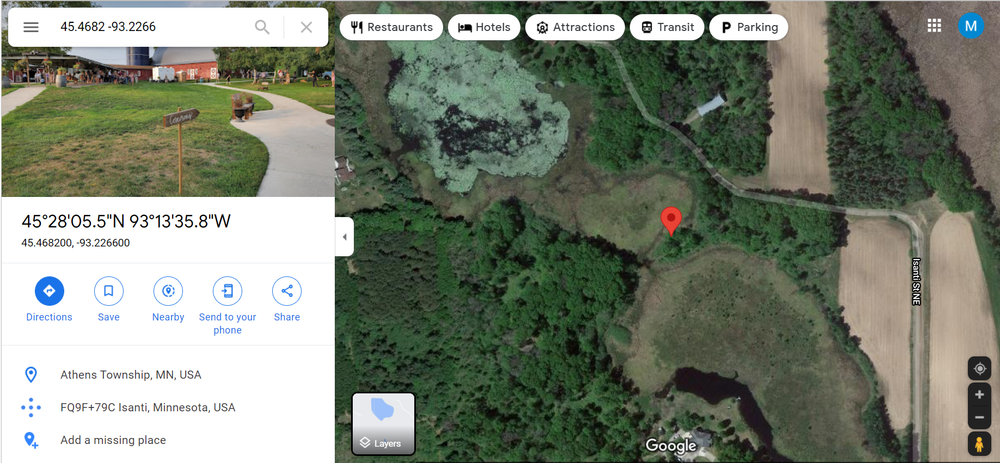

Aside from that to get some context, I will insert the coordinates to openstreetmap.org in order to get some context of the fraudulent trasanction location.

In [254]:
df_train[df_train['lat-long'].isin(fraud_cood_lis)]['lat'].min()

27.8942

In [255]:
df_train[df_train['lat-long'].isin(fraud_cood_lis)]['long'].min()

-153.994

In [256]:
df_train[df_train['lat-long'].isin(fraud_cood_lis)]['lat'].max()

66.6933

In [257]:
df_train[df_train['lat-long'].isin(fraud_cood_lis)]['long'].max()

-70.1031

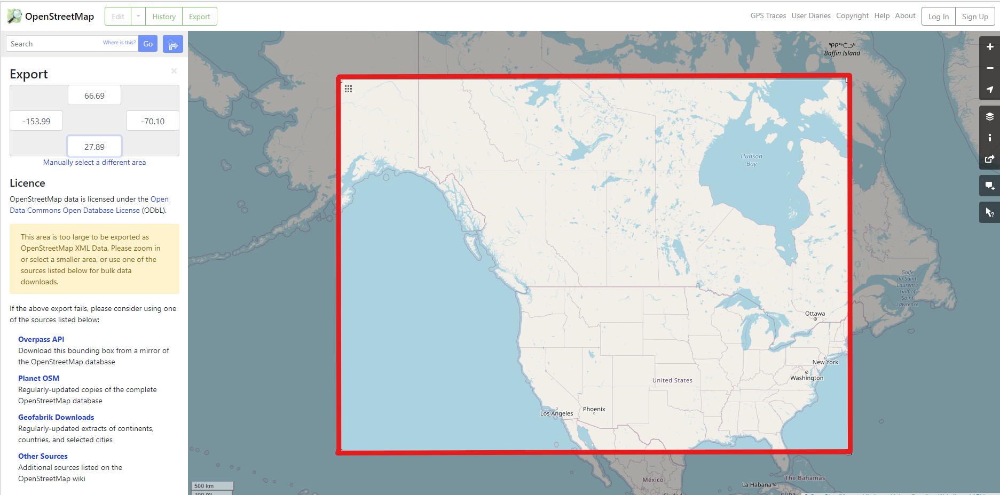

As can be seen from the map above, the location of the fraudsters does not pinpoint to a small concentrated area,thus, I cannot use the polygon of the geographical location to generate fraud alert.


Next, I will check if there are any repeated merchant coordinates which only perpetuates to fraudulent transaction(s).

In [258]:
df_train[df_train['cc_num'].isin(fraud_cc)]['distance'].mean()

76.6354995416987

In [259]:
df_train[df_train['is_fraud']==1].groupby(['merch_lat','merch_long']).size()

merch_lat  merch_long 
19.425114  -155.657513    1
19.531144  -155.229249    1
19.608886  -155.733203    1
19.816087  -155.983643    1
20.445248  -155.365041    1
                         ..
67.064277  -153.492308    1
67.188111  -153.788190    1
67.397018  -154.118108    1
67.441518  -153.653849    1
67.510267  -153.069184    1
Length: 7506, dtype: int64

In [260]:
df_train[df_train['is_fraud']==1].groupby(['merch_lat','merch_long']).size()[df_train[df_train['is_fraud']==1].groupby(['merch_lat','merch_long']).size()>1]

Series([], dtype: int64)

Turns out, each coordinate is unique thus, the merchant coordinates alone cannot be set as fraud indicator

## Distance column

In general, distance column can play a very important role in determining fraudulent from genuine transaction. It can be used to identify fraud schemes such as stolen/lost card, account takeover and Card not present(CNP) based fraud transaction. Where fraudsters are often in a location that is significantly farther than the credit card holder. However, in the previous sections we have identified that when merchants and credit card holders are in a different administration 1 region, administration 2 region and even countries does not neccessarily mean that it is a fraud transaction.

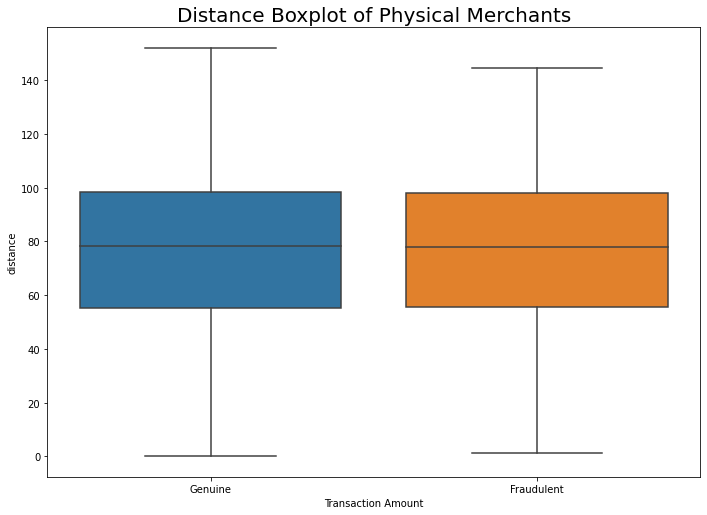

In [261]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='distance',x='is_fraud',data=df_train_phy,showfliers=False)
ax.set_xlabel('Transaction Amount')

ax.set_xticklabels(['Genuine','Fraudulent'])

plt.title('Distance Boxplot of Physical Merchants',fontsize=20)
plt.show()

By the boxplot above, we can see that there is not a significant difference in the distribution of distance of merchant and cc holder for fraudulent and genuine transactions. 

In [262]:
threshold(df_train_phy,">",0,140,5,'distance')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,4744,1085649,228.846754,0.004351
1,5,0.998524,4737,1083374,228.704665,0.004353
2,10,0.992833,4710,1076804,228.620807,0.004355
3,15,0.982715,4662,1065756,228.604891,0.004355
4,20,0.969646,4600,1050037,228.268913,0.004362
5,25,0.952572,4519,1030052,227.938039,0.004368
6,30,0.932336,4423,1005624,227.362424,0.004379
7,35,0.905143,4294,976951,227.515370,0.004376
8,40,0.877530,4163,943248,226.578909,0.004394
9,45,0.844857,4008,905658,225.962575,0.004406


By using the threshold function, I also cannot identify a significant distance value that separates genuine and fraudulent transaction. Moreover, there is no threshold that gives a genuine to fraud transaction ratio that is ten or less.

# Transaction Amount Column

To explore the transaction amount column, I will use a boxplot since it gives the most clear representation of data distribution between genuine and fraudulent transaction since there is a huge imbalance in the number of data rows. To give a brief context I will display a histogram in the section below.

## General Population

### Transaction Amount Outlier

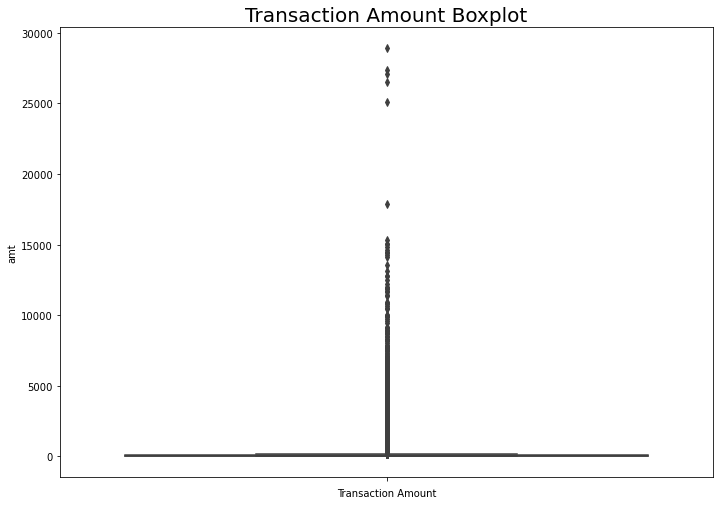

In [573]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',data=df_train,showfliers=True)
ax.set_xlabel('Transaction Amount')

# ax.set_xticklabels(['Genuine','Fraudulent'])

plt.title('Transaction Amount Boxplot',fontsize=20)
plt.show()

From the boxplot above, we cannot infer the transsaction distribution as there is too much outliers that skew the y axis.

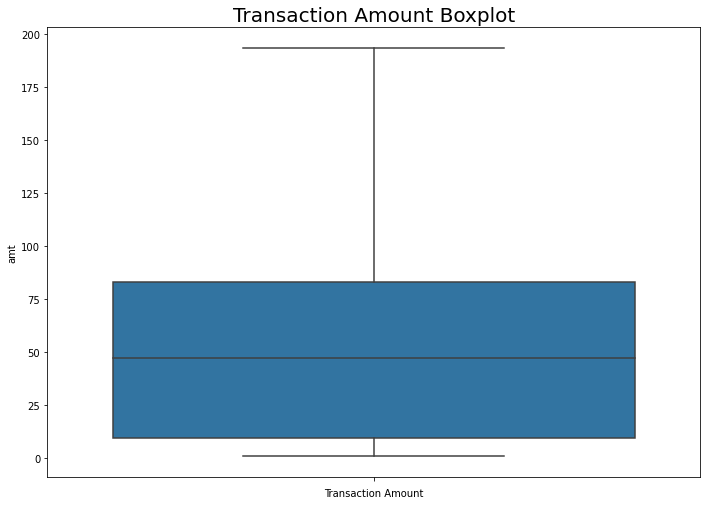

In [575]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',data=df_train,showfliers=False)
ax.set_xlabel('Transaction Amount')

# ax.set_xticklabels(['Genuine','Fraudulent'])

plt.title('Transaction Amount Boxplot',fontsize=20)
plt.show()

When the outliers are removed, we can observe that most of the transaction are located between 10-80 USD and the distribution is skewed to the right. Since the data has a lot of outliers, perhaps it has something to do with fraudulent transactions. To prove my assumption, I will use the is_outlier function which classifies data as outlier when it falls outside of the whisters of the boxplot.

In [588]:
Q1 =  df_train['amt'].quantile(0.25)
Q3 = df_train['amt'].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3+(1.5*IQR)
lower_bound = Q1-(1.5*IQR)

In [615]:
df_train['is_outlier']=df_train['amt'].apply(lambda x: 1 if x< (Q1 - 1.5 * IQR) or  x > (Q3 + 1.5 * IQR) else 0)

In [616]:
pd.crosstab(df_train["is_fraud"],df_train["is_outlier"])

is_outlier,0,1
is_fraud,,
0,1227584,61585
1,1801,5705


In [617]:
fraud_metrics(df_train["is_fraud"],df_train["is_outlier"])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,76.01 %,10.79


From finding the outliers, there is a significant amount of fraudulent transaction that is considered as an outlier. However, since Genuine to Fraudulent Transaction Alert Ratio exceeds 10, I will not be using this piece of information as a fraud transaction classifier yet. 

In the next part, I will explore the amount column's distribution individually based on transaction type.

### Fraud vs. Genuine


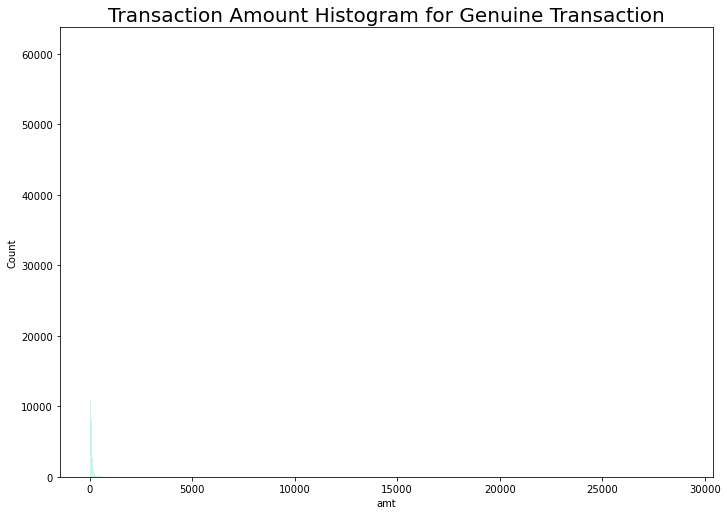

In [263]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.histplot(x='amt',data=df_train[df_train['is_fraud']==0],color="#B2F2E8")
plt.title('Transaction Amount Histogram for Genuine Transaction',fontsize=20)
plt.show()


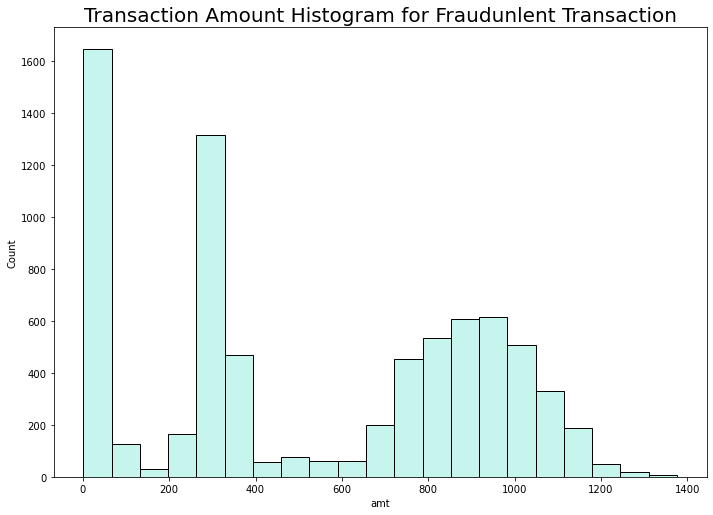

In [264]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.histplot(x='amt',data=df_train[df_train['is_fraud']==1],color="#B2F2E8")
plt.title('Transaction Amount Histogram for Fraudunlent Transaction',fontsize=20)
plt.show()

As we can see from the two histograms, it is hard to infer any sort of pattern from just comparing the two plots. To continue with the analysis, I will use boxplots.


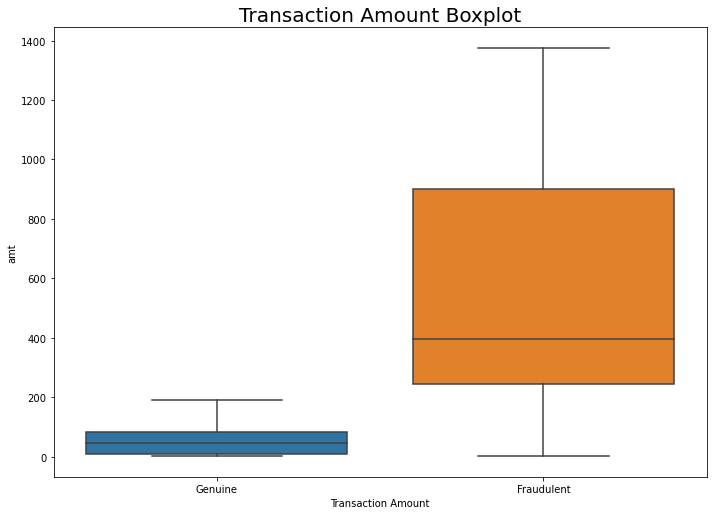

In [265]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',x='is_fraud',data=df_train,showfliers=False)
ax.set_xlabel('Transaction Amount')

ax.set_xticklabels(['Genuine','Fraudulent'])

plt.title('Transaction Amount Boxplot',fontsize=20)
plt.show()

As we can see from the plot above, there is a drastic difference between genuine and fraudulent transaction(s). So, I will calculate the cut off point using the upper bound of genuine transaction or the 25th percentile of fraudulent transaction and analyze which threshold performs better in separating fraudulent and genuine transaction.

In [266]:
iq_range3 = np.percentile(df_train[df_train['is_fraud']==0]['amt'], 75) - np.percentile(df_train[df_train['is_fraud']==0]['amt'], 25)
lb3=np.percentile(df_train[df_train['is_fraud']==0]['amt'], 25) - (1.5*iq_range3)
ub3=np.percentile(df_train[df_train['is_fraud']==0]['amt'], 75) + (1.5*iq_range3)

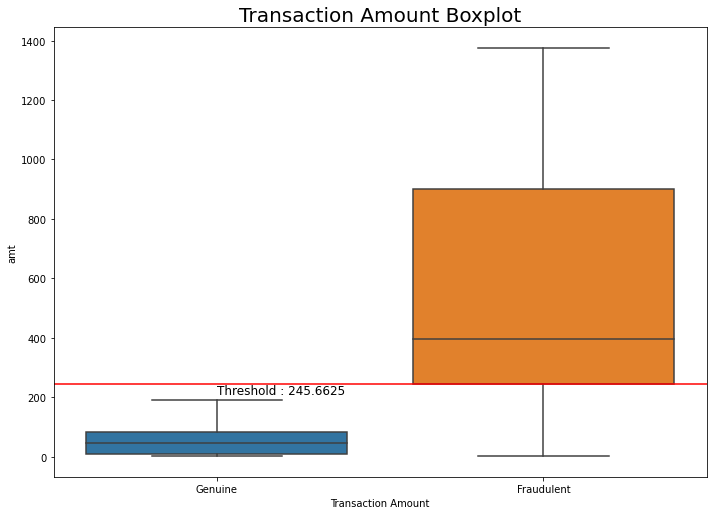

In [267]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',x='is_fraud',data=df_train,showfliers=False)
ax.set_xlabel('Transaction Amount')

ax.set_xticklabels(['Genuine','Fraudulent'])

ax.axhline(y=245.6625,color='red')
ax.text(0, 210,'Threshold : 245.6625', fontsize=12,ma='left') #add text
plt.title('Transaction Amount Boxplot',fontsize=20)
plt.show()


In [268]:
lb2=np.percentile(df_train[df_train['is_fraud']==1]['amt'], 25) 

In [269]:
ub3 #Upper whisker of the genuine transaction boxplot

191.935

In [270]:
lb2 #25th percentile / 1st quartile of non fraudulent transaction amount

245.6625

In [271]:
# Confusion matrix using 25th percentile / 1st quartile of fraudulent transaction amount
pd.crosstab(df_train['is_fraud'],df_train['amt'].apply(lambda x: 0 if x< lb2  else 1))

amt,0,1
is_fraud,,
0,1255306,33863
1,1877,5629


In [272]:
# Confusion matrix using Upper whisker of the genuine transaction boxplot
pd.crosstab(df_train['is_fraud'],df_train['amt'].apply(lambda x: 0 if x< ub3 else 1))

amt,0,1
is_fraud,,
0,1226397,62772
1,1801,5705


In [273]:
print(round(((5705-5629)/5629)*100,2),'% of difference in correctl classified fraud transactions')

1.35 % of difference in correctl classified fraud transactions


As can be seen, from the confusion matrix, the amount column is able to separate pretty well between fraudulent and genuine transaction.

We can see that from the results above, while using Upper whisker of the genuine transaction boxplot generates more true positives, its has led to almost twice as much false positive (genuine to fraud transaction alert) and the genuine transaction to fraudulent transaction ratio doubles. Strategically, that much difference is not worth to be taken since twice as much genuine transaction will be blocked.

In [274]:
df_train['option_1']=df_train['amt'].apply(lambda x: 0 if x< round(ub3,0) else 1)

In [275]:
df_train['option_2']=df_train['amt'].apply(lambda x: 0 if x< round(lb2,0) else 1)

In [276]:
df_train[(df_train['option_2']==0)&(df_train['is_fraud']==1)].to_csv('data.csv')

In [277]:
ub3

191.935

In [278]:
pd.crosstab(df_train['is_fraud'],df_train['option_1'])

option_1,0,1
is_fraud,,
0,1226444,62725
1,1801,5705


In [279]:
pd.crosstab(df_train['is_fraud'],df_train['option_2'])

option_2,0,1
is_fraud,,
0,1255382,33787
1,1878,5628


In [280]:
fraud_metrics(df_train['is_fraud'],df_train['option_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,76.01 %,10.99


In [281]:
fraud_metrics(df_train['is_fraud'],df_train['option_2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,74.98 %,6.0


As we can see, for about 1% increase in fraud detection rate, the genuine to fraudulent transaction alert nearly doubles when we switch the threshold from option 2 to option 1.

Now, let's see if we can get a better threshold by iterating over tdifferent thresholds

In [282]:
#threshold(df_train,"<",0,1400,5)

In [283]:
threshold(df_train,">",0,1400,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,7506,1289169,171.751799,0.005789
1,5,0.996669,7481,1126639,150.600053,0.006596
2,10,0.930056,6981,953765,136.622977,0.007266
3,15,0.884093,6636,907487,136.752110,0.007259
4,20,0.833866,6259,865987,138.358683,0.007176
...,...,...,...,...,...,...
275,1375,0.000133,1,1576,1576.000000,0.000634
276,1380,0.000000,0,1564,inf,0.000000
277,1385,0.000000,0,1555,inf,0.000000
278,1390,0.000000,0,1539,inf,0.000000


In [284]:
threshold(df_train,">",180,300,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,180,0.760458,5708,72709,12.738087,0.072790
1,185,0.760325,5707,68566,12.014368,0.076838
2,190,0.760192,5706,64384,11.283561,0.081410
3,195,0.760059,5705,60237,10.558633,0.086515
4,200,0.759925,5704,56220,9.856241,0.092113
5,205,0.759659,5702,52391,9.188180,0.098153
6,210,0.759126,5698,48881,8.578624,0.104399
7,215,0.758726,5695,45815,8.044776,0.110561
8,220,0.757794,5688,43037,7.566280,0.116737
9,225,0.756728,5680,40652,7.157042,0.122593


In [285]:
pd.crosstab(df_train['is_fraud'],df_train['amt'].apply(lambda x: 0 if x< 250 else 1))

amt,0,1
is_fraud,,
0,1256320,32849
1,1896,5610


In [286]:
fraud_metrics(df_train['is_fraud'],df_train['amt'].apply(lambda x: 0 if x< 250 else 1))

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,74.74 %,5.86


As we can see, there is no significant improvement as the genuine to fraudulent transaction alert ratio is still near 6 and the detection rate is lower than the , I will stick with option 2.

## Merchant Category

In this section, I will observe possible thresholds based on amount column in regards to merchant category.

### misc_net, grocery_pos, entertainment

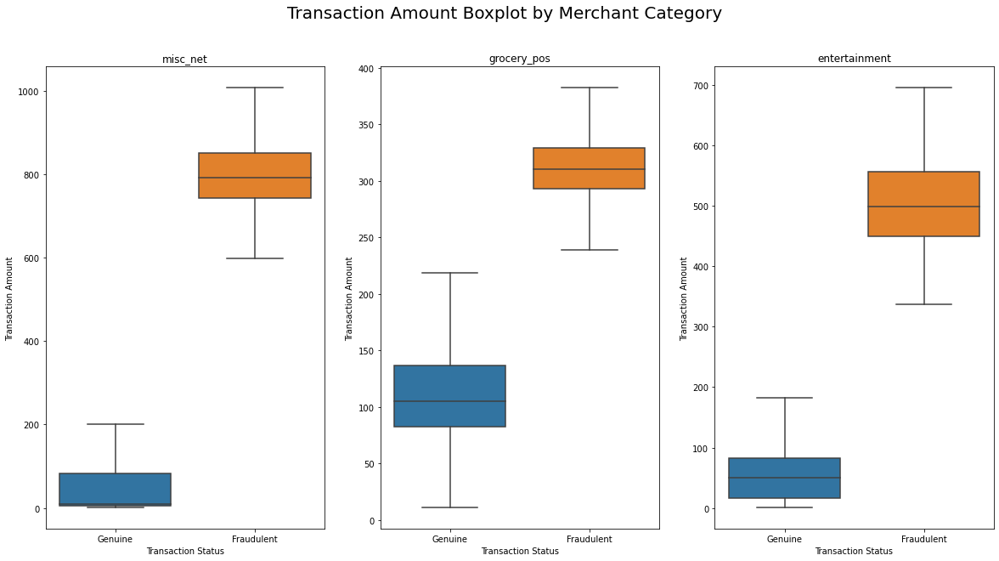

In [287]:
cat=np.array(df_train['category'].unique())
fig, ax = plt.subplots(1,3,figsize=(20,10))
cat=np.array(df_train['category'].unique())[0:3]
for i in range(1):
    for r in range(3):
        sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['category']==cat[r]],showfliers=False,ax=ax[r])
        ax[r].set_xlabel('Transaction Status')
        ax[r].set_ylabel('Transaction Amount')
        ax[r].set_title(cat[r])
        ax[r].set_xticklabels(['Genuine','Fraudulent'])
fig.suptitle('Transaction Amount Boxplot by Merchant Category',fontsize=20)
plt.show()

As we can see from the plots above, for all merchants shown in the chart (misc_net, grocery_pos and entertainment, all fraudulent transactions have the tendency to be higher than genuine transactions(s).

For all threshold testing dataframes, will be sorted based on Fraud Transaction/Total Transaction, since sorting by fraud detection rate would result in a very high Genuine to Fraud Transaction Ratio and sorting by Genuine to Fraud Transaction Ratio would result in very low detection rate(s).  By using Fraud Transaction/Total Transaction, by manually assessing thresholds using the threshold function.

In [288]:
threshold(df_train[(df_train['category']=='misc_net')],">",200,700,10,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,200,1.000000,915,5755,6.289617,0.137181
1,210,1.000000,915,5409,5.911475,0.144687
2,220,1.000000,915,5127,5.603279,0.151440
3,230,1.000000,915,4820,5.267760,0.159547
4,240,1.000000,915,4530,4.950820,0.168044
5,250,1.000000,915,4286,4.684153,0.175928
6,260,1.000000,915,4064,4.441530,0.183772
7,270,1.000000,915,3856,4.214208,0.191784
8,280,1.000000,915,3645,3.983607,0.200658
9,290,1.000000,915,3481,3.804372,0.208144


For misc_net merchant category, I will choose the threshold >610,since it give one of the highest fraud detection rate at around 99% with the lowest genuine to fraud ratio, Though 600 is a good fit, it only adds 2 positive fraud cases but adds 32 false alerts.

In [289]:
threshold(df_train[(df_train['category']=='grocery_pos')],">",150,400,10,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,150,1.000000,1743,24460,14.033276,0.066519
1,160,1.000000,1743,21762,12.485370,0.074154
2,170,1.000000,1743,19694,11.298910,0.081308
3,180,1.000000,1743,17255,9.899598,0.091746
4,190,1.000000,1743,13813,7.924842,0.112047
5,200,1.000000,1743,9893,5.675846,0.149794
6,210,1.000000,1743,6129,3.516351,0.221418
7,220,1.000000,1743,3273,1.877797,0.347488
8,230,0.867470,1512,1743,1.152778,0.464516
9,240,0.323580,564,1740,3.085106,0.244792


For grocery_pos category, I will choose the >230 threshold, it gives a 86.74% detection rate with a genuine to fraud transaction ratio of 1.15 to 1. The justification of choosing >230 is due to : 

* >220 adds a almost twice as much false positives while it only adds 231 new true positive transactions
* >230 gives the highest fraud detection rate (aside from >220 and below)

In [290]:
threshold(df_train[(df_train['category']=='entertainment')],">",200,700,10,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,200,1.000000,233,3536,15.175966,0.061820
1,210,1.000000,233,3059,13.128755,0.070778
2,220,1.000000,233,2700,11.587983,0.079441
3,230,1.000000,233,2356,10.111588,0.089996
4,240,1.000000,233,2046,8.781116,0.102238
5,250,1.000000,233,1803,7.738197,0.114440
6,260,1.000000,233,1560,6.695279,0.129950
7,270,1.000000,233,1337,5.738197,0.148408
8,280,1.000000,233,1174,5.038627,0.165601
9,290,1.000000,233,1029,4.416309,0.184628


For entertainment category, I will choose the >420 threshold since:

* It gives an 85% detection rate with a 1.035 genuine to fraudulent ratio 
* Whereas by choosing values such as >410 and >400 gives small increment in genuine positive cases (5-10) while adding false positive cases that is greater than the genuine positive cases. Moreover 5-10 cases is only around 0.6%-0.12% of the whole population of fraudulent transaction.

* Misc Net > 610
* grocery_pos >230
* entertainment > 420

### gas_transport, misc_pos, grocery_net

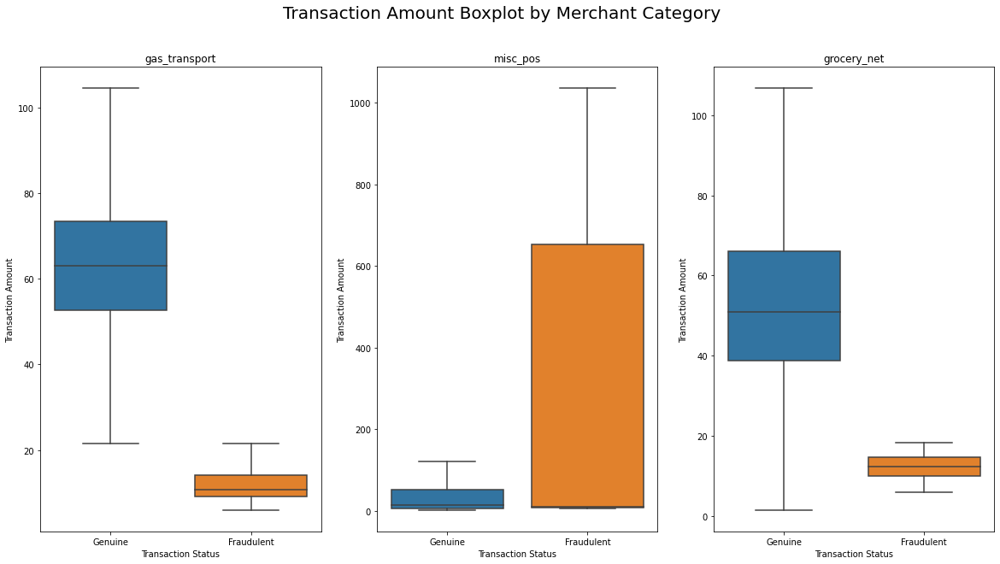

In [291]:
fig, ax = plt.subplots(1,3,figsize=(20,10))
cat=np.array(df_train['category'].unique())[3:6]
for i in range(1):
    for r in range(3):
        sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['category']==cat[r]],showfliers=False,ax=ax[r])
        ax[r].set_xlabel('Transaction Status')
        ax[r].set_ylabel('Transaction Amount')
        ax[r].set_title(cat[r])
        ax[r].set_xticklabels(['Genuine','Fraudulent'])
fig.suptitle('Transaction Amount Boxplot by Merchant Category',fontsize=20)
plt.show()

In [292]:
threshold(df_train[(df_train['category']=='gas_transport')],"<",20,60,1,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,20,0.022654,14,554,39.571429,0.024648
1,21,0.035599,22,584,26.545455,0.036304
2,22,0.063107,39,599,15.358974,0.061129
3,23,0.097087,60,607,10.116667,0.089955
4,24,0.134304,83,614,7.397590,0.119082
5,25,0.200647,124,618,4.983871,0.167116
6,26,0.299353,185,618,3.340541,0.230386
7,27,0.448220,277,618,2.231047,0.309497
8,28,0.613269,379,618,1.630607,0.380140
9,29,0.805825,498,618,1.240964,0.446237


For gas transport, I will choose <30 as the threshold as it gives the highest detection rate with the lowest genuine to fraud transaction ratio.

In [293]:
threshold(df_train[(df_train['category']=='misc_pos')],">",200,1000,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,200,0.256,64,6483,101.296875,0.009775
1,205,0.256,64,6287,98.234375,0.010077
2,210,0.256,64,6086,95.093750,0.010407
3,215,0.256,64,5904,92.250000,0.010724
4,220,0.256,64,5743,89.734375,0.011021
...,...,...,...,...,...,...
155,975,0.008,2,267,133.500000,0.007435
156,980,0.004,1,259,259.000000,0.003846
157,985,0.004,1,256,256.000000,0.003891
158,990,0.004,1,252,252.000000,0.003953


In [294]:
threshold(df_train[(df_train['category']=='misc_pos')],"<",0,50,5,'amt').head(10)

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000,0,0,NaN,NaN
1,5,0.000,0,18984,inf,0.000000
2,10,0.572,143,37594,262.895105,0.003789
3,15,0.580,145,40200,277.241379,0.003594
4,20,0.580,145,42183,290.917241,0.003426
5,25,0.580,145,44106,304.179310,0.003277
6,30,0.580,145,46987,324.048276,0.003076
7,35,0.580,145,51633,356.089655,0.002800
8,40,0.580,145,55877,385.358621,0.002588
9,45,0.580,145,58124,400.855172,0.002488


For Misc_pos, as can be seen from the boxplot, there is too much overlap in distribution of fraudulent and genuine transaction, thus, I will not be using the misc_pos category to generate a threshold. Aside from that, there is no genuine to fraudulent transaction ratio that is 10 or lower.

In [295]:
threshold(df_train[(df_train['category']=='grocery_net')],"<",10,200,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,10,0.261194,35,398,11.371429,0.080831
1,15,0.783582,105,949,9.038095,0.099620
2,20,1.000000,134,1954,14.582090,0.064176
3,25,1.000000,134,3537,26.395522,0.036502
4,30,1.000000,134,5834,43.537313,0.022453
5,35,1.000000,134,8744,65.253731,0.015093
6,40,1.000000,134,12130,90.522388,0.010926
7,45,1.000000,134,16322,121.805970,0.008143
8,50,1.000000,134,21650,161.567164,0.006151
9,55,1.000000,134,26741,199.559701,0.004986


For grocery net, I will use <15 as a threhsold, as it gives the highest detection rate for a genuine to fraud transaction ratio that is lower or equal to 10.

* misc_net > 610
* grocery_pos >230
* entertainment > 420
* gas_transport<30
* grocery_net <15

### shopping_net, shopping_pos, food_dining

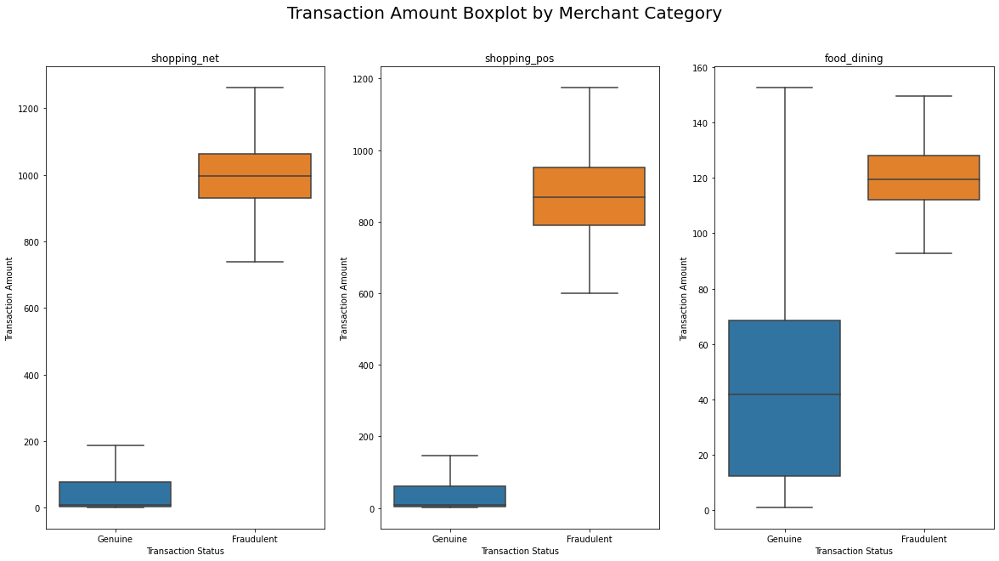

In [296]:

fig, ax = plt.subplots(1,3,figsize=(20,10))
cat=np.array(df_train['category'].unique())[6:9]
for i in range(1):
    for r in range(3):
        sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['category']==cat[r]],showfliers=False,ax=ax[r])
        ax[r].set_xlabel('Transaction Status')
        ax[r].set_ylabel('Transaction Amount')
        ax[r].set_title(cat[r])
        ax[r].set_xticklabels(['Genuine','Fraudulent'])
fig.suptitle('Transaction Amount Boxplot by Merchant Category',fontsize=20)
plt.show()

In [297]:
threshold(df_train[(df_train['category']=='shopping_net')],">",190,800,5,'amt').tail(30)

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
92,650,1.000000,1713,1845,1.077058,0.481450
93,655,1.000000,1713,1820,1.062464,0.484857
94,660,1.000000,1713,1793,1.046702,0.488591
95,665,1.000000,1713,1766,1.030940,0.492383
96,670,1.000000,1713,1738,1.014594,0.496378
97,675,0.996497,1707,1713,1.003515,0.499123
98,680,0.985989,1689,1713,1.014210,0.496473
99,685,0.974898,1670,1713,1.025749,0.493645
100,690,0.964974,1653,1713,1.036298,0.491087
101,695,0.950963,1629,1713,1.051565,0.487433


For shopping_net, I will use >675 as the threshold since : 
* gives a near perfect detection rate for that category for a genuine to fraud transaction ratio that is the lowest for a detection rate that is not equal to 1
* I did not choose >670 since it only adds around 6 cases (0.0799% of fraud transaction population) of new true positive cases but yet adds 25 new false positives.

* misc_net > 610
* grocery_pos >230
* entertainment > 420
* gas_transport<30
* grocery_net <15
* shopping_net>675

In [298]:
threshold(df_train[(df_train['category']=='shopping_pos')],">",200,800,10,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,200,1.000000,843,8654,10.265718,0.088765
1,210,1.000000,843,8250,9.786477,0.092709
2,220,1.000000,843,7906,9.378410,0.096354
3,230,1.000000,843,7594,9.008304,0.099917
4,240,1.000000,843,7307,8.667853,0.103436
5,250,1.000000,843,7043,8.354686,0.106898
6,260,1.000000,843,6799,8.065243,0.110311
7,270,1.000000,843,6579,7.804270,0.113581
8,280,1.000000,843,6358,7.542112,0.117067
9,290,1.000000,843,6152,7.297746,0.120515


For shopping pos, I choose >730 as a threshold since :
* it gives the lowest genuine to fraudulent transaction alert for a detection rate that is >=90%
* since choosing a lower detection rate does not give genuine to fraudulent transaction alert that is smaller, might as well maximize on the industry standard which is 90% and above yet still taking into account that  fraudulent transaction alert for a detection rate shall not be too massive.

* misc_net > 610
* grocery_pos >30
* entertainment > 420
* grocery_net <15
* shopping_net>675
* shopping_pos>730

In [299]:
threshold(df_train[(df_train['category']=='food_dining')],">",60,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,60,1.000000,151,30633,202.867550,0.004905
1,65,1.000000,151,25501,168.880795,0.005886
2,70,1.000000,151,21807,144.417219,0.006877
3,75,1.000000,151,19369,128.271523,0.007736
4,80,1.000000,151,17421,115.370861,0.008593
5,85,1.000000,151,15764,104.397351,0.009488
6,90,1.000000,151,14227,94.218543,0.010502
7,95,0.993377,150,12826,85.506667,0.011560
8,100,0.960265,145,11552,79.668966,0.012396
9,105,0.894040,135,10400,77.037037,0.012814


For food dining, there is no Genuine to Fraud Transaction Ratio that falls in the threshold 10 or lower. Thus, I will not be using this category to create a transaction amount threshold.

### personal_care, health_fitness, travel

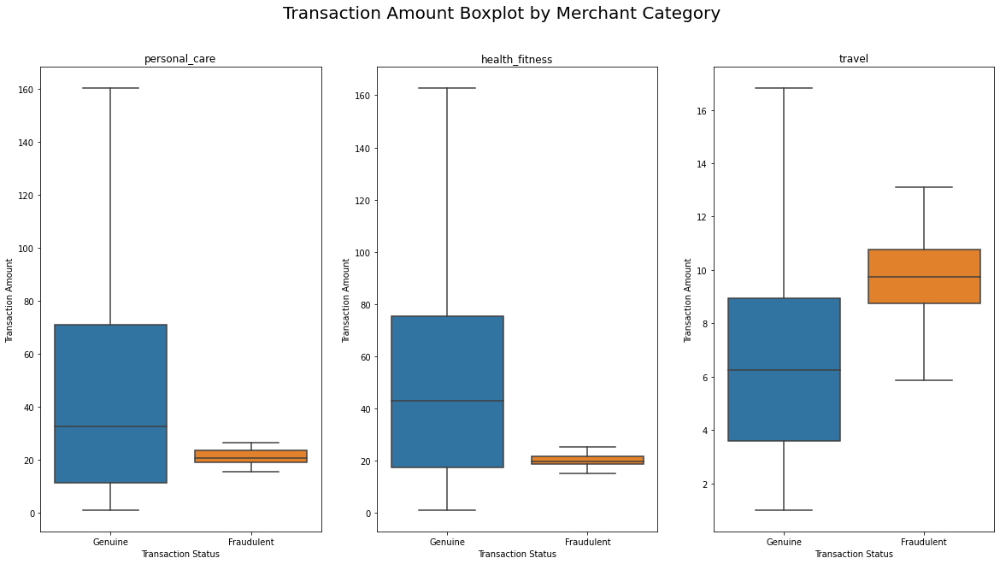

In [300]:

fig, ax = plt.subplots(1,3,figsize=(20,10))
cat=np.array(df_train['category'].unique())[9:12]
for i in range(1):
    for r in range(3):
        sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['category']==cat[r]],showfliers=False,ax=ax[r])
        ax[r].set_xlabel('Transaction Status')
        ax[r].set_ylabel('Transaction Amount')
        ax[r].set_title(cat[r])
        ax[r].set_xticklabels(['Genuine','Fraudulent'])
fig.suptitle('Transaction Amount Boxplot by Merchant Category',fontsize=20)
plt.show()

From initial inspection of the boxplot figures, it can be seen that there is a lot of overlap in the transaction amount distribution of personal_care and health_fitness, whereas for the travel category, there is less overlap in distribution and fraudulent transaction has the tendency to be distributed on transaction amounts that is higher than genuine transaction, thus, I will analyze it further using the threshold function.

In [301]:
threshold(df_train[(df_train['category']=='personal_care')],"<",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000000,0,0,NaN,NaN
1,5,0.000000,0,10144,inf,0.000000
2,10,0.000000,0,20606,inf,0.000000
3,15,0.000000,0,27303,inf,0.000000
4,20,0.368182,81,33070,408.271605,0.002443
5,25,0.786364,173,38304,221.410405,0.004496
6,30,0.800000,176,42957,244.073864,0.004080
7,35,0.800000,176,47123,267.744318,0.003721
8,40,0.800000,176,50787,288.562500,0.003453
9,45,0.804545,177,54088,305.581921,0.003262


In [302]:
threshold(df_train[(df_train['category']=='personal_care')],">",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,220,90538,411.536364,0.002424
1,5,1.000000,220,80374,365.336364,0.002730
2,10,1.000000,220,69916,317.800000,0.003137
3,15,1.000000,220,63224,287.381818,0.003468
4,20,0.627273,138,57457,416.355072,0.002396
5,25,0.213636,47,52223,1111.127660,0.000899
6,30,0.200000,44,47574,1081.227273,0.000924
7,35,0.200000,44,43404,986.454545,0.001013
8,40,0.200000,44,39744,903.272727,0.001106
9,45,0.195455,43,36446,847.581395,0.001178


In [303]:
threshold(df_train[(df_train['category']=='health_fitness')],"<",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000000,0,0,NaN,NaN
1,5,0.000000,0,6253,inf,0.000000
2,10,0.000000,0,13497,inf,0.000000
3,15,0.007519,1,19034,1.903400e+04,0.000053
4,20,0.548872,73,24139,3.306712e+02,0.003015
5,25,0.969925,129,28856,2.236899e+02,0.004451
6,30,1.000000,133,33226,2.498195e+02,0.003987
7,35,1.000000,133,37134,2.792030e+02,0.003569
8,40,1.000000,133,40871,3.073008e+02,0.003244
9,45,1.000000,133,44218,3.324662e+02,0.002999


In [304]:
threshold(df_train[(df_train['category']=='health_fitness')],">",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,133,85746,6.447068e+02,0.001549
1,5,1.000000,133,79474,5.975489e+02,0.001671
2,10,1.000000,133,72243,5.431805e+02,0.001838
3,15,0.992481,132,66702,5.053182e+02,0.001975
4,20,0.451128,60,61601,1.026683e+03,0.000973
5,25,0.030075,4,56879,1.421975e+04,0.000070
6,30,0.000000,0,52513,inf,0.000000
7,35,0.000000,0,48603,inf,0.000000
8,40,0.000000,0,44867,inf,0.000000
9,45,0.000000,0,41523,inf,0.000000


In [305]:
threshold(df_train[(df_train['category']=='travel')],"<",0,16,1,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000000,0,0,NaN,NaN
1,1,0.000000,0,0,NaN,NaN
2,2,0.043103,5,3940,788.000000,0.001267
3,3,0.086207,10,7776,777.600000,0.001284
4,4,0.094828,11,11609,1055.363636,0.000947
5,5,0.103448,12,15368,1280.666667,0.000780
6,6,0.129310,15,19197,1279.800000,0.000781
7,7,0.155172,18,23006,1278.111111,0.000782
8,8,0.181034,21,26767,1274.619048,0.000784
9,9,0.301724,35,30444,869.828571,0.001148


In [306]:
threshold(df_train[(df_train['category']=='travel')],">",0,16,1,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,116,40391,348.198276,0.002864
1,1,1.000000,116,40372,348.034483,0.002865
2,2,0.956897,111,36411,328.027027,0.003039
3,3,0.913793,106,32576,307.320755,0.003243
4,4,0.905172,105,28737,273.685714,0.003641
5,5,0.896552,104,24983,240.221154,0.004146
6,6,0.870690,101,21146,209.366337,0.004754
7,7,0.844828,98,17357,177.112245,0.005614
8,8,0.818966,95,13584,142.989474,0.006945
9,9,0.698276,81,9910,122.345679,0.008107


As can be seen, that for all 3 categories, all genuine to tranasction ratio are more than 10, thus, I will not make a threshold based classifier for the 3 categories.

### kids_pets, home

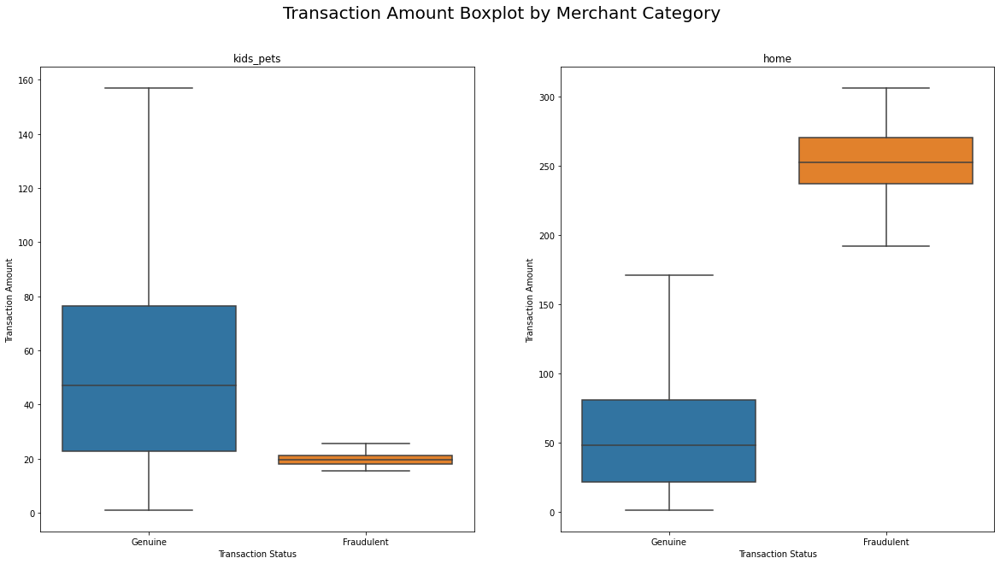

In [307]:

fig, ax = plt.subplots(1,2,figsize=(20,10))
cat=np.array(df_train['category'].unique())[12:14]
for i in range(1):
    for r in range(2):
        sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['category']==cat[r]],showfliers=False,ax=ax[r])
        ax[r].set_xlabel('Transaction Status')
        ax[r].set_ylabel('Transaction Amount')
        ax[r].set_title(cat[r])
        ax[r].set_xticklabels(['Genuine','Fraudulent'])
fig.suptitle('Transaction Amount Boxplot by Merchant Category',fontsize=20)
plt.show()

In [308]:
threshold(df_train[(df_train['category']=='kids_pets')],">",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,239,112796,4.719498e+02,0.002114
1,5,0.945607,226,107321,4.748717e+02,0.002101
2,10,0.866109,207,100353,4.847971e+02,0.002058
3,15,0.866109,207,94079,4.544879e+02,0.002195
4,20,0.405858,97,87932,9.065155e+02,0.001102
5,25,0.008368,2,82060,4.103000e+04,0.000024
6,30,0.000000,0,76526,inf,0.000000
7,35,0.000000,0,71234,inf,0.000000
8,40,0.000000,0,66040,inf,0.000000
9,45,0.000000,0,59858,inf,0.000000


In [309]:
threshold(df_train[(df_train['category']=='kids_pets')],"<",0,160,5,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000000,0,0,NaN,NaN
1,5,0.054393,13,5465,420.384615,0.002373
2,10,0.133891,32,12427,388.343750,0.002568
3,15,0.133891,32,18697,584.281250,0.001709
4,20,0.594142,142,24851,175.007042,0.005682
5,25,0.991632,237,30724,129.637131,0.007655
6,30,1.000000,239,36251,151.677824,0.006550
7,35,1.000000,239,41550,173.849372,0.005719
8,40,1.000000,239,46743,195.577406,0.005087
9,45,1.000000,239,52921,221.426778,0.004496


In [310]:
threshold(df_train[(df_train['category']=='home')],">",70,300,10,'amt')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,70,1.000000,198,43488,219.636364,0.004532
1,80,1.000000,198,31907,161.146465,0.006167
2,90,1.000000,198,21859,110.398990,0.008977
3,100,1.000000,198,16732,84.505051,0.011695
4,110,1.000000,198,13582,68.595960,0.014369
5,120,1.000000,198,11020,55.656566,0.017650
6,130,1.000000,198,9038,45.646465,0.021438
7,140,1.000000,198,7391,37.328283,0.026090
8,150,1.000000,198,6041,30.510101,0.031736
9,160,1.000000,198,4888,24.686869,0.038930


* For all kids_pets all genuine to fraudulent transaction ratio are more than 10, thus, I will not make a threshold based classifier for the kids_pets category. 
* For home, I will choose >240 as a threshold since it gives a genuine to fraudulent transaction ratio that is the lowest by far while giving a 71% detection rate. If I chose >230 instead, it would only add 21 new true positive cases while adding 231 new false positive cases .

### Boxplot : Threshold Visualisation

# Fraud Alert Parameter Creation

## Classifier 1 : Using Merchant Category Distribution

* misc_net > 610
* grocery_pos >230
* entertainment > 420
* grocery_net <15
* shopping_net>675
* shopping_pos>730
* home>230
* gas_transport>30

In [620]:
def classif_data(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    else :
        return 0

In [312]:
df_train['classifier_1']=df_train.apply(classif_data,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_1'])

classifier_1,0,1
is_fraud,,
0,1280237,8932
1,1244,6262


In [313]:
df_test['classifier_1']=df_test.apply(classif_data,axis=1)

In [314]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,83.43 %,1.43


In [315]:
fraud_metrics(df_test['is_fraud'],df_test['classifier_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,80.28 %,2.16


In [316]:
df_train[(df_train['classifier_1']==1)&(df_train['greater than average_trf']==True)]['is_fraud'].value_counts()

0    7290
1    5352
Name: is_fraud, dtype: int64

In [317]:
7290/5352

1.3621076233183858

In [318]:
df_cf1=pd.concat([fraud_metrics(df_train['is_fraud'],df_train['classifier_1']),fraud_metrics(df_test['is_fraud'],df_test['classifier_1'])])
df_cf1['Data']=['Training Data','Testing Data']
df_cf1.index=['Classifier 1','Classifier 1']

From seing the fraud metrics, we can see that the performance has been improved significantly, from just using the amount column at a global scope, now we will combine the two rules and see whether the performance will improve.

## Classifier 2 : Global + Merchant Category Distribution

In [319]:
def classif_data2(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif data['amt']>245.66:
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    else :
        return 0

In [320]:
df_train['classifier_2']=df_train.apply(classif_data2,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_2'])

classifier_2,0,1
is_fraud,,
0,1252355,36814
1,1071,6435


In [321]:
df_test['classifier_2']=df_test.apply(classif_data2,axis=1)


In [322]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,85.73 %,5.72


In [323]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,83.43 %,1.43


In [324]:
df_cf2=pd.concat([fraud_metrics(df_train['is_fraud'],df_train['classifier_2']),fraud_metrics(df_test['is_fraud'],df_test['classifier_2'])])
df_cf2['Data']=['Training Data','Testing Data']
df_cf2.index=['Classifier 2','Classifier 2']

In [325]:
df_sum=pd.concat([fraud_metrics(df_train['is_fraud'],df_train['classifier_1']),fraud_metrics(df_train['is_fraud'],df_train['classifier_2'])],axis=0)

In [326]:
df_sum.index=['Classifier 1','Classifier 2']

In [327]:
df_sum

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
Classifier 1,83.43 %,1.43
Classifier 2,85.73 %,5.72


Right off the bat, we can observe a two possible scenario, where with detection rate of the second classifier is higher than classifier 1, the genuine to fraudulent transaction alert ratio also exceeds the classifier 1, we cans see that there is an apparent trade off between detection rate and genuine to fraud alert transaction ratio.

# Fraud Parameter Improvement

In this section, I will attempt to "improve" the performance of classifier 1 and classifier 2 by "going back" to some transaction parameters that has been explored in the previous section.

## Classifier 1

### Categorical Columns

In [330]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','time category'],"No",1)

,is_fraud,time category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
6,1,Evening,906,0.28%,72.83%,358.209713
5,1,Early Morning,184,0.06%,14.79%,1584.413043
4,1,Afternoon,119,0.03%,9.57%,3280.260504
7,1,Late Morning,35,0.01%,2.81%,7823.314286


In [331]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','merchant_country'],"No",1)

,is_fraud,merchant_country,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
5,1,Bahamas,3,0.63%,0.24%,157.333333
8,1,Mexico,7,0.23%,0.56%,440.285714
9,1,United States,1218,0.10%,97.91%,1033.583744
6,1,Canada,16,0.09%,1.29%,1093.875000
7,1,Cuba,0,0.00%,0.00%,inf


In [332]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','merchant_admin1'],"No",1)

,is_fraud,merchant_admin1,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
136,1,West Grand Bahama,2,0.67%,0.16%,148.500000
76,1,Bimini,1,0.57%,0.08%,175.000000
116,1,Nuevo Leon,5,0.43%,0.40%,233.000000
96,1,Manitoba,1,0.33%,0.08%,300.000000
71,1,Alaska,5,0.24%,0.40%,415.400000
130,1,Utah,16,0.17%,1.29%,576.187500
120,1,Oregon,29,0.16%,2.33%,632.310345
126,1,South Dakota,20,0.16%,1.61%,641.050000
122,1,Quebec,4,0.14%,0.32%,703.500000
81,1,Colorado,24,0.14%,1.93%,717.333333


In [333]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','merchant_admin2'],"No",1)

,is_fraud,merchant_admin2,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
2215,1,City of Waynesboro,1,3.23%,0.08%,30.000000
2611,1,Hemphill County,1,2.70%,0.08%,36.000000
3123,1,Pamlico County,1,1.96%,0.08%,50.000000
2664,1,Hyde County,1,1.79%,0.08%,55.000000
3444,1,Storey County,1,1.61%,0.08%,61.000000
2128,1,Cavalier County,1,1.43%,0.08%,69.000000
1934,1,Bacon County,2,1.37%,0.16%,72.000000
1864,1,Alamosa County,2,1.32%,0.16%,74.500000
2715,1,Juab County,1,1.32%,0.08%,75.000000
2205,1,City of Poquoson,1,1.27%,0.08%,78.000000


In [334]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','cc_holder_admin1'],"No",1)

,is_fraud,cc_holder_admin1,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
104,1,"Washington, D.C.",4,0.26%,0.32%,382.250000
55,1,Alaska,5,0.24%,0.40%,415.400000
94,1,Rhode Island,1,0.19%,0.08%,529.000000
100,1,Utah,18,0.17%,1.45%,586.833333
70,1,Kansas,39,0.16%,3.14%,632.615385
98,1,Tennessee,24,0.15%,1.93%,655.541667
105,1,West Virginia,39,0.15%,3.14%,661.717949
96,1,South Carolina,42,0.14%,3.38%,697.095238
63,1,Florida,58,0.14%,4.66%,724.741379
92,1,Oregon,26,0.14%,2.09%,725.884615


In [335]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','cc_holder_admin2'],"No",1)

,is_fraud,cc_holder_admin2,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
1035,1,Tillamook County,8,1.59%,0.64%,61.750000
909,1,Nobles County,7,1.36%,0.56%,72.428571
825,1,Lassen County,6,1.19%,0.48%,83.166667
974,1,Rock County,6,1.18%,0.48%,83.833333
692,1,Davidson County,6,1.15%,0.48%,85.666667
991,1,Sangamon County,5,1.02%,0.40%,96.600000
770,1,Herkimer County,8,0.78%,0.64%,127.125000
583,1,Bamberg County,4,0.78%,0.32%,127.250000
743,1,Goodhue County,4,0.77%,0.32%,128.750000
612,1,Bryan County,4,0.77%,0.32%,129.250000


In [336]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','time category','category'],"No",1)

,is_fraud,time category,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
93,1,Evening,misc_pos,101,0.71%,8.12%,140.118812
71,1,Early Morning,food_dining,34,0.59%,2.73%,169.764706
97,1,Evening,travel,92,0.54%,7.40%,183.565217
94,1,Evening,personal_care,185,0.49%,14.87%,204.140541
91,1,Evening,kids_pets,203,0.43%,16.32%,231.738916
79,1,Early Morning,misc_pos,98,0.37%,7.88%,269.591837
89,1,Evening,health_fitness,109,0.31%,8.76%,326.275229
85,1,Evening,food_dining,92,0.27%,7.40%,370.608696
96,1,Evening,shopping_pos,48,0.17%,3.86%,596.250000
73,1,Early Morning,grocery_net,27,0.10%,2.17%,960.407407


In [337]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','day'],"No",1)

,is_fraud,day,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
9,1,Saturday,224,0.11%,18.01%,885.468750
7,1,Friday,164,0.11%,13.18%,915.524390
11,1,Thursday,153,0.11%,12.30%,949.718954
13,1,Wednesday,136,0.11%,10.93%,950.845588
12,1,Tuesday,166,0.10%,13.34%,953.060241
8,1,Monday,211,0.08%,16.96%,1190.957346
10,1,Sunday,190,0.08%,15.27%,1303.284211


In [338]:
fraud_category(df_train[df_train['classifier_1']==0],['is_fraud','time category','category'],"No",1)

,is_fraud,time category,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
93,1,Evening,misc_pos,101,0.71%,8.12%,140.118812
71,1,Early Morning,food_dining,34,0.59%,2.73%,169.764706
97,1,Evening,travel,92,0.54%,7.40%,183.565217
94,1,Evening,personal_care,185,0.49%,14.87%,204.140541
91,1,Evening,kids_pets,203,0.43%,16.32%,231.738916
79,1,Early Morning,misc_pos,98,0.37%,7.88%,269.591837
89,1,Evening,health_fitness,109,0.31%,8.76%,326.275229
85,1,Evening,food_dining,92,0.27%,7.40%,370.608696
96,1,Evening,shopping_pos,48,0.17%,3.86%,596.250000
73,1,Early Morning,grocery_net,27,0.10%,2.17%,960.407407


From categorical columns, it appears that we cannot add any more parameters since all genuine to fraud transaction ratio is greater than 10. This makes sense since the "false negatives" will even face a larger class imbalance with the true negatives.

While in the previous section I have stated that the distance column is inconclusive, I will give this column another shot to see whether I can detect any patterns that differ the false negatives from the true negatives.

### Distance Column

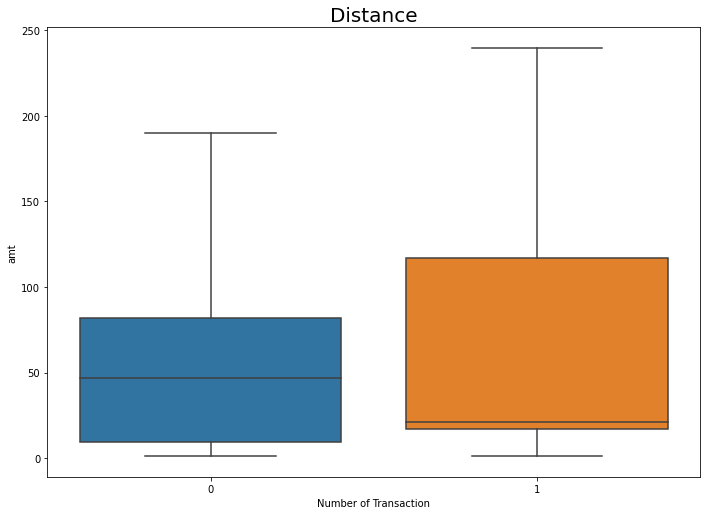

In [339]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['classifier_1']==0],showfliers=False)
ax.set_xlabel('Number of Transaction')
plt.title('Distance',fontsize=20)
plt.show()

In [340]:
threshold(df_train[df_train['classifier_1']==0],">",50,250,5,'distance')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
18,140,0.001608,2,1283,641.500000,0.001556
17,135,0.006431,8,6564,820.500000,0.001217
16,130,0.017685,22,18733,851.500000,0.001173
10,100,0.241158,300,298983,996.610000,0.001002
9,95,0.299035,372,370976,997.247312,0.001002
8,90,0.356913,444,447418,1007.698198,0.000991
0,50,0.800643,996,1018303,1022.392570,0.000977
2,60,0.708199,881,903389,1025.413167,0.000974
1,55,0.755627,940,964011,1025.543617,0.000974
3,65,0.655145,815,838531,1028.872393,0.000971


In [341]:
threshold(df_train[df_train['classifier_1']==0],"<",0,250,5,'distance')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
14,70,0.413987,515,512593,995.326214,0.001004
15,75,0.467042,581,588695,1013.244406,0.000986
16,80,0.529743,659,669041,1015.236722,0.000984
21,105,0.831190,1034,1050371,1015.832689,0.000983
17,85,0.591640,736,752148,1021.940217,0.000978
23,115,0.922830,1148,1173822,1022.493031,0.000977
25,125,0.975080,1213,1241558,1023.543281,0.000976
22,110,0.877010,1091,1117631,1024.409716,0.000975
24,120,0.951768,1184,1212980,1024.476351,0.000975
29,145,1.000000,1244,1280138,1029.049839,0.000971


From the distance column, there is also no threshold that could give a clear separation between the false negatives (fraudulent transaction) and the true negatives (genuine transaction).

### Observed Patterns

In the previous section(s) we have identified the following :

* Fraud transactions are likely to be higher than the mean of previous transactions amount
* Fraud transactions are likely to be outlier
Thus, I will add both the criterias one-by-one to the classifiers in order to see whether it will substantially improve the performance of the classifiers.

In [619]:
def classif_data_v2(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    elif (data['greater than average_trf']==True) :
        return 1
    else :
        return 0

In [621]:
df_train['classifier_1_v2']=df_train.apply(classif_data_v2,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_1_v2'])

classifier_1_v2,0,1
is_fraud,,
0,868591,420578
1,883,6623


In [628]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1_v2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,88.24 %,63.5


In [632]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,83.43 %,1.43


As we can see, though the detection rate has significantly improved by 5%, the genuine to fraudulent transaction ratio increased 44 times than the prior. Since our maximum tolerance is 10 :1, I will not use the "greater than average transaction amt average" prior to transaction as an added rule.

In [622]:
def classif_data_v3(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    elif (data['is_outlier']==1) :
        return 1
    else :
        return 0

In [623]:
df_train['classifier_1_v3']=df_train.apply(classif_data_v3,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_1_v3'])

classifier_1_v3,0,1
is_fraud,,
0,1225941,63228
1,1019,6487


In [631]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1_v3'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,86.42 %,9.75


In [630]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_1'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,83.43 %,1.43


From adding the outlier parameter, we get an increase of around 3% in fraud detection rate. I will not add this as a rule since :

* The genuine to fraudulent transaction alert ratio increased by 6.81 times the original classisfier 
Where if i am looking for a better performance I would favor to use classifier two since : 
* It gives 85.73 %	(less than 1% difference than the classifier above) with 5.72 genuine to fraudulent transaction alert ratio which is around 40% lower than adding an outlier parameter to the classifier

Thus, I will not be adding the two observed patterns as an additional rule to the classifiers.

## Classifier 2

Just like the previous section, I will attempt to do the same thing with classifier 2, whereas I will attempt to improve the performance of the classifier by going back to some transaction columns to assess whether i can improve the performance (detection rate).

In [342]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','time category'],"No",1)

,is_fraud,time category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
6,1,Evening,834,0.26%,77.87%,379.723022
5,1,Early Morning,102,0.04%,9.52%,2806.176471
4,1,Afternoon,110,0.03%,10.27%,3464.500000
7,1,Late Morning,25,0.01%,2.33%,10733.640000


### Categorical Columns

In [521]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','time category'],"No",1)

,is_fraud,time category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
6,1,Evening,834,0.26%,77.87%,379.723022
5,1,Early Morning,102,0.04%,9.52%,2806.176471
4,1,Afternoon,110,0.03%,10.27%,3464.500000
7,1,Late Morning,25,0.01%,2.33%,10733.640000


In [522]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','merchant_country'],"No",1)

,is_fraud,merchant_country,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
5,1,Bahamas,3,0.65%,0.28%,152.666667
8,1,Mexico,7,0.23%,0.65%,428.285714
6,1,Canada,15,0.09%,1.40%,1141.533333
9,1,United States,1046,0.08%,97.67%,1177.346080
7,1,Cuba,0,0.00%,0.00%,inf


In [523]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','merchant_admin1'],"No",1)

,is_fraud,merchant_admin1,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
136,1,West Grand Bahama,2,0.69%,0.19%,144.000000
76,1,Bimini,1,0.58%,0.09%,170.000000
116,1,Nuevo Leon,5,0.44%,0.47%,227.000000
96,1,Manitoba,1,0.34%,0.09%,293.000000
71,1,Alaska,4,0.20%,0.37%,510.250000
122,1,Quebec,4,0.14%,0.37%,690.500000
130,1,Utah,13,0.14%,1.21%,692.538462
120,1,Oregon,24,0.13%,2.24%,747.791667
75,1,Baja California,1,0.13%,0.09%,756.000000
81,1,Colorado,22,0.13%,2.05%,762.045455


In [524]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','merchant_admin2'],"No",1)

,is_fraud,merchant_admin2,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
2215,1,City of Waynesboro,1,3.23%,0.09%,30.000000
2611,1,Hemphill County,1,2.78%,0.09%,35.000000
3123,1,Pamlico County,1,2.08%,0.09%,47.000000
2664,1,Hyde County,1,1.79%,0.09%,55.000000
3444,1,Storey County,1,1.61%,0.09%,61.000000
2128,1,Cavalier County,1,1.45%,0.09%,68.000000
1864,1,Alamosa County,2,1.34%,0.19%,73.500000
2715,1,Juab County,1,1.33%,0.09%,74.000000
2205,1,City of Poquoson,1,1.30%,0.09%,76.000000
3416,1,Spalding County,1,1.20%,0.09%,82.000000


In [525]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','cc_holder_admin1'],"No",1)

,is_fraud,cc_holder_admin1,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
104,1,"Washington, D.C.",3,0.20%,0.28%,496.666667
55,1,Alaska,4,0.20%,0.37%,510.250000
94,1,Rhode Island,1,0.19%,0.09%,524.000000
100,1,Utah,15,0.14%,1.40%,689.666667
70,1,Kansas,34,0.14%,3.17%,708.617647
63,1,Florida,51,0.12%,4.76%,804.647059
105,1,West Virginia,31,0.12%,2.89%,814.258065
96,1,South Carolina,35,0.12%,3.27%,822.485714
98,1,Tennessee,18,0.12%,1.68%,854.722222
92,1,Oregon,21,0.11%,1.96%,880.285714


In [526]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','cc_holder_admin2'],"No",1)

,is_fraud,cc_holder_admin2,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
909,1,Nobles County,6,1.19%,0.56%,83.333333
991,1,Sangamon County,5,1.04%,0.47%,95.000000
1035,1,Tillamook County,5,1.01%,0.47%,97.800000
964,1,Reeves County,4,0.81%,0.37%,122.750000
692,1,Davidson County,4,0.79%,0.37%,125.000000
612,1,Bryan County,4,0.78%,0.37%,127.500000
700,1,Dooly County,4,0.77%,0.37%,129.000000
944,1,Pitt County,7,0.75%,0.65%,132.000000
770,1,Herkimer County,7,0.69%,0.65%,144.428571
1001,1,Seneca County,3,0.62%,0.28%,161.333333


In [527]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','cc_holder_admin2'],"No",1)

,is_fraud,cc_holder_admin2,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
909,1,Nobles County,6,1.19%,0.56%,83.333333
991,1,Sangamon County,5,1.04%,0.47%,95.000000
1035,1,Tillamook County,5,1.01%,0.47%,97.800000
964,1,Reeves County,4,0.81%,0.37%,122.750000
692,1,Davidson County,4,0.79%,0.37%,125.000000
612,1,Bryan County,4,0.78%,0.37%,127.500000
700,1,Dooly County,4,0.77%,0.37%,129.000000
944,1,Pitt County,7,0.75%,0.65%,132.000000
770,1,Herkimer County,7,0.69%,0.65%,144.428571
1001,1,Seneca County,3,0.62%,0.28%,161.333333


In [528]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','time category','category'],"No",1)

,is_fraud,time category,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
93,1,Evening,misc_pos,101,0.76%,9.43%,130.247525
97,1,Evening,travel,92,0.62%,8.59%,159.000000
71,1,Early Morning,food_dining,34,0.59%,3.17%,168.529412
94,1,Evening,personal_care,185,0.49%,17.27%,202.675676
91,1,Evening,kids_pets,203,0.43%,18.95%,230.256158
89,1,Evening,health_fitness,109,0.31%,10.18%,323.954128
85,1,Evening,food_dining,92,0.27%,8.59%,368.315217
79,1,Early Morning,misc_pos,41,0.16%,3.83%,608.829268
73,1,Early Morning,grocery_net,27,0.10%,2.52%,960.407407
90,1,Evening,home,52,0.10%,4.86%,975.211538


In [529]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','day'],"No",1)


,is_fraud,day,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
9,1,Saturday,195,0.10%,18.21%,995.092308
13,1,Wednesday,126,0.10%,11.76%,1003.666667
7,1,Friday,142,0.10%,13.26%,1035.169014
11,1,Thursday,134,0.09%,12.51%,1060.164179
12,1,Tuesday,136,0.09%,12.70%,1138.375000
8,1,Monday,178,0.07%,16.62%,1380.567416
10,1,Sunday,160,0.07%,14.94%,1513.962500


In [530]:
fraud_category(df_train[df_train['classifier_2']==0],['is_fraud','time category','category'],"No",1)

,is_fraud,time category,category,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
93,1,Evening,misc_pos,101,0.76%,9.43%,130.247525
97,1,Evening,travel,92,0.62%,8.59%,159.000000
71,1,Early Morning,food_dining,34,0.59%,3.17%,168.529412
94,1,Evening,personal_care,185,0.49%,17.27%,202.675676
91,1,Evening,kids_pets,203,0.43%,18.95%,230.256158
89,1,Evening,health_fitness,109,0.31%,10.18%,323.954128
85,1,Evening,food_dining,92,0.27%,8.59%,368.315217
79,1,Early Morning,misc_pos,41,0.16%,3.83%,608.829268
73,1,Early Morning,grocery_net,27,0.10%,2.52%,960.407407
90,1,Evening,home,52,0.10%,4.86%,975.211538


From categorical columns, it appears that we cannot add any more parameters since all genuine to fraud transaction ratio is greater than 10. This makes sense since the "false negatives" will even face a larger class imbalance with the true negatives.

### DIstance Column

Just like the previous section, I will attempt to observe whether there is any significant pattern that can be derived from the distance column.

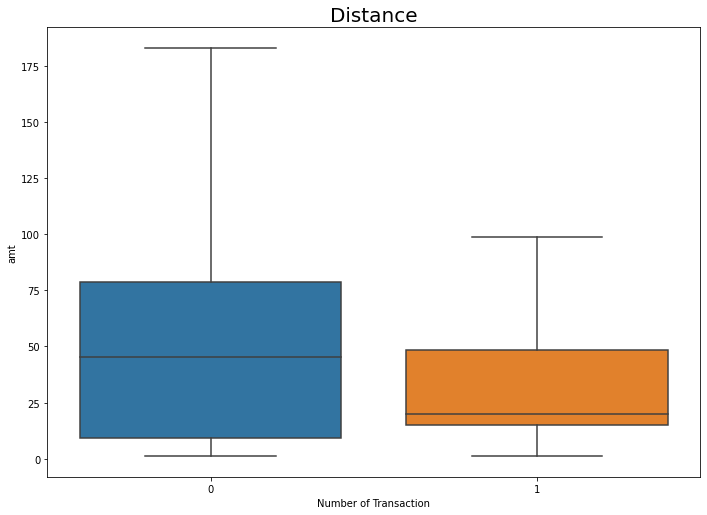

In [343]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(y='amt',x='is_fraud',data=df_train[df_train['classifier_2']==0],showfliers=False)
ax.set_xlabel('Number of Transaction')
plt.title('Distance',fontsize=20)
plt.show()

In [344]:
threshold(df_train[df_train['classifier_2']==0],"<",0,250,5,'distance')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
14,70,0.414566,444,501350,1129.166667,0.000885
15,75,0.466853,500,575804,1151.608000,0.000868
21,105,0.831933,891,1027398,1153.084175,0.000866
13,65,0.349206,374,431990,1155.053476,0.000865
16,80,0.528478,566,654383,1156.153710,0.000864
23,115,0.926237,992,1148302,1157.562500,0.000863
22,110,0.878618,941,1093284,1161.832094,0.000860
24,120,0.953315,1021,1186589,1162.183154,0.000860
17,85,0.591036,633,735711,1162.260664,0.000860
25,125,0.974790,1044,1214512,1163.325670,0.000859


In [345]:
threshold(df_train[df_train['classifier_2']==0],">",0,250,5,'distance')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
28,140,0.001867,2,1255,627.500000,0.001591
27,135,0.006536,7,6432,918.857143,0.001087
26,130,0.017740,19,18342,965.368421,0.001035
19,95,0.303455,325,362963,1116.809231,0.000895
20,100,0.242764,260,292528,1125.107692,0.000888
18,90,0.356676,382,437745,1145.929319,0.000872
7,35,0.909430,974,1127041,1157.126283,0.000863
10,50,0.802988,860,996113,1158.270930,0.000863
6,30,0.934641,1001,1160147,1158.988012,0.000862
4,20,0.975724,1045,1211323,1159.160766,0.000862


The same pattern is observed in classifier 2 where there is no columns that could be added to enhance the classifier parameter.

### Observed Patterns

In the previous section(s) we have identified the following :

* Fraud transactions are likely to be higher than the mean of previous transactions amount
* Fraud transactions are likely to be outlier
Thus, I will add both the criterias one-by-one to the classifiers in order to see whether it will substantially improve the performance of the classifiers.

In [624]:
def classif_data2_v2(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif data['amt']>245.66:
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    elif (data['greater than average_trf']==True) :
        return 1
    else :
        return 0

In [625]:
df_train['classifier_2_v2']=df_train.apply(classif_data2_v2,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_2_v2'])

classifier_2_v2,0,1
is_fraud,,
0,868588,420581
1,883,6623


In [633]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_2_v2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,88.24 %,63.5


In [634]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,85.73 %,5.72


As we can see, though the detection rate has improved by around 3.5%, the genuine to fraudulent transaction ratio increased 11 times than the prior. Since our maximum tolerance is 10 :1, I will not use the "greater than average transaction amt average" prior to transaction as an added rule.

In [626]:
def classif_data2_v3(data):
    if (data['cc_num'] in fraud_cc):
        return 1
    elif data['amt']>245.66:
        return 1
    elif ((data['category'] == "misc_net") & (data['amt']>610)):
        return 1
    elif ((data['category'] == "grocery_pos") & (data['amt']>230)):
        return 1
    elif ((data['category'] == "gas_transport") & (data['amt']<30)):
        return 1
    elif ((data['category'] == "entertainment") & (data['amt']>420)):
        return 1
    elif ((data['category'] == "grocery_net") & (data['amt']<15)):
        return 1
    elif ((data['category'] == "shopping_net") & (data['amt']>675)):
        return 1
    elif ((data['category'] == "shopping_pos") & (data['amt']>735)):
        return 1
    elif ((data['category'] == "home") & (data['amt']>240)):
        return 1
    elif (data['is_outlier']==1) :
        return 1
    else :
        return 0

In [627]:
df_train['classifier_2_v3']=df_train.apply(classif_data2_v3,axis=1)
pd.crosstab(df_train['is_fraud'],df_train['classifier_2_v3'])

classifier_2_v3,0,1
is_fraud,,
0,1225941,63228
1,1019,6487


In [636]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_2'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,85.73 %,5.72


In [635]:
fraud_metrics(df_train['is_fraud'],df_train['classifier_2_v3'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,86.42 %,9.75


From adding the outlier parameter, we get an increase of around 3% in fraud detection rate. I will not add this as a rule since :

* It gives 85.73 % (less than 1% difference than the classifier above) with 5.72 genuine to fraudulent transaction alert ratio which is around 40% lower than adding an outlier parameter to the classifier

Thus, I will not be adding the two observed patterns as an additional rule to the classifiers.

# Fraud Parameter Creation Attempt

# Demographic Parameter

Generally banks do not prefer to use demographic parameter as it can be too specific towards a certain customer segment. But since we have no reached a detection rate of 90%, I will use the demographic parameter in an attempt to improve the detection rate.

## Street

In [534]:
fraud_category(df_train,['is_fraud','street'],"No",1)

,is_fraud,street,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
1462,1,4716 Tracy Bridge,9,100.00%,0.12%,0.000000
1554,1,56261 Keith Plaza,12,100.00%,0.16%,0.000000
1539,1,554 Harrell Ferry Suite 533,9,100.00%,0.12%,0.000000
1798,1,8206 Harris Extensions Apt. 996,9,100.00%,0.12%,0.000000
1529,1,543 Mindy Oval,11,100.00%,0.15%,0.000000
1513,1,5273 Joseph Isle Suite 518,7,100.00%,0.09%,0.000000
1814,1,837 Kimberly Turnpike,15,100.00%,0.20%,0.000000
1509,1,5205 Annette Islands Apt. 043,19,100.00%,0.25%,0.000000
1503,1,5124 Wendy Skyway Suite 154,7,100.00%,0.09%,0.000000
1487,1,4940 Donald Throughway Apt. 219,7,100.00%,0.09%,0.000000


<AxesSubplot:ylabel='Frequency'>

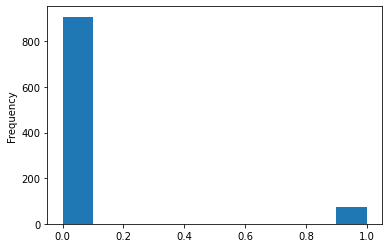

In [531]:
fraud_category(df_train,['is_fraud','street'],"Plot",1)['Percentage over total # of Transactions'].plot(kind='hist')

From the plot and table above, it appears that there are several street addresses that perpetuate to a 100% fraudulent transaction rate. To observe this on a smaller scope, I will create a list of the streets associated with 100% fraud transaction.

In [532]:
fraud_street=fraud_category(df_train,['is_fraud','street'],"Yes",1)

In [533]:
df_train[df_train['street'].isin(fraud_street)]['cc_num'].isin(fraud_cc).value_counts()

True    741
Name: cc_num, dtype: int64

In [356]:
df_test[df_test['street'].isin(fraud_street)]['cc_num'].isin(fraud_cc).value_counts()

Series([], Name: cc_num, dtype: int64)

Upon subsetting the data based on street that contibutes 100% to fraud transaction, it appears that this small subset is already catered by the fraud_cc list, so I don't need to add anymore parameter based on the street column. Aside from that it was agreed upon the cc number section that the anti-fraud unit would need to do an investigation to identify whether the names associated with the transactions are in fact fraudsters of mere victims.

## first and last name

Next, I will analyze the first and last name column.

In [357]:
df_train['Full Name']=df_train['first'].astype(str)+" "+df_train['last'].astype(str)

<AxesSubplot:ylabel='Frequency'>

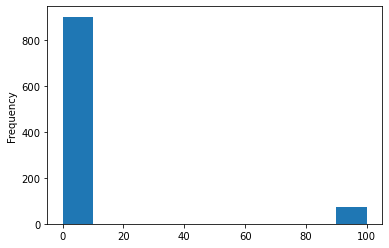

In [358]:
fraud_category(df_train,['is_fraud','Full Name'],"Plot",1)['Percentage over total # of Transactions'].plot(kind='hist')

In [359]:
fraudster=fraud_category(df_train,['is_fraud','Full Name'],"Yes",1)

In [360]:
df_train[df_train['Full Name'].isin(fraudster)]['classifier_2'].value_counts()

1    724
Name: classifier_2, dtype: int64

In [361]:
df_train[df_train['Full Name'].isin(fraudster)]['classifier_1'].value_counts()

1    724
Name: classifier_1, dtype: int64

Since all of the names in the fraudster list has been identified, there is no need to create a parameter from the full name.

Lastly, I will attempt to create a cross tabulation that will display all cc holders that has the same last name as the fraudsters and whether they have been classified as fraud by the classifiers.

In [362]:
pd.crosstab(df_train[df_train['last'].isin(df_train[df_train['Full Name'].isin(fraudster)]['last'].unique())]['is_fraud'],df_train[df_train['last'].isin(df_train[df_train['Full Name'].isin(fraudster)]['last'].unique())]['classifier_2'])

classifier_2,0,1
is_fraud,,
0,192495,5864
1,183,1594


In [363]:
pd.crosstab(df_train[df_train['last'].isin(df_train[df_train['Full Name'].isin(fraudster)]['last'].unique())]['is_fraud'],df_train[df_train['last'].isin(df_train[df_train['Full Name'].isin(fraudster)]['last'].unique())]['classifier_1'])

classifier_1,0,1
is_fraud,,
0,196820,1539
1,218,1559


As can be seen, using the name column of the fraudser would result in a high composition of a false alarm. Aside from that, using this as a parameter would add :

* 192495 false positives to classifier 1
* 196820 false positives to classifier 1

Therefore, I will not use the name columns to generate a fraud classifier parameter.

## City

Next, I will inspect the column city to do an analysis.

In [365]:
fraud_category(df_train,['is_fraud','city'],"No",1)

,is_fraud,city,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
1003,1,Buellton,8,100.00%,0.11%,0.000000
1778,1,Winnsboro,11,100.00%,0.15%,0.000000
929,1,Ashland,10,100.00%,0.13%,0.000000
1050,1,Clinton,12,100.00%,0.16%,0.000000
1206,1,Grenola,9,100.00%,0.12%,0.000000
1126,1,East China,9,100.00%,0.12%,0.000000
1567,1,Queen Anne,13,100.00%,0.17%,0.000000
1732,1,Wartburg,11,100.00%,0.15%,0.000000
1045,1,Claypool,7,100.00%,0.09%,0.000000
1738,1,Waukau,10,100.00%,0.13%,0.000000


<AxesSubplot:ylabel='Frequency'>

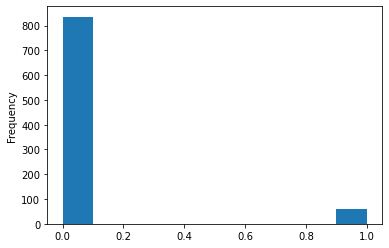

In [538]:
fraud_category(df_train,['is_fraud','city'],"Plot",1)['Percentage over total # of Transactions'].plot(kind='hist')

In [366]:
fraud_city=fraud_category(df_train,['is_fraud','city'],"Yes",1)

From the plot and table above, it appears that there are several city addresses that perpetuate to a 100% fraudulent transaction rate. To observe this on a smaller scope, I will create a list of the cities associated with 100% fraud transaction.

In [535]:
len(fraud_city)

58

It appears that there are 58 city addresses which the transaction conducted by stakeholders in those cities are 100% fraud. 

In [367]:
df_train[df_train["classifier_1"]==0][df_train[df_train["classifier_1"]==0]['city'].isin(fraud_city)]

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,average_trf,greater than average_trf,amt per average,date,lat-long,option_1,option_2,classifier_1,classifier_2,Full Name


In [368]:
df_train[df_train["classifier_2"]==0][df_train[df_train["classifier_2"]==0]['city'].isin(fraud_city)]

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,average_trf,greater than average_trf,amt per average,date,lat-long,option_1,option_2,classifier_1,classifier_2,Full Name


Upon subsetting the data based on street that contibutes 100% to fraud transaction, it appears that this small subset is already catered by the fraud_cc list, so I don't need to add anymore parameter based on the street columns.

## State

Now, I will analyze the state address column.

In [369]:
fraud_category(df_train,['is_fraud','state'],"No",1)

,is_fraud,state,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
59,1,DE,9,100.00%,0.12%,0.000000
90,1,RI,15,2.73%,0.20%,35.666667
51,1,AK,36,1.70%,0.48%,57.888889
84,1,NV,47,0.84%,0.63%,118.297872
56,1,CO,113,0.81%,1.51%,121.831858
88,1,OR,149,0.80%,1.99%,123.812081
93,1,TN,140,0.80%,1.87%,124.385714
80,1,NE,180,0.74%,2.40%,133.266667
72,1,ME,119,0.72%,1.59%,137.697479
81,1,NH,59,0.71%,0.79%,139.305085


In [370]:
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI",
}
    
# invert the dictionary
abbrev_to_us_state = dict(map(reversed, us_state_to_abbrev.items()))

In [371]:
df_train['state_fullname']=df_train['state'].map(abbrev_to_us_state)

In [372]:
fraud_category(df_train[df_train["classifier_1"]==0],['is_fraud','state_fullname'],"No",1)

,is_fraud,state_fullname,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
51,1,Alaska,5,0.24%,0.40%,415.400000
90,1,Rhode Island,1,0.19%,0.08%,529.000000
95,1,Utah,18,0.17%,1.45%,586.833333
100,1,West Virginia,39,0.15%,3.14%,649.794872
67,1,Kansas,34,0.15%,2.73%,666.735294
93,1,Tennessee,24,0.14%,1.93%,719.791667
60,1,Florida,58,0.14%,4.66%,724.741379
101,1,Wyoming,26,0.14%,2.09%,733.576923
88,1,Oregon,25,0.14%,2.01%,734.560000
91,1,South Carolina,39,0.14%,3.14%,738.025641


In [373]:
fraud_category(df_train[df_train["classifier_2"]==0],['is_fraud','state_fullname'],"No",1)

,is_fraud,state_fullname,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
51,1,Alaska,4,0.20%,0.37%,510.250000
90,1,Rhode Island,1,0.19%,0.09%,524.000000
95,1,Utah,15,0.14%,1.40%,689.666667
67,1,Kansas,29,0.13%,2.71%,764.137931
100,1,West Virginia,31,0.12%,2.89%,799.580645
60,1,Florida,51,0.12%,4.76%,804.647059
101,1,Wyoming,23,0.12%,2.15%,810.086957
91,1,South Carolina,32,0.11%,2.99%,884.375000
88,1,Oregon,20,0.11%,1.87%,898.850000
65,1,Illinois,46,0.11%,4.30%,908.978261


From the results above, it is clear that the state location cannot be used as a parameter. As each state only contributes to 0.4% transaction at most, it is apparent that the state column cannot be used to improve the detection rate of the classifier 1 and classifier 2.

## City population

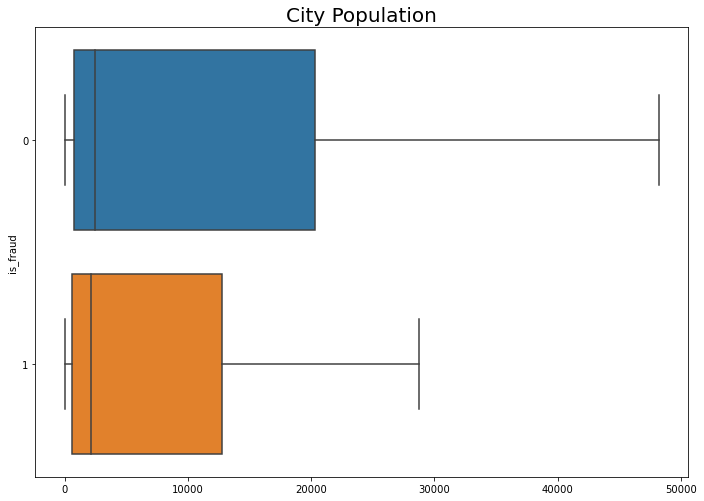

In [374]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(x='city_pop',y='is_fraud',data=df_train[df_train["classifier_1"]==0],showfliers=False)
ax.set_xlabel('')
plt.title('City Population',fontsize=20)
plt.show()

In [378]:
threshold(df_train[df_train['classifier_2']==0],">",0,50000,500,'city_pop')


,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,1.000000,1071,1252355,1169.332400,0.000854
1,500,0.796452,853,1029478,1206.890973,0.000828
2,1000,0.678805,727,866530,1191.925722,0.000838
3,1500,0.603175,646,773363,1197.156347,0.000835
4,2000,0.521008,558,673796,1207.519713,0.000827
...,...,...,...,...,...,...
95,47500,0.177404,190,236364,1244.021053,0.000803
96,48000,0.176471,189,234855,1242.619048,0.000804
97,48500,0.176471,189,233336,1234.582011,0.000809
98,49000,0.176471,189,233336,1234.582011,0.000809


In [379]:
threshold(df_train[df_train['classifier_2']==0],"<",0,50000,500,'city_pop')


,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
0,0,0.000000,0,0,NaN,NaN
1,500,0.203548,218,222877,1022.371560,0.000977
2,1000,0.321195,344,385825,1121.584302,0.000891
3,1500,0.396825,425,478992,1127.040000,0.000886
4,2000,0.478992,513,578559,1127.795322,0.000886
...,...,...,...,...,...,...
95,47500,0.822596,881,1015991,1153.224745,0.000866
96,48000,0.823529,882,1017500,1153.628118,0.000866
97,48500,0.823529,882,1019019,1155.350340,0.000865
98,49000,0.823529,882,1019019,1155.350340,0.000865


From the city population column, we can see that there is no apparent threshold which gives a good fraud deetction rate with a genuine to fraud transaction ratio that is below 10. Thus, I will not be using city population as the parameter for fraud classification.

## Job

In [380]:
fraud_category(df_train[df_train["classifier_1"]==0],['is_fraud','job'],"No",1)

,is_fraud,job,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
987,1,Writer,10,2.04%,0.80%,48.000000
704,1,"Geneticist, molecular",10,1.88%,0.80%,52.100000
592,1,Community development worker,7,1.35%,0.56%,72.857143
943,1,"Teacher, adult education",6,1.19%,0.48%,83.166667
612,1,Data scientist,6,1.18%,0.48%,83.833333
670,1,English as a foreign language teacher,5,1.02%,0.40%,96.600000
577,1,Civil Service administrator,4,0.81%,0.32%,122.500000
942,1,"Teacher, English as a foreign language",8,0.81%,0.64%,122.625000
638,1,"Education officer, community",4,0.79%,0.32%,125.250000
662,1,"Engineer, materials",4,0.78%,0.32%,127.250000


In [381]:
fraud_category(df_train[df_train["classifier_2"]==0],['is_fraud','job'],"No",1)

,is_fraud,job,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
704,1,"Geneticist, molecular",10,1.94%,0.93%,50.500000
987,1,Writer,9,1.91%,0.84%,51.444444
592,1,Community development worker,6,1.21%,0.56%,81.500000
670,1,English as a foreign language teacher,5,1.04%,0.47%,95.000000
577,1,Civil Service administrator,4,0.84%,0.37%,118.000000
789,1,"Merchandiser, retail",4,0.81%,0.37%,122.750000
777,1,Manufacturing systems engineer,7,0.75%,0.65%,132.000000
942,1,"Teacher, English as a foreign language",7,0.73%,0.65%,135.428571
972,1,Training and development officer,9,0.61%,0.84%,161.777778
599,1,"Conservator, museum/gallery",3,0.61%,0.28%,162.333333


By the job column, it appears that for clasifier 1 and classifier 2, there is no particular job that could add as a fraud classifier parameter.

## Gender

In [382]:
fraud_category(df_train[df_train["classifier_2"]==0],['is_fraud','gender'],"No",1)

,is_fraud,gender,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
2,1,F,788,0.11%,73.58%,868.737310
3,1,M,283,0.05%,26.42%,2006.325088


In [383]:
fraud_category(df_train[df_train["classifier_1"]==0],['is_fraud','gender'],"No",1)

,is_fraud,gender,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
2,1,F,911,0.13%,73.23%,768.405049
3,1,M,333,0.06%,26.77%,1742.402402


By the gender column, it appears that for clasifier 1 and classifier 2, there is no particular gender that could add as a fraud classifier parameter.

## DOB

In [384]:
from datetime import date

def calculate_age(born):
    today = date.today()
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))

In [385]:
df_train['Age']=df_train['dob'].apply(calculate_age)

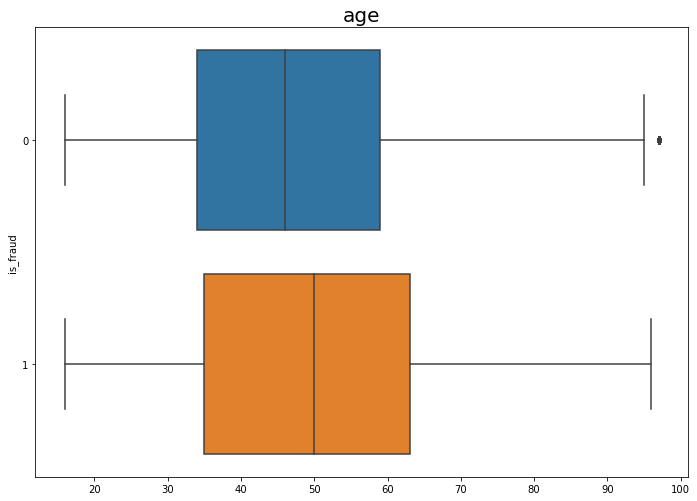

In [386]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(x='Age',y='is_fraud',data=df_train)
ax.set_xlabel('')
plt.title('age',fontsize=20)
plt.show()

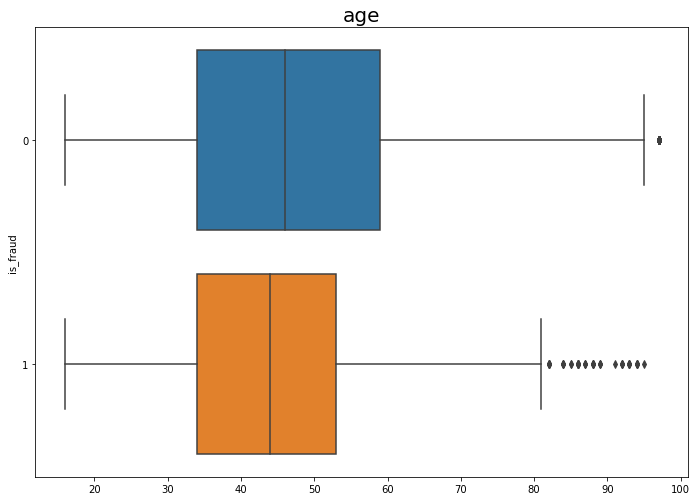

In [387]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(x='Age',y='is_fraud',data=df_train[df_train["classifier_2"]==0])
ax.set_xlabel('')
plt.title('age',fontsize=20)
plt.show()

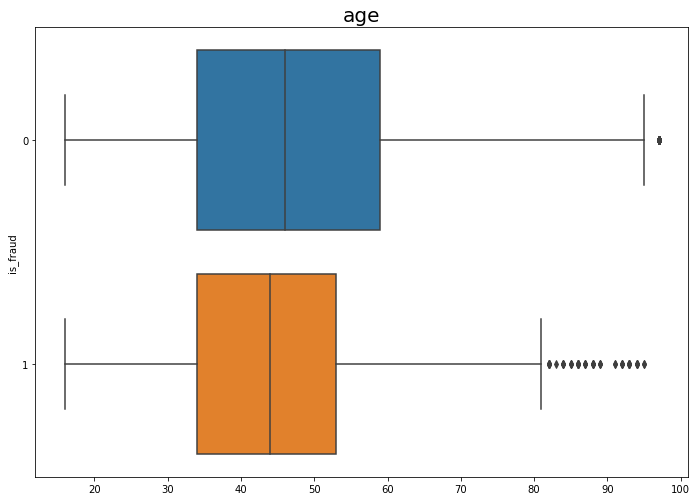

In [388]:
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
graph_1=sns.boxplot(x='Age',y='is_fraud',data=df_train[df_train["classifier_1"]==0])
ax.set_xlabel('')
plt.title('age',fontsize=20)
plt.show()

In [389]:
threshold(df_train[df_train['classifier_1']==0],"<",0,100,1,'Age')


,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
36,36,0.324759,404,357448,884.772277,0.001129
37,37,0.351286,437,390816,894.315789,0.001117
52,52,0.736334,916,821511,896.846070,0.001114
51,51,0.707395,880,797654,906.425000,0.001102
53,53,0.743569,925,841699,909.944865,0.001098
39,39,0.404341,503,458138,910.811133,0.001097
55,55,0.773312,962,881723,916.551975,0.001090
54,54,0.754019,938,859888,916.724947,0.001090
46,46,0.549035,683,626674,917.531479,0.001089
41,41,0.436495,543,498269,917.622468,0.001089


In [390]:
threshold(df_train[df_train['classifier_1']==0],">",0,100,1,'Age')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
25,25,0.969453,1206,1186104,983.502488,0.001016
27,27,0.934084,1162,1145626,985.908778,0.001013
24,24,0.971865,1209,1193403,987.099256,0.001012
26,26,0.948553,1180,1165405,987.631356,0.001011
23,23,0.979904,1219,1220667,1001.367514,0.000998
28,28,0.893891,1112,1116778,1004.296763,0.000995
22,22,0.983119,1223,1233685,1008.736713,0.000990
21,21,0.987942,1229,1252233,1018.903987,0.000980
29,29,0.867363,1079,1101664,1021.004634,0.000978
18,18,0.992765,1235,1267049,1025.950607,0.000974


In [391]:
threshold(df_train[df_train['classifier_2']==0],"<",0,100,1,'Age')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
52,52,0.735761,788,801723,1017.414975,0.000982
53,53,0.742297,795,821552,1033.398742,0.000967
51,51,0.702148,752,778455,1035.179521,0.000965
55,55,0.771242,826,860867,1042.211864,0.000959
54,54,0.751634,805,839390,1042.720497,0.000958
36,36,0.311858,334,349339,1045.925150,0.000955
37,37,0.338936,363,381968,1052.253444,0.000949
56,56,0.779645,835,882919,1057.388024,0.000945
50,50,0.660131,707,748102,1058.135785,0.000944
39,39,0.393091,421,447520,1062.992874,0.000940


In [392]:
threshold(df_train[df_train['classifier_2']==0],">",0,100,1,'Age')

,Threshold,Fraud Detection Rate,Number of Fraud,Number of Genuine Transaction,Genuine to Fraud Transaction Ratio,Fraud Transaction/Total Transaction
27,27,0.940243,1007,1120189,1112.402185,0.000898
26,26,0.954248,1022,1139487,1114.957926,0.000896
25,25,0.969188,1038,1159863,1117.401734,0.000894
24,24,0.971055,1040,1167003,1122.118269,0.000890
28,28,0.895425,959,1092162,1138.855057,0.000877
23,23,0.978525,1048,1193817,1139.138359,0.000877
22,22,0.981326,1051,1206618,1148.066603,0.000870
21,21,0.985994,1056,1224855,1159.900568,0.000861
29,29,0.865546,927,1077557,1162.413161,0.000860
18,18,0.991597,1062,1239398,1167.041431,0.000856


By the Age of the credit card holder, there is also no threshold that could be added as a fraud detection parameter in order to improve the detection rate of the classifiers.

## Zip

Despite having a numerical value, zip code is a categorical variable, Therefore, I will try to use the zip column to improve the detection rate of classifier 1 and classifier 2.

In [539]:
fraud_category(df_train[df_train["classifier_2"]==0],['is_fraud','zip'],"No",1)

,is_fraud,zip,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
970,1,11955,10,2.07%,0.93%,47.200000
1195,1,33760,10,1.94%,0.93%,50.500000
1351,1,48193,9,1.91%,0.84%,51.444444
1113,1,24986,6,1.21%,0.56%,81.500000
1432,1,56117,6,1.19%,0.56%,83.333333
1465,1,59632,5,1.05%,0.47%,94.000000
1491,1,62661,5,1.04%,0.47%,95.000000
1740,1,92648,5,1.04%,0.47%,95.600000
1023,1,15458,5,1.02%,0.47%,97.000000
1768,1,97107,5,1.01%,0.47%,97.800000


In [540]:
fraud_category(df_train[df_train["classifier_1"]==0],['is_fraud','zip'],"No",1)

,is_fraud,zip,Counts,Percentage over total # of Transactions,Detection Rate,Genuine to Fraud Alert Ratio
970,1,11955,12,2.43%,0.96%,40.166667
1351,1,48193,10,2.04%,0.80%,48.000000
1195,1,33760,10,1.88%,0.80%,52.100000
1768,1,97107,8,1.59%,0.64%,61.750000
1023,1,15458,7,1.40%,0.56%,70.571429
1432,1,56117,7,1.36%,0.56%,72.428571
1113,1,24986,7,1.35%,0.56%,72.857143
1762,1,96136,6,1.19%,0.48%,83.166667
1433,1,56138,6,1.18%,0.48%,83.833333
1239,1,37138,6,1.15%,0.48%,85.666667


As can be seen for both the classifiers, there is no zipcode that can be used as an additional fraud detection rule for classifier 1 and classifier 2 a single zip code contributes fraud transaction that is less than 1% of the total number of transaction in that zipcode. Aside from that, none of the Genuine to Fraud Alert Ratio is equal to or less than 10.

# Final verdict : Traditional Parameter Approach

In [393]:
df_sum

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
Classifier 1,83.43 %,1.43
Classifier 2,85.73 %,5.72


As can be seen from the results above, there are two possible scenarios, where with detection rate of the second classifier is higher than classifier 1, the genuine to fraudulent transaction alert ratio also exceeds the classifier 1, we cans see that there is an apparent trade off between detection rate and genuine to fraud alert transaction ratio.

# Machine Learning Approach

In this section , I will attempt to automate all the processes that I have done in the previous step by machine learning. The library that I would be using today is called H2o. It's an autoML library that attempts to achieve the best performance by iterating over 6 different types of classifiers and finding the best performance and displayig it all in a leaderboard. H2o is also able to automate data preprocessing such as handling missing datas and category encoding without manually doing so. The reason why I decided to use automl is due to the simplicity and the convenience without actuallly manually tuning each model 1-1. 

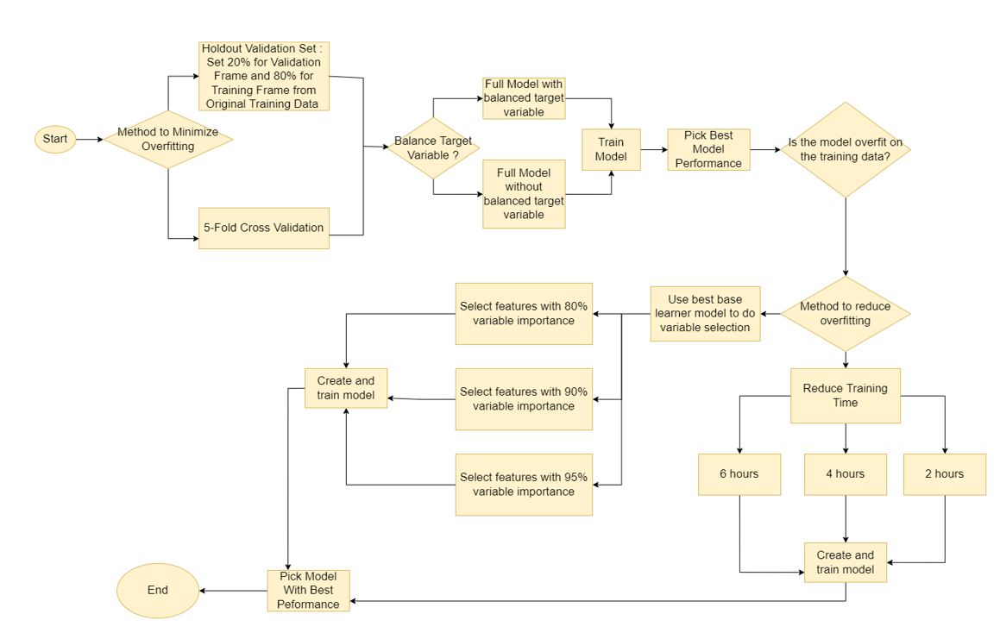

For the training process of the H2o model, I will run it in kaggle for convenience and speed.

In [394]:
df_train_2=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\Data alternatif\fraudTrain.csv")

In [395]:
df_test_2=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\Data alternatif\fraudTest.csv")

To create a smoother pipeline I created a function below in order to process the raw data instantly.

In [396]:
def wrangle(data):
    data.drop(['Unnamed: 0'],axis=1,inplace=True)
    data.drop(['trans_num','unix_time'],axis=1,inplace=True)
    data['trans_date_trans_time']=data['trans_date_trans_time'].astype('datetime64[ns]')
    data['dob']=data['dob'].astype('datetime64[ns]')
    data[['cc_num', 'merchant', 'category','first', 'zip','last', 'gender', 'street', 'city', 'state','job','is_fraud']]=data[['cc_num', 'merchant', 'category','first', 'zip','last', 'gender', 'street', 'city', 'state','job','is_fraud']].astype('category')
    coords = tuple(zip(data['merch_lat'], data['merch_long']))
    results_rg = rg.search(coords)
    results_cc = [x.get('cc') for x in results_rg]
    results_count=[country_flag(a) for a in results_cc]
    data['merchant_country'] = results_count
    coords2 = tuple(zip(data['lat'], data['long']))
    results_rg2 = rg.search(coords2)
    results_cc2 = [x.get('cc') for x in results_rg2]
    results_count2=[country_flag(a) for a in results_cc2]
    data['cc_holder_country'] = results_count2
    results_admin1 = [x.get('admin1') for x in results_rg]
    data['merchant_admin1'] = results_admin1
    results_admin2 = [x.get('admin1') for x in results_rg2]
    data['cc_holder_admin1'] = results_admin2
    results_admin3 = [x.get('admin2') for x in results_rg]
    data['merchant_admin2'] = results_admin3
    results_admin4 = [x.get('admin2') for x in results_rg2]
    data['cc_holder_admin2'] = results_admin4
    data['distance']=data.apply(distance,axis=1)
    data['day']=data['trans_date_trans_time'].dt.strftime('%A')
    data['hour']=data['trans_date_trans_time'].dt.hour
    data['time category']=data['hour'].apply(time_category)
    data['Full Name']=data['first'].astype(str)+" "+data['last'].astype(str)
    data['Age']=data['dob'].apply(calculate_age)
    data['merchant']=data['merchant'].str.replace("fraud_","")
    data.drop(['trans_date_trans_time','dob'],axis=1,inplace=True)
    data.drop(['city_pop','first','last'],axis=1,inplace=True)

    return print("done")

In [397]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.281-b09, mixed mode)
  Starting server from C:\Users\MADELEINE\anaconda3\envs\IDC\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\MADELE~1\AppData\Local\Temp\tmpl57j0wsc
  JVM stdout: C:\Users\MADELE~1\AppData\Local\Temp\tmpl57j0wsc\h2o_MADELEINE_started_from_python.out
  JVM stderr: C:\Users\MADELE~1\AppData\Local\Temp\tmpl57j0wsc\h2o_MADELEINE_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Asia/Bangkok
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.3
H2O_cluster_version_age:,3 months and 6 days
H2O_cluster_name:,H2O_from_python_MADELEINE_14muxc
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.754 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [398]:
# df_train_2=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\train_data_revision3.csv")
# df_test_2=pd.read_csv(r"C:\Users\MADELEINE\Desktop\FP frm\test_data_revision3.csv")
wrangle(df_train_2)
wrangle(df_test_2)


done
done


To create the machine learning model, I will use the columns below : 

In [399]:
df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 27 columns):
 #   Column             Non-Null Count    Dtype   
---  ------             --------------    -----   
 0   cc_num             1296675 non-null  category
 1   merchant           1296675 non-null  object  
 2   category           1296675 non-null  category
 3   amt                1296675 non-null  float64 
 4   gender             1296675 non-null  category
 5   street             1296675 non-null  category
 6   city               1296675 non-null  category
 7   state              1296675 non-null  category
 8   zip                1296675 non-null  category
 9   lat                1296675 non-null  float64 
 10  long               1296675 non-null  float64 
 11  job                1296675 non-null  category
 12  merch_lat          1296675 non-null  float64 
 13  merch_long         1296675 non-null  float64 
 14  is_fraud           1296675 non-null  category
 15  merchant_countr

In [400]:
df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 27 columns):
 #   Column             Non-Null Count    Dtype   
---  ------             --------------    -----   
 0   cc_num             1296675 non-null  category
 1   merchant           1296675 non-null  object  
 2   category           1296675 non-null  category
 3   amt                1296675 non-null  float64 
 4   gender             1296675 non-null  category
 5   street             1296675 non-null  category
 6   city               1296675 non-null  category
 7   state              1296675 non-null  category
 8   zip                1296675 non-null  category
 9   lat                1296675 non-null  float64 
 10  long               1296675 non-null  float64 
 11  job                1296675 non-null  category
 12  merch_lat          1296675 non-null  float64 
 13  merch_long         1296675 non-null  float64 
 14  is_fraud           1296675 non-null  category
 15  merchant_countr

## Convert Data to H2oFrame

In [401]:
df_trainH2o=h2o.H2OFrame(df_train_2)
df_testH2o=h2o.H2OFrame(df_test_2)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [402]:
cat_col=['cc_num', 'merchant', 'category', 'gender', 'street',
       'city', 'state', 'zip', 'job', 'is_fraud', 'merchant_country',
       'cc_holder_country', 'merchant_admin1', 'cc_holder_admin1',
       'merchant_admin2', 'cc_holder_admin2', 'time category', 'Full Name']

In [403]:
df_trainH2o[cat_col]=df_trainH2o[cat_col].asfactor()
df_testH2o[cat_col]=df_testH2o[cat_col].asfactor()

In [404]:
df_trainH2o.summary()

,cc_num,merchant,category,amt,gender,street,city,state,zip,lat,long,job,merch_lat,merch_long,is_fraud,merchant_country,cc_holder_country,merchant_admin1,cc_holder_admin1,merchant_admin2,cc_holder_admin2,distance,day,hour,time category,Full Name,Age
type,enum,enum,enum,real,enum,enum,enum,enum,enum,real,real,enum,real,real,enum,enum,enum,enum,enum,enum,enum,real,enum,int,enum,enum,int
mins,,,,1.0,,,,,,20.0271,-165.6723,,19.027785,-166.671242,,,,,,,,0.022254546377779863,,0.0,,,16.0
mean,,,,70.35103545607032,,,,,,38.53762161489964,-90.22633537864152,,38.53733804469972,-90.22646479897278,,,,,,,,76.11475573798472,,12.80485780939711,,,47.77958162222609
maxs,,,,28948.9,,,,,,66.6933,-67.9503,,67.510267,-66.950902,,,,,,,,152.11738321913873,,23.0,,,97.0
sigma,,,,160.3160385715277,,,,,,5.075808438803934,13.759076946486312,,5.109788369679178,13.771090564792418,,,,,,,,29.11697472930103,,6.81782389918719,,,17.386396691008127
zeros,,,,0,,,,,,0,0,,0,0,,,,,,,,0,,42502,,,0
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,2703186189652095,"Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,"Psychologist, counselling",36.011293,-82.048315,0,United States,United States,North Carolina,North Carolina,Mitchell County,Wilkes County,78.59767705181604,Tuesday,0.0,Early Morning,Jennifer Banks,33.0
1,630423337322,"Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,Special educational needs teacher,49.159047,-118.186462,0,Canada,Canada,British Columbia,British Columbia,,,30.2122174500456,Tuesday,0.0,Early Morning,Stephanie Gill,43.0
2,38859492057661,Lind-Buckridge,entertainment,220.11,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.262,Nature conservation officer,43.150704,-112.154481,0,United States,United States,Idaho,Idaho,Bingham County,Oneida County,108.20623204780762,Tuesday,0.0,Early Morning,Edward Sanchez,59.0


## Performance Recap 

In [405]:
Summary=pd.read_csv(r'C:\Users\MADELEINE\Desktop\FP frm\Summary.csv')

In [406]:
Summary=Summary.drop('Unnamed: 0',axis=1)

In [407]:
Summary["Model"]=['Balanced Target Variable With Validation Frame',
                  'Balanced Target Variable With Validation Frame',
                 'Unbalanced Target Variable With Validation Frame',
                   'Unbalanced Target Variable With Validation Frame',
                 'Balanced Target Variable With 5 Fold Cross Validation',
                'Balanced Target Variable With 5 Fold Cross Validation',
                  'Unbalanced Target Variable With 5 Fold Cross Validation',
                  'Unbalanced Target Variable With 5 Fold Cross Validation']

In [408]:
Summary=Summary[['Model','Detection Rate','Genuine to Fraudulent Transaction Alert Ratio','Data']]

In [409]:
pd.set_option('display.width', 1600)


In [410]:
Summary[Summary.Data=="Test Data"].sort_values(by='Detection Rate',ascending=False)

,Model,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
3,Unbalanced Target Variable With Validation Frame,75.90 %,0.135,Test Data
1,Balanced Target Variable With Validation Frame,75.48 %,0.133,Test Data
5,Balanced Target Variable With 5 Fold Cross Val...,74.97 %,0.124,Test Data
7,Unbalanced Target Variable With 5 Fold Cross V...,74.13 %,0.129,Test Data


From the genuine to fraudulent transaction alert ratio in testing data, I will choose the full unbalanced data with validation frame which gives the highest detection rate.

In [411]:
Summary

,Model,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
0,Balanced Target Variable With Validation Frame,90.95 %,0.038,Train Data
1,Balanced Target Variable With Validation Frame,75.48 %,0.133,Test Data
2,Unbalanced Target Variable With Validation Frame,90.49 %,0.036,Train Data
3,Unbalanced Target Variable With Validation Frame,75.90 %,0.135,Test Data
4,Balanced Target Variable With 5 Fold Cross Val...,92.17 %,0.029,Train Data
5,Balanced Target Variable With 5 Fold Cross Val...,74.97 %,0.124,Test Data
6,Unbalanced Target Variable With 5 Fold Cross V...,91.03 %,0.032,Train Data
7,Unbalanced Target Variable With 5 Fold Cross V...,74.13 %,0.129,Test Data


However since the model is overfit, I will do variable selection and reduce training time in in an effort to reduce the overfitting.

# Chosen Model : Full Data With Validation Frame

In [412]:
lb = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Full Unbalanced Data\aml_leaderboard.h2o")
lb.head(rows=10)


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_2_AutoML_1_20220102_91033,0.998179,0.00473161,0.926653,0.0893163,0.0334841,0.00112118
StackedEnsemble_BestOfFamily_4_AutoML_1_20220102_91033,0.998024,0.00482878,0.925562,0.0835513,0.0334856,0.00112128
StackedEnsemble_BestOfFamily_3_AutoML_1_20220102_91033,0.998009,0.00484748,0.923428,0.0915649,0.0338343,0.00114476
XGBoost_3_AutoML_1_20220102_91033,0.997885,0.00498215,0.920123,0.0928912,0.0341984,0.00116953
StackedEnsemble_AllModels_1_AutoML_1_20220102_91033,0.997754,0.00493911,0.923058,0.0935568,0.0340855,0.00116182
XGBoost_grid_1_AutoML_1_20220102_91033_model_1,0.997508,0.00501342,0.92043,0.0924907,0.0342577,0.00117359
StackedEnsemble_BestOfFamily_2_AutoML_1_20220102_91033,0.997468,0.00501975,0.921363,0.0937355,0.0342345,0.001172
XGBoost_2_AutoML_1_20220102_91033,0.997278,0.00522258,0.915999,0.0978639,0.0347724,0.00120912
XGBoost_grid_1_AutoML_1_20220102_91033_model_2,0.997154,0.00544515,0.910571,0.0983202,0.0355545,0.00126412
StackedEnsemble_BestOfFamily_1_AutoML_1_20220102_91033,0.99715,0.00530167,0.914127,0.10333,0.0351665,0.00123668


In [413]:
best_model02 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Full Unbalanced Data\StackedEnsemble_AllModels_2_AutoML_1_20220102_91033")

In [414]:
data_pred3 = h2o.as_list(best_model02.predict(df_trainH2o)["predict"], use_pandas=True)
data_pred4 = h2o.as_list(best_model02.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [415]:
fraud_metrics(df_train_2['is_fraud'],data_pred3['predict'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,90.50 %,0.04


In [416]:
fraud_metrics(df_test_2['is_fraud'],data_pred4['predict'])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,75.90 %,0.13


In [417]:
df_unbalanced=pd.concat([fraud_metrics(df_train_2['is_fraud'],data_pred3['predict']),fraud_metrics(df_test_2['is_fraud'],data_pred4['predict'])])

In [418]:
df_unbalanced.index=['Full Data with Unbalanced Classes','Full Data with Unbalanced Classes']
df_unbalanced['Data']=['Training Data','Testing Data']

In [419]:
df_unbalanced

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Full Data with Unbalanced Classes,90.50 %,0.04,Training Data
Full Data with Unbalanced Classes,75.90 %,0.13,Testing Data


To reduce the overfitting, I will take on two approaches which are model training runtime reduction and also feature selection.

## Feature Selection

"The AutoML Stacked Ensembles use the GLM with non-negative weights as the default metalearner (combiner) algorithm. Let's examine the variable importance of the metalearner algorithm in the ensemble. This shows us how much each base learner is contributing to the ensemble. Intercept represents the constant term in a linear model."
Source : https://www.kaggle.com/paradiselost/tutorial-automl-capabilities-of-h2o-library

Thus, I will display the plot which display the importance of each base learner in a glm coeffiecient below :

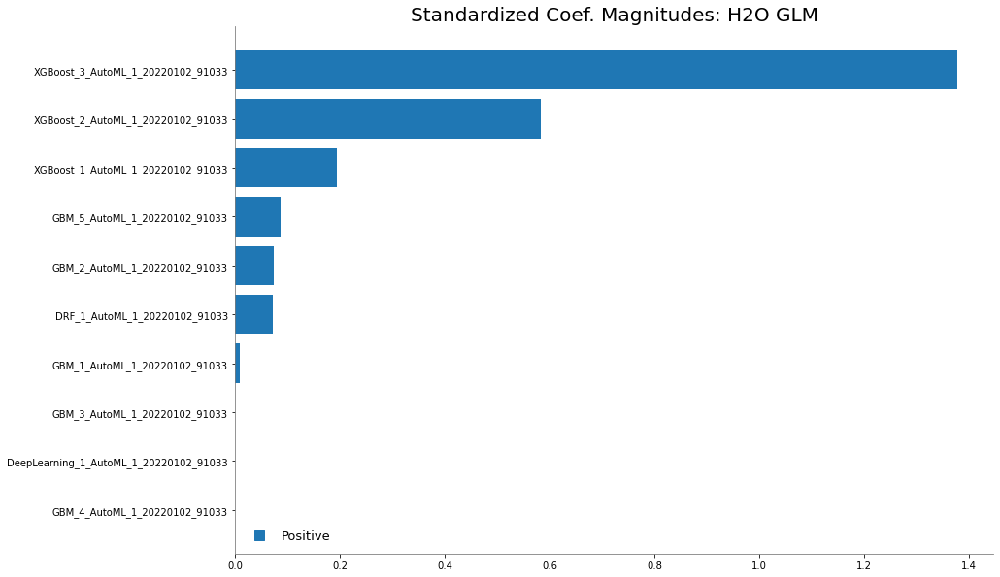

In [420]:
metalearner = h2o.get_model(best_model02.metalearner().model_id)

%matplotlib inline
metalearner.std_coef_plot(num_of_features=10)
#metalearner.coef_norm()

As we can see, the model XGBoost_3_AutoML_1_20220102_91033 contributes the most. Thus, I will use this model to do variable selection based on variable importance of the XGBoost_3_AutoML_1_20220102_91033 model.

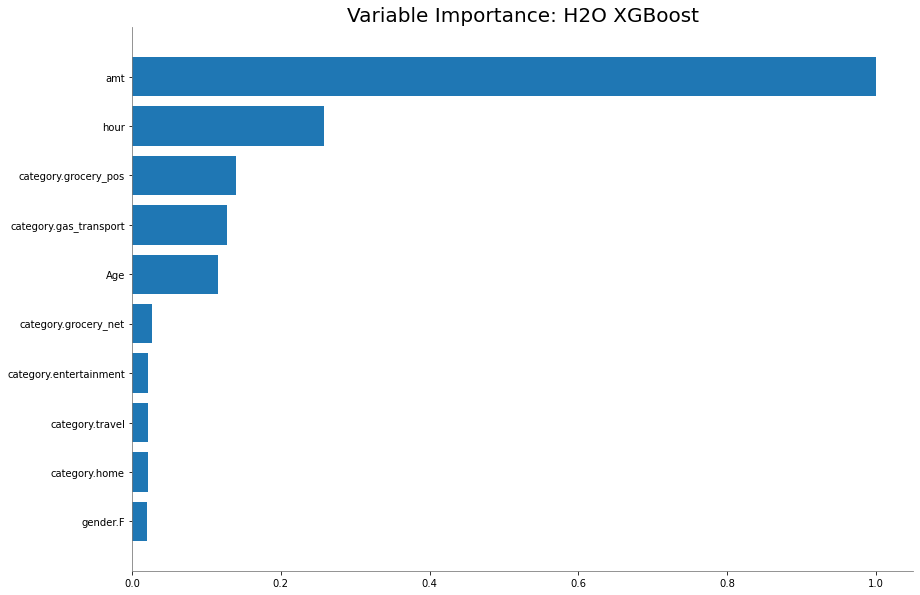

In [422]:
model_01 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Full Unbalanced Data\XGBoost_3_AutoML_1_20220102_91033")

model_01.varimp_plot()

Since XGBoost is a tree based model, The variable importances are computed from the gains of their respective loss functions during tree construction. As we can see, most of the important features are already inferred during the EDA process which are the amt and category columns. However, it is pretty surprising that the variable importance of  hour, age and gender: Female is pretty high as well. This shows that there are some patterns machine learning models can capture better than humans.

As can be seen from the flowchart in the beginning of the machin learning model, the variables are chosen based on how much they contribute to the variable importance.

In [423]:
def get_top(thresh,model):
    list_var=list()
    thresh=thresh/100
    rel_imp=model.varimp(True)
    rel_imp['relative_importance_cummulative']=model.varimp(True)['percentage'].cumsum()
    list_var=list()
    for lis in list(rel_imp.head(rel_imp[rel_imp['relative_importance_cummulative']>=thresh].head(1).index[0])['variable'].str.split('.')):
        list_var.append(lis[0])
    list_var=list(set(list_var))
    return list_var

In [424]:
top_80=get_top(80,model_01)
top_90=get_top(90,model_01)
top_95=get_top(95,model_01)

### Top 95%

In [425]:
top_95

['gender',
 'hour',
 'time category',
 'merch_long',
 'amt',
 'distance',
 'long',
 'merch_lat',
 'Age',
 'lat',
 'category']

In [426]:
lb2 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 95\aml_leaderboard.h2o")

lb2.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_3_AutoML_1_20220102_185502,0.998302,0.00463669,0.929175,0.0928073,0.0332423,0.00110505
StackedEnsemble_AllModels_2_AutoML_1_20220102_185502,0.998263,0.00464521,0.928351,0.087789,0.0333415,0.00111166
StackedEnsemble_BestOfFamily_3_AutoML_1_20220102_185502,0.998206,0.00467908,0.927201,0.0882005,0.0334458,0.00111862
StackedEnsemble_BestOfFamily_4_AutoML_1_20220102_185502,0.998204,0.00468082,0.927123,0.0895193,0.0334572,0.00111938
StackedEnsemble_AllModels_1_AutoML_1_20220102_185502,0.998038,0.00476513,0.926406,0.0942193,0.0336048,0.00112928
XGBoost_3_AutoML_1_20220102_185502,0.997967,0.00490493,0.92241,0.0924263,0.0341033,0.00116304
XGBoost_grid_1_AutoML_1_20220102_185502_model_3,0.997811,0.00499072,0.920781,0.093111,0.0343838,0.00118225
XGBoost_grid_1_AutoML_1_20220102_185502_model_1,0.997726,0.00498095,0.921298,0.0929217,0.0342783,0.001175
StackedEnsemble_BestOfFamily_2_AutoML_1_20220102_185502,0.997653,0.00487872,0.923314,0.0885556,0.0339573,0.0011531
XGBoost_grid_1_AutoML_1_20220102_185502_model_2,0.997565,0.00532028,0.913312,0.103558,0.0355359,0.0012628


In [427]:
model_02=h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 95\StackedEnsemble_AllModels_3_AutoML_1_20220102_185502")

In [428]:
data_pred3 = h2o.as_list(model_02.predict(df_trainH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [429]:
data_pred6 = h2o.as_list(model_02.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [430]:
df_95=pd.concat([fraud_metrics(df_train['is_fraud'],data_pred3['predict']),fraud_metrics(df_test['is_fraud'],data_pred6['predict'])])

In [431]:
df_95.index=['95% of Variable Importance','95% of Variable Importance']
df_95['Data']=['Training Data','Testing Data']

In [432]:
df_95

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
95% of Variable Importance,87.04 %,0.02,Training Data
95% of Variable Importance,77.58 %,0.09,Testing Data


### Top 90%

In [433]:
top_90

['gender', 'hour', 'amt', 'merch_lat', 'Age', 'category']

In [434]:
lb3 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 90\aml_leaderboard.h2o")

lb3.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_3_AutoML_1_20220102_185811,0.998333,0.0046798,0.926343,0.0903073,0.0336168,0.00113009
StackedEnsemble_AllModels_2_AutoML_1_20220102_185811,0.998256,0.00472361,0.925286,0.0885646,0.033695,0.00113535
StackedEnsemble_BestOfFamily_3_AutoML_1_20220102_185811,0.99812,0.00474573,0.924795,0.0860871,0.0337546,0.00113937
XGBoost_3_AutoML_1_20220102_185811,0.998062,0.00485131,0.921895,0.0909872,0.0340904,0.00116216
XGBoost_grid_1_AutoML_1_20220102_185811_model_3,0.998031,0.00485414,0.922255,0.0976335,0.0341177,0.00116402
StackedEnsemble_AllModels_1_AutoML_1_20220102_185811,0.998021,0.00482938,0.923508,0.0899006,0.033936,0.00115165
XGBoost_grid_1_AutoML_1_20220102_185811_model_1,0.997962,0.00488495,0.921818,0.0958888,0.0341748,0.00116792
StackedEnsemble_BestOfFamily_2_AutoML_1_20220102_185811,0.997884,0.00485355,0.923089,0.0942985,0.0339456,0.0011523
StackedEnsemble_BestOfFamily_1_AutoML_1_20220102_185811,0.997856,0.00512763,0.916265,0.0928581,0.0350337,0.00122736
XGBoost_grid_1_AutoML_1_20220102_185811_model_2,0.997801,0.00509577,0.917006,0.0922781,0.0348717,0.00121603


In [435]:
model_03 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 90\StackedEnsemble_AllModels_3_AutoML_1_20220102_185811")

In [436]:
data_predl = h2o.as_list(model_03.predict(df_trainH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [437]:
data_pred5 = h2o.as_list(model_03.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [438]:
df_90=pd.concat([fraud_metrics(df_train['is_fraud'],data_predl['predict']),fraud_metrics(df_test['is_fraud'],data_pred5['predict'])])

In [439]:
df_90.index=['90% of Variable Importance','90% of Variable Importance']
df_90['Data']=['Training Data','Testing Data']

In [440]:
df_90

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
90% of Variable Importance,84.59 %,0.03,Training Data
90% of Variable Importance,78.83 %,0.10,Testing Data


### Top 80%

In [441]:
top_80

['amt', 'category', 'hour']

In [442]:
lb4 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 80\aml_leaderboard.h2o")

lb4.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
XGBoost_grid_1_AutoML_1_20220102_183600_model_5,0.997395,0.00676704,0.866461,0.124024,0.0414851,0.00172101
StackedEnsemble_BestOfFamily_4_AutoML_1_20220102_183600,0.997391,0.00676739,0.86656,0.123696,0.041491,0.00172151
StackedEnsemble_AllModels_3_AutoML_1_20220102_183600,0.997286,0.0068472,0.865898,0.123201,0.0415452,0.00172601
XGBoost_3_AutoML_1_20220102_183600,0.997194,0.00686909,0.864338,0.122304,0.0416686,0.00173627
StackedEnsemble_BestOfFamily_3_AutoML_1_20220102_183600,0.997182,0.00686382,0.864788,0.122303,0.0416288,0.00173296
XGBoost_grid_1_AutoML_1_20220102_183600_model_3,0.997162,0.00686682,0.863875,0.123219,0.0416912,0.00173816
StackedEnsemble_AllModels_2_AutoML_1_20220102_183600,0.997128,0.00685411,0.86511,0.121228,0.0416322,0.00173324
XGBoost_grid_1_AutoML_1_20220102_183600_model_1,0.997069,0.00692105,0.862643,0.122974,0.0418015,0.00174736
XGBoost_grid_1_AutoML_1_20220102_183600_model_7,0.997015,0.00711909,0.857135,0.121523,0.042441,0.00180124
XGBoost_grid_1_AutoML_1_20220102_183600_model_2,0.996946,0.00695667,0.861742,0.127249,0.0417549,0.00174347


In [443]:
model_04 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\Unbalanced - 80\XGBoost_grid_1_AutoML_1_20220102_183600_model_5")

In [444]:
data_pred9 = h2o.as_list(model_04.predict(df_trainH2o)["predict"], use_pandas=True)

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [445]:
data_pred8 = h2o.as_list(model_04.predict(df_testH2o)["predict"], use_pandas=True)

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [446]:
df_80=pd.concat([fraud_metrics(df_train['is_fraud'],data_pred9['predict']),fraud_metrics(df_test['is_fraud'],data_pred8['predict'])])

In [447]:
df_80.index=['80% of Variable Importance','80% of Variable Importance']
df_80['Data']=['Training Data','Testing Data']

In [448]:
df_80

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
80% of Variable Importance,79.42 %,0.20,Training Data
80% of Variable Importance,75.71 %,0.34,Testing Data


## Runtime Reduction

This is based on the way that H2o AutoML works, since it is based on a stacked ensemble where overtime, the stacked ensemble will consist of more models, and while the performance might get better, it would also mean that the model will get a very firm grip in the patterns of the training set out the model, causing overfitting. Since the original models take 8 hours to run, I will reduce the runtime in three approaches : 

* 2 hours
* 4 hours
* 6 hours

### 2 Hours

In [449]:
lb5 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\2-hr-runtime\aml_leaderboard.h2o")
lb5.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_1_AutoML_1_20220104_102232,0.997504,0.00483668,0.924739,0.0902933,0.0335796,0.00112759
StackedEnsemble_BestOfFamily_2_AutoML_1_20220104_102232,0.997264,0.00490664,0.923296,0.0857194,0.0336855,0.00113472
XGBoost_2_AutoML_1_20220104_102232,0.99702,0.00514324,0.917668,0.0902188,0.0342823,0.00117527
StackedEnsemble_BestOfFamily_1_AutoML_1_20220104_102232,0.996954,0.00525355,0.914544,0.101994,0.0349075,0.00121853
XGBoost_1_AutoML_1_20220104_102232,0.996763,0.00535006,0.912149,0.0965221,0.0351658,0.00123664
StackedEnsemble_AllModels_2_AutoML_1_20220104_102232,0.988611,0.0182516,0.870266,0.105431,0.0658692,0.00433875
XGBoost_3_AutoML_1_20220104_102232,0.977497,0.0214012,0.841469,0.120188,0.0440754,0.00194264
GBM_2_AutoML_1_20220104_102232,0.969302,0.0149212,0.705752,0.191407,0.0501629,0.00251632
GBM_5_AutoML_1_20220104_102232,0.953979,0.0149114,0.679166,0.198374,0.0520884,0.0027132
DRF_1_AutoML_1_20220104_102232,0.951864,0.0241091,0.78171,0.157167,0.0504572,0.00254593


In [450]:
model_05 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\2-hr-runtime\StackedEnsemble_AllModels_1_AutoML_1_20220104_102232")

In [451]:
data_pred10 = h2o.as_list(model_05.predict(df_trainH2o)["predict"], use_pandas=True)
data_pred11 = h2o.as_list(model_05.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [452]:
df_2hr=pd.concat([fraud_metrics(df_train_2['is_fraud'],data_pred10['predict']),fraud_metrics(df_test_2['is_fraud'],data_pred11['predict'])])

In [453]:
df_2hr.index=['2 Hour Training Time','2 Hour Training Time']
df_2hr['Data']=['Training Data','Testing Data']

### 4 Hours

In [454]:
lb4 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\4-hr-runtime\aml_leaderboard.h2o")
lb4.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_2_AutoML_1_20220104_102015,0.997893,0.00478025,0.925748,0.0846009,0.0334763,0.00112066
StackedEnsemble_AllModels_1_AutoML_1_20220104_102015,0.997644,0.00485582,0.924402,0.0866805,0.0336614,0.00113309
StackedEnsemble_BestOfFamily_3_AutoML_1_20220104_102015,0.997525,0.00504867,0.919075,0.0926601,0.0342439,0.00117265
XGBoost_3_AutoML_1_20220104_102015,0.997457,0.00525339,0.915273,0.0921801,0.0347447,0.00120719
StackedEnsemble_BestOfFamily_2_AutoML_1_20220104_102015,0.997317,0.00497135,0.921645,0.0875084,0.0338499,0.00114582
StackedEnsemble_BestOfFamily_1_AutoML_1_20220104_102015,0.99723,0.00518055,0.916299,0.0958326,0.0347355,0.00120655
XGBoost_2_AutoML_1_20220104_102015,0.997154,0.00517312,0.915933,0.0925724,0.0344568,0.00118727
XGBoost_1_AutoML_1_20220104_102015,0.997084,0.00527495,0.914016,0.0915465,0.035004,0.00122528
XGBoost_grid_1_AutoML_1_20220104_102015_model_1,0.996029,0.00537408,0.914319,0.0917674,0.0347796,0.00120962
GBM_grid_1_AutoML_1_20220104_102015_model_1,0.981355,0.0105002,0.779571,0.156023,0.0473618,0.00224314


In [455]:
model_06 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\4-hr-runtime\StackedEnsemble_AllModels_2_AutoML_1_20220104_102015")

In [456]:
data_pred12 = h2o.as_list(model_06.predict(df_trainH2o)["predict"], use_pandas=True)
data_pred13 = h2o.as_list(model_06.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [457]:
df_4hr=pd.concat([fraud_metrics(df_train_2['is_fraud'],data_pred12['predict']),fraud_metrics(df_test_2['is_fraud'],data_pred13['predict'])])

In [458]:
df_4hr.index=['4 Hour Training Time','4 Hour Training Time']
df_4hr['Data']=['Training Data','Testing Data']

### 6 Hours

In [459]:
lb7 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\6-hr-runtime\aml_leaderboard.h2o")
lb7.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_2_AutoML_1_20220104_102206,0.998068,0.00468108,0.927306,0.0870003,0.0332728,0.00110708
StackedEnsemble_BestOfFamily_3_AutoML_1_20220104_102206,0.997876,0.00484363,0.922997,0.08612,0.033798,0.0011423
StackedEnsemble_AllModels_1_AutoML_1_20220104_102206,0.997734,0.00481793,0.924764,0.0911676,0.0335733,0.00112716
XGBoost_3_AutoML_1_20220104_102206,0.997728,0.00500064,0.919964,0.0897022,0.0341924,0.00116912
XGBoost_grid_1_AutoML_1_20220104_102206_model_1,0.997692,0.00492072,0.921638,0.0934223,0.0339582,0.00115316
StackedEnsemble_BestOfFamily_2_AutoML_1_20220104_102206,0.997447,0.00504174,0.919656,0.0936967,0.0342971,0.00117629
StackedEnsemble_BestOfFamily_1_AutoML_1_20220104_102206,0.997375,0.00517804,0.915989,0.0972112,0.0347674,0.00120877
XGBoost_1_AutoML_1_20220104_102206,0.997193,0.00527579,0.913424,0.0927255,0.0350491,0.00122844
XGBoost_2_AutoML_1_20220104_102206,0.997144,0.00512796,0.917,0.0908613,0.0343307,0.0011786
GBM_grid_1_AutoML_1_20220104_102206_model_1,0.984582,0.00951982,0.804936,0.149072,0.0453454,0.0020562


In [460]:
model_07 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\6-hr-runtime\StackedEnsemble_AllModels_2_AutoML_1_20220104_102206")

In [461]:
data_pred14 = h2o.as_list(model_07.predict(df_trainH2o)["predict"], use_pandas=True)
data_pred15 = h2o.as_list(model_07.predict(df_testH2o)["predict"], use_pandas=True)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [462]:
df_6hr=pd.concat([fraud_metrics(df_train_2['is_fraud'],data_pred14['predict']),fraud_metrics(df_test_2['is_fraud'],data_pred15['predict'])])

In [463]:
df_6hr.index=['6 Hour Training Time','6 Hour Training Time']
df_6hr['Data']=['Training Data','Testing Data']

## Summary 1

In [542]:
df_summary=pd.concat([df_cf1,df_cf2,df_unbalanced,df_95,df_90,df_80,df_2hr,df_4hr,df_6hr])

In [465]:

df_summary.to_csv('Summary-2.csv')

In [543]:
df_summary[df_summary['Data']=='Training Data'].sort_values(by='Detection Rate',ascending=False)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Full Data with Unbalanced Classes,90.50 %,0.04,Training Data
2 Hour Training Time,89.53 %,0.04,Training Data
6 Hour Training Time,88.90 %,0.03,Training Data
4 Hour Training Time,87.44 %,0.02,Training Data
95% of Variable Importance,87.04 %,0.02,Training Data
Classifier 2,85.73 %,5.72,Training Data
90% of Variable Importance,84.59 %,0.03,Training Data
Classifier 1,83.43 %,1.43,Training Data
80% of Variable Importance,79.42 %,0.20,Training Data


In [544]:
df_summary[df_summary['Data']=='Testing Data'].sort_values(by='Detection Rate',ascending=False)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Classifier 2,82.89 %,8.76,Testing Data
Classifier 1,80.28 %,2.16,Testing Data
90% of Variable Importance,78.83 %,0.10,Testing Data
95% of Variable Importance,77.58 %,0.09,Testing Data
Full Data with Unbalanced Classes,75.90 %,0.13,Testing Data
80% of Variable Importance,75.71 %,0.34,Testing Data
2 Hour Training Time,75.11 %,0.13,Testing Data
6 Hour Training Time,74.50 %,0.12,Testing Data
4 Hour Training Time,72.87 %,0.09,Testing Data


From the performance in th testing data,the traditional method still wins in terms of performance (detection rate). Whereby the best machine learning model comes from the model that utilizes columns that contribute to 90% of variable importance. 

# Last Effort : Can we Improve The Detection Rate?



Since the main goal is to maximize detection rate of fraud transactions, this section will combine classic traditional parameter rules classifiers with machine learning. As a common industry practice, hybrid models are often used in cases where fraud trends are detected much faster with traditional parameter rules as machine learning models need time to detect anomalous transactions. This may be attributed to insider news as amongst networks of fraud analysis.


In [468]:
def hybrid_model(first, second, categories,data):
    result=[]
    result=data[data[first]==categories][second]
    sources=pd.DataFrame({'predicted':result,'index':data[data[first]==categories].index})
   
    def fraud_metrics(real_data,predicted_data):
        conf_mat=pd.crosstab(real_data,predicted_data)
        A=pd.DataFrame({'Detection Rate':'{:1.2f} %'.format(round((conf_mat.iloc[1][1]/conf_mat.iloc[1].sum())*100,3)),
                            'Genuine to Fraudulent Transaction Alert Ratio':[round((conf_mat.iloc[0][1]/conf_mat.iloc[1][1]),2)]})
        return A
   
    if categories==1:
        data_2=pd.concat([data,sources], axis=1)
        data_2['predicted']=data_2['predicted'].fillna(0)
        data_2['predicted']=data_2['predicted'].astype('category')
        return fraud_metrics(data_2['is_fraud'],data_2['predicted'])
    elif categories==0:
        data_2=pd.concat([data,sources], axis=1)
        data_2['predicted']=data_2['predicted'].fillna(1)
        data_2['predicted']=data_2['predicted'].astype('category')
          
        return fraud_metrics(data_2['is_fraud'],data_2['predicted'])


In [469]:
def hybrid_model2(first, second, categories,data):
    result=[]
    result=data[data[first]==categories][second]
    sources=pd.DataFrame({'predicted':result,'index':data[data[first]==categories].index})
   
    def fraud_metrics(real_data,predicted_data):
        conf_mat=pd.crosstab(real_data,predicted_data)
        A=pd.DataFrame({'Detection Rate':'{:1.2f} %'.format(round((conf_mat.iloc[1][1]/conf_mat.iloc[1].sum())*100,3)),
                            'Genuine to Fraudulent Transaction Alert Ratio':[round((conf_mat.iloc[0][1]/conf_mat.iloc[1][1]),2)]})
        return A
   
    if categories==1:
        data_2=pd.concat([data,sources], axis=1)
        data_2['predicted']=data_2['predicted'].fillna(0)
        data_2['predicted']=data_2['predicted'].astype('category')
        return data_2
    elif categories==0:
        data_2=pd.concat([data,sources], axis=1)
        data_2['predicted']=data_2['predicted'].fillna(1)
        data_2['predicted']=data_2['predicted'].astype('category')
    
        return data_2


## Classifier 1

In [470]:
lb9 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\cf1_improvement\aml_leaderboard.h2o")
lb9.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_2_AutoML_1_20220104_105839,0.9899,0.00344119,0.347633,0.292399,0.027542,0.00075856
XGBoost_3_AutoML_1_20220104_105839,0.989706,0.00347063,0.341452,0.293917,0.0275848,0.000760919
StackedEnsemble_BestOfFamily_3_AutoML_1_20220104_105839,0.989616,0.00345831,0.343618,0.275782,0.0275815,0.000760739
XGBoost_grid_1_AutoML_1_20220104_105839_model_1,0.985606,0.00376105,0.288446,0.296615,0.0282059,0.000795575
StackedEnsemble_AllModels_1_AutoML_1_20220104_105839,0.985576,0.00372889,0.299887,0.339337,0.0281364,0.000791657
StackedEnsemble_BestOfFamily_2_AutoML_1_20220104_105839,0.9842,0.0037662,0.299992,0.318176,0.0281136,0.000790376
XGBoost_2_AutoML_1_20220104_105839,0.984117,0.00379952,0.296241,0.314147,0.0281908,0.000794721
StackedEnsemble_BestOfFamily_1_AutoML_1_20220104_105839,0.982117,0.00402931,0.228194,0.343501,0.0289405,0.00083755
XGBoost_1_AutoML_1_20220104_105839,0.981594,0.00405179,0.22698,0.344519,0.028985,0.000840132
GLM_1_AutoML_1_20220104_105839,0.890889,0.00642113,0.0109319,0.482275,0.030969,0.000959082


In [471]:
model_12 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\cf1_improvement\StackedEnsemble_AllModels_2_AutoML_1_20220104_105839")

In [472]:
df_train_2['classif1_imp'] = h2o.as_list(model_12.predict(df_trainH2o)["predict"], use_pandas=True)['predict']
df_test_2['classif1_imp'] = h2o.as_list(model_12.predict(df_testH2o)["predict"], use_pandas=True)['predict']

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [473]:
df_train_2['classifier_1']=df_train_2.apply(classif_data,axis=1)
df_test_2['classifier_1']=df_test_2.apply(classif_data,axis=1)

In [474]:
hybrid_model('classifier_1', 'classif1_imp', 0,df_train_2)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,93.09 %,1.33


In [475]:
hybrid_model('classifier_1', 'classif1_imp', 0,df_test_2)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,84.06 %,2.17


In [476]:
df_final=hybrid_model2('classifier_1', 'classif1_imp', 0,df_train_2)

In [477]:
pd.crosstab(df_final['is_fraud'],df_final.predicted)

predicted,0.0,1.0
is_fraud,,
0,1279889,9280
1,519,6987


In [478]:
df_cf1_2=pd.concat([hybrid_model('classifier_1', 'classif1_imp', 0,df_train_2),hybrid_model('classifier_1', 'classif1_imp', 0,df_test_2)])
df_cf1_2.index=['Hybrid Model with Classifier 1','Hybrid Model with Classifier 1']
df_cf1_2['Data']=['Training Data','Testing Data']

## Classifier 2

In [479]:
lb8 = h2o.import_file( r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\cf2_improvement\aml_leaderboard.h2o")
lb8.head(rows=10)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_2_AutoML_1_20220104_110652,0.989945,0.00331309,0.263301,0.314194,0.0268412,0.000720452
XGBoost_3_AutoML_1_20220104_110652,0.989067,0.0033527,0.262999,0.339868,0.0267984,0.000718155
StackedEnsemble_BestOfFamily_3_AutoML_1_20220104_110652,0.989027,0.00334363,0.265956,0.314185,0.0267857,0.000717475
StackedEnsemble_AllModels_1_AutoML_1_20220104_110652,0.987361,0.00349659,0.21384,0.311974,0.0273821,0.00074978
XGBoost_grid_1_AutoML_1_20220104_110652_model_1,0.987196,0.00351445,0.209762,0.328884,0.0274118,0.000751409
StackedEnsemble_BestOfFamily_2_AutoML_1_20220104_110652,0.986297,0.00357524,0.203613,0.34231,0.0275041,0.000756473
XGBoost_2_AutoML_1_20220104_110652,0.985931,0.00362905,0.20067,0.355734,0.0276463,0.000764318
StackedEnsemble_BestOfFamily_1_AutoML_1_20220104_110652,0.983915,0.00364661,0.180723,0.317902,0.0276802,0.000766194
XGBoost_1_AutoML_1_20220104_110652,0.983598,0.00367679,0.177033,0.338298,0.0277408,0.000769553
GLM_1_AutoML_1_20220104_110652,0.909603,0.00555413,0.0152988,0.467897,0.0290522,0.000844032


In [480]:
model_11 = h2o.load_model(r"C:\Users\MADELEINE\Desktop\FP frm\Model H2o\cf2_improvement\StackedEnsemble_AllModels_2_AutoML_1_20220104_110652")

In [481]:
df_train_2['classif2_imp'] = h2o.as_list(model_11.predict(df_trainH2o)["predict"], use_pandas=True)['predict']
df_test_2['classif2_imp'] = h2o.as_list(model_11.predict(df_testH2o)["predict"], use_pandas=True)['predict']

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [482]:
df_train_2['classifier_2']=df_train_2.apply(classif_data2,axis=1)
df_test_2['classifier_2']=df_test_2.apply(classif_data2,axis=1)

In [483]:
hybrid_model('classifier_2', 'classif2_imp', 0,df_train_2)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,92.81 %,5.32


In [484]:
hybrid_model('classifier_2', 'classif2_imp', 0,df_test_2)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
0,84.52 %,8.66


In [485]:
df_cf2_2=pd.concat([hybrid_model('classifier_2', 'classif2_imp', 0,df_train_2),hybrid_model('classifier_2', 'classif2_imp', 0,df_test_2)])
df_cf2_2.index=['Hybrid Model with Classifier 2','Hybrid Model with Classifier 2']
df_cf2_2['Data']=['Training Data','Testing Data']

In [486]:
pd.concat([df_cf1_2,df_cf2_2])

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Hybrid Model with Classifier 1,93.09 %,1.33,Training Data
Hybrid Model with Classifier 1,84.06 %,2.17,Testing Data
Hybrid Model with Classifier 2,92.81 %,5.32,Training Data
Hybrid Model with Classifier 2,84.52 %,8.66,Testing Data


## Hybrid Model

In [545]:
df_summary=pd.concat([df_cf1,df_cf2,df_unbalanced,df_95,df_90,df_80,df_2hr,df_4hr,df_6hr,df_cf1_2,df_cf2_2])

In [546]:
df_summary[df_summary['Data']=='Testing Data'].sort_values(by='Detection Rate',ascending=False).head(5)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Hybrid Model with Classifier 2,84.52 %,8.66,Testing Data
Hybrid Model with Classifier 1,84.06 %,2.17,Testing Data
Classifier 2,82.89 %,8.76,Testing Data
Classifier 1,80.28 %,2.16,Testing Data
90% of Variable Importance,78.83 %,0.10,Testing Data


From doing a two layer classification, we have obtained a hybrid model that outperforms the traditional and machine learning classifier in terms of its detection rate.

In [489]:
df_test_2['classifier1_improvement']=hybrid_model2('classifier_1', 'classif1_imp', 0,df_test_2)['predicted']

In [490]:
df_test_2['classifier2_improvement']=hybrid_model2('classifier_2', 'classif2_imp', 0,df_test_2)['predicted']

In [491]:
df_test_2['classifier_90']=data_pred5['predict']

In [492]:
df_test_2['classifier_1']=df_test_2.apply(classif_data,axis=1)

In [493]:
df_test_2['classifier_2']=df_test_2.apply(classif_data2,axis=1)

# Cost Benefit Analysis

Prior to determining the final model, I will do a cost benefit analysis of the top 5 models with the best detection rate, which will show how much the bank actually benefits in terms of the financial aspect.

In [494]:
def summarize(data,columns):
    c=[]
    d=[]
    e=[]
    f=[]
    x=[]
    y=[]
    g=[]
    h=[]
   
    for a in columns:
        c.append(data[(data[a]==0)&(data['is_fraud']==1)]['amt'].sum())
    for a in columns:
        x.append(data[(data[a]==1)&(data['is_fraud']==0)]['amt'].sum()*0.05)
    for a in columns:
        y.append(data[(data[a]==1)&(data['is_fraud']==1)]['amt'].sum())
    for a in columns : 
        d.append(data[(data[a]==1)].groupby(['date']).size().min())
    for a in columns : 
        e.append(data[(data[a]==1)].groupby(['date']).size().max())
    for a in columns : 
        f.append(round(data[(data[a]==1)].groupby(['date']).size().mean(),0))
    for a in columns : 
        conf_mat=pd.crosstab(data['is_fraud'],data[a])
        g.append('{:1.2f} %'.format(round((conf_mat.iloc[1][1]/conf_mat.iloc[1].sum())*100,3)))  
    for a in columns : 
        conf_mat=pd.crosstab(data['is_fraud'],data[a])
        h.append(round((conf_mat.iloc[0][1]/conf_mat.iloc[1][1]),2))
    
    x=pd.DataFrame({'Loss Amount':c,'Potential Revenue':x,'Potential Fraud Loss Avoidance':y,
                    'Minimum Number of Alert Per Day':d,'Maximum Number of Alert Per Day':e,'Mean Number of Alert Per Day':f,
                   'Detection Rate':g,
                   'Genuine to Fraudulent Transaction Alert Ratio':h})
    x.index=columns 
    pd.concat
    return x

In [495]:
df_test.columns

Index(['trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job', 'dob', 'merch_lat', 'merch_long', 'is_fraud', 'merchant_country', 'cc_holder_country', 'merchant_admin1', 'cc_holder_admin1', 'merchant_admin2', 'cc_holder_admin2', 'lat-long', 'classifier_1', 'classifier_2'], dtype='object')

In [496]:
df_test_2['date']=df_test['trans_date_trans_time'].dt.date

In [497]:
df_summarize=summarize(df_test_2,['classifier1_improvement','classifier2_improvement', 'classifier_90','classifier_1','classifier_2'])

In [498]:
df_summarize

,Loss Amount,Potential Revenue,Potential Fraud Loss Avoidance,Minimum Number of Alert Per Day,Maximum Number of Alert Per Day,Mean Number of Alert Per Day,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio
classifier1_improvement,25272.13,137746.7895,1108052.55,7,67,29.0,84.06 %,2.17
classifier2_improvement,16153.94,420131.3945,1117170.74,40,220,90.0,84.52 %,8.66
classifier_90,92912.71,5054.6245,1040411.97,1,33,10.0,78.83 %,0.10
classifier_1,54650.22,136401.4380,1078674.46,7,66,28.0,80.28 %,2.16
classifier_2,17836.98,419839.5260,1115487.70,38,220,89.0,82.89 %,8.76


In [499]:
df_summarize['Potential Fraud Loss Avoidance']/df_summarize['Potential Revenue']

classifier1_improvement      8.044126
classifier2_improvement      2.659098
classifier_90              205.833682
classifier_1                 7.908087
classifier_2                 2.656938
dtype: float64

* cost : loss amount, potential revenue margin lost
* benefit : potential fraud loss avoidance

In [500]:
df_summarize['net benefit']=df_summarize['Potential Fraud Loss Avoidance']-df_summarize['Potential Revenue']-df_summarize['Loss Amount']

In [501]:
df_summarize.to_csv('cost_benefitw.csv')

In [502]:
df_summarize.sort_values(by='net benefit',ascending=False)

,Loss Amount,Potential Revenue,Potential Fraud Loss Avoidance,Minimum Number of Alert Per Day,Maximum Number of Alert Per Day,Mean Number of Alert Per Day,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,net benefit
classifier1_improvement,25272.13,137746.7895,1108052.55,7,67,29.0,84.06 %,2.17,945033.6305
classifier_90,92912.71,5054.6245,1040411.97,1,33,10.0,78.83 %,0.10,942444.6355
classifier_1,54650.22,136401.4380,1078674.46,7,66,28.0,80.28 %,2.16,887622.8020
classifier2_improvement,16153.94,420131.3945,1117170.74,40,220,90.0,84.52 %,8.66,680885.4055
classifier_2,17836.98,419839.5260,1115487.70,38,220,89.0,82.89 %,8.76,677811.1940


# Final Model Selection

To decide on the final model, there are three (3) factors of deliberation aside from net benefit : 
* Detection Rate
Detection rate shows how secure credit card transactions are for customers. Since it shows the likelihood of a fraudulent transaction being detected. 

* Genuine to Fraudulent Transaction Alert Ratio 
Genuine to fraudulent transaction ratio shows how “frictionless” credit card transaction will be for customers, the higher the genuine to fraudulent transaction ratio is, the less frictionless the transaction process will be. As a slight discrepancy of transaction pattern than the population can result in a blocked transaction.

* Net Benefit 
Net benefit shows how much monetary benefit that a bank would gain by implementing the classifier.


In [503]:
df_summarize[['Detection Rate','Genuine to Fraudulent Transaction Alert Ratio','net benefit']].sort_values(by='net benefit',ascending=False)

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,net benefit
classifier1_improvement,84.06 %,2.17,945033.6305
classifier_90,78.83 %,0.10,942444.6355
classifier_1,80.28 %,2.16,887622.8020
classifier2_improvement,84.52 %,8.66,680885.4055
classifier_2,82.89 %,8.76,677811.1940


In [504]:
df_summarize[['Detection Rate','Genuine to Fraudulent Transaction Alert Ratio','net benefit']]

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,net benefit
classifier1_improvement,84.06 %,2.17,945033.6305
classifier2_improvement,84.52 %,8.66,680885.4055
classifier_90,78.83 %,0.10,942444.6355
classifier_1,80.28 %,2.16,887622.8020
classifier_2,82.89 %,8.76,677811.1940


In [505]:
df_rank_summary=pd.DataFrame()

In [506]:
df_rank_summary['Detection Rate Rank']=df_summarize['Detection Rate'].rank()

In [507]:
df_rank_summary['Genuine to Fraudulent Transaction Alert Ratio Rank']=df_summarize['Genuine to Fraudulent Transaction Alert Ratio'].rank(ascending=False)

In [508]:
df_rank_summary['net benefit Rank']=df_summarize['net benefit'].rank()

In [509]:
df_rank_summary['Final Score']=df_rank_summary[['Genuine to Fraudulent Transaction Alert Ratio Rank','Detection Rate Rank','net benefit Rank']].sum(axis=1)

In [510]:
df_rank_summary.sort_values(['Final Score'],ascending=False)

,Detection Rate Rank,Genuine to Fraudulent Transaction Alert Ratio Rank,net benefit Rank,Final Score
classifier1_improvement,4.0,3.0,5.0,12.0
classifier_90,1.0,5.0,4.0,10.0
classifier2_improvement,5.0,2.0,2.0,9.0
classifier_1,2.0,4.0,3.0,9.0
classifier_2,3.0,1.0,1.0,5.0


From the table above, we can conclude that the best model is hybrid model with classifier1	

# Final Result And Analysis

In [512]:
df_test_2.groupby('is_fraud')['amt'].sum()

is_fraud
0    37429578.43
1     1133324.68
Name: amt, dtype: float64

In [513]:
1-(1133324.68/(37429578.43*0.05))

0.3944229523613153

In [515]:
df_test_2[(df_test_2['classifier1_improvement']==0)&(df_test_2['is_fraud']==1)]['amt'].sum()

25272.13

In [516]:
df_test_2[(df_test_2['classifier1_improvement']==0)&(df_test_2['is_fraud']==0)]['amt'].sum()*0.05

1733732.1320000002

In [517]:
(25272.13/(1733732.1320000002))

0.014576721244040483

In [519]:
df_test_2.groupby('is_fraud')['amt'].sum()[0]*0.05-df_test_2.groupby('is_fraud')['amt'].sum()[1]

738154.2415000002

In [554]:
df_test_2[(df_test_2['classifier1_improvement']==0)&(df_test_2['is_fraud']==0)]['amt'].sum()*0.05-df_test_2[(df_test_2['classifier1_improvement']==0)&(df_test_2['is_fraud']==1)]['amt'].sum()

1708460.0020000003

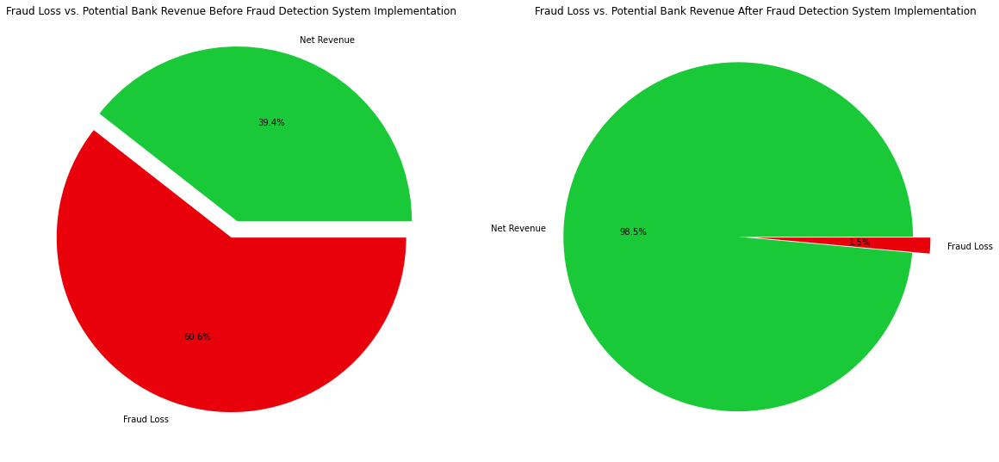

In [553]:
fig, ax = plt.subplots(1,2,figsize=(20, 10))


round(df_train['is_fraud'].value_counts(normalize=True),4)

colors = sns.color_palette('bright')[2:4]
label=["Net Revenue","Fraud Loss"]
#create pie chart
ax[1].pie([98.54,1.46],labels=label,colors = colors, autopct='%1.1f%%',explode=(0.1,0))
ax[1].set_title('Fraud Loss vs. Potential Bank Revenue After Fraud Detection System Implementation')
round(df_train['is_fraud'].value_counts(normalize=True),4)

colors = sns.color_palette('bright')[2:4]
label=["Net Revenue","Fraud Loss"]
#create pie chart
ax[0].pie([39.44,60.56],labels=label,colors = colors, autopct='%1.1f%%',explode=(0.1,0))
ax[0].set_title('Fraud Loss vs. Potential Bank Revenue Before Fraud Detection System Implementation')
plt.show()


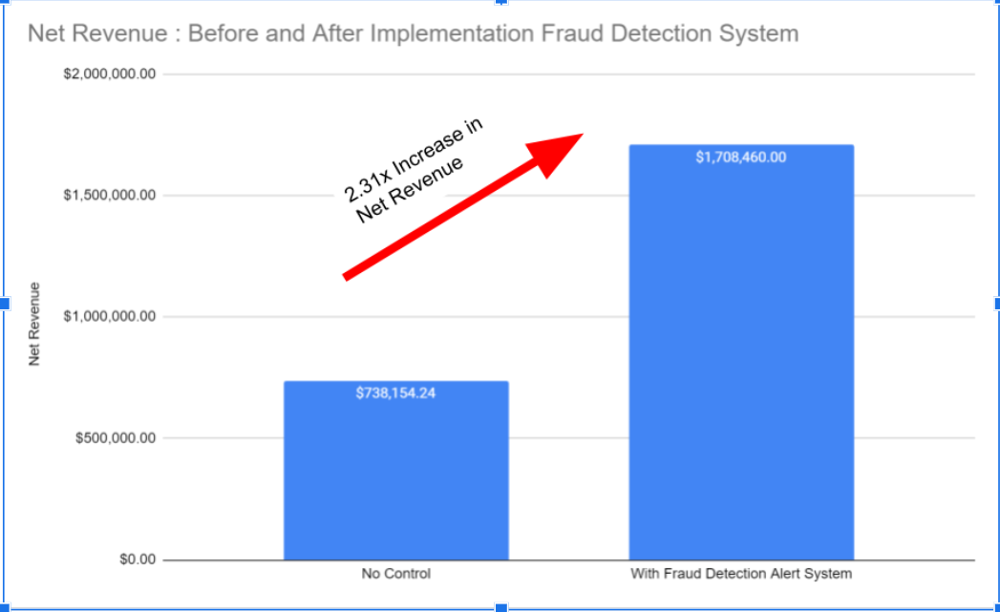

To analyze monetary benefit, I will use only test data since the essence of a fraud classifier is based on utilizing historical data to mitigate future losses. From the plots above we can infer that :

* Prior to implementing a fraud detection system, the bank loss 60.6% of its revenue to cover for fraud loss. Whereas after doing so, the bank was able to retain 98.5% of its revenue.
* The bank's net revenue grew 2.31 times after implementing a fraud detection system

In [557]:
df_train_2['classifier1_improvement']=hybrid_model2('classifier_1', 'classif1_imp', 0,df_train_2)['predicted']

In [560]:
print(classification_report(df_train_2['is_fraud'],df_train_2['classifier1_improvement']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00   1289169
           1       0.43      0.93      0.59      7506

    accuracy                           0.99   1296675
   macro avg       0.71      0.96      0.79   1296675
weighted avg       1.00      0.99      0.99   1296675



In [561]:
print(classification_report(df_test_2['is_fraud'],df_test_2['classifier1_improvement']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    553574
           1       0.32      0.84      0.46      2145

    accuracy                           0.99    555719
   macro avg       0.66      0.92      0.73    555719
weighted avg       1.00      0.99      0.99    555719



In [564]:
df_cf1_2

,Detection Rate,Genuine to Fraudulent Transaction Alert Ratio,Data
Hybrid Model with Classifier 1,93.09 %,1.33,Training Data
Hybrid Model with Classifier 1,84.06 %,2.17,Testing Data


* The classification reports above show that the model was able to obtain a 99% accuracy in both the training and the testing data. However this can clearly be attributed to class imbalance whereby since the fraud transacion is such a small minority, the accuracy doesn't bring any clarity to how well the model detects fraud.

* Both the models show a poor precision value of (43% for training set and 33% for testing set). From here, it is apparent that the model has a lot of false positives whereby this is also shown by the Genuine to Fraudulent Transaction Alert Ratio, which for the best model, the value is greater than 1. 

* Both models show a pretty good recall value (detection rate) of (93% for training set and 84% for testing set) but since the performance in the testing set hasn't reached the industry standard of 90% minimum detection rate further improvements shall be made to improve the detection rate. From the recall value, it is also apparent that there is an overfit in the training set as the model performs much better at a value of 9% higher recall than the testing set.

In [566]:
pd.crosstab(df_train_2['is_fraud'],df_train_2['classifier1_improvement'])

classifier1_improvement,0.0,1.0
is_fraud,,
0,1279889,9280
1,519,6987


In [565]:
pd.crosstab(df_test_2['is_fraud'],df_test_2['classifier1_improvement'])

classifier1_improvement,0.0,1.0
is_fraud,,
0,549655,3919
1,342,1803


As we can see from the confusion matrices above, the classifier failed to identify 519 fraud cases from the training set and 342 fraud cases from the testing set.

In conclusion the model's performance in the testing data is still not up to industry standard of performance (>= 90% detection rate) which could be attributed to :

* Needs more exploring of individual learners of the component of the stacked ensemble (H2o) : When individual learners perform poorly, the stacked ensemble will be most likely to
* Model needs to be evaluated more often. In this data, the training set is from Jan 2019-Jun 2020 and the testing set is from 21 Jun 2020-1 Jan 2021. Whereas in real life practice parameters are updated from a daily-weekly basis, depending on the fraud trends. Thus, it might be possible that the model that was created needs to be implemented in small increments of time (e.g: model training every week or so)
* Data credibility : Since this data is created by a simulator, some parts of the data is not in line with real life situations (e.g : physical merchants and cc holder are in different countries but the transaction is classified as genuine).